In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r tau
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
#model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 200s - loss: 3.3184e-04
Epoch 2/10
 - 207s - loss: 3.5989e-05
Epoch 3/10
 - 204s - loss: 3.0565e-05
Epoch 4/10
 - 204s - loss: 2.8879e-05
Epoch 5/10
 - 204s - loss: 2.8284e-05
Epoch 6/10
 - 203s - loss: 2.7737e-05
Epoch 7/10
 - 203s - loss: 2.6962e-05
Epoch 8/10
 - 199s - loss: 2.6564e-05
Epoch 9/10
 - 191s - loss: 2.6089e-05
Epoch 10/10
 - 190s - loss: 2.6193e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.2096 RMSE


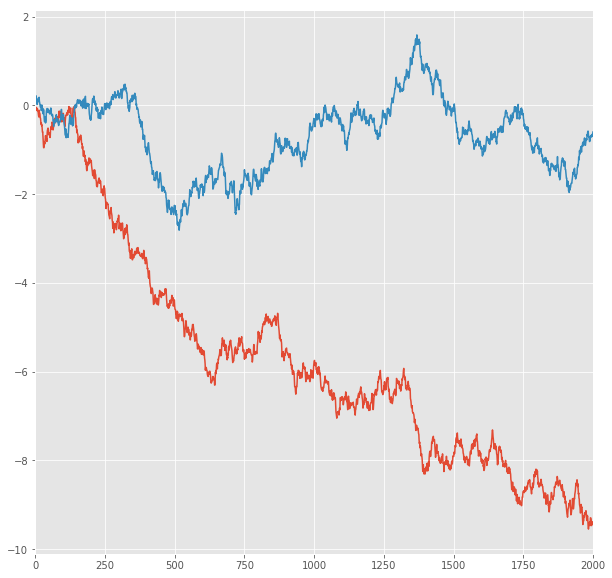

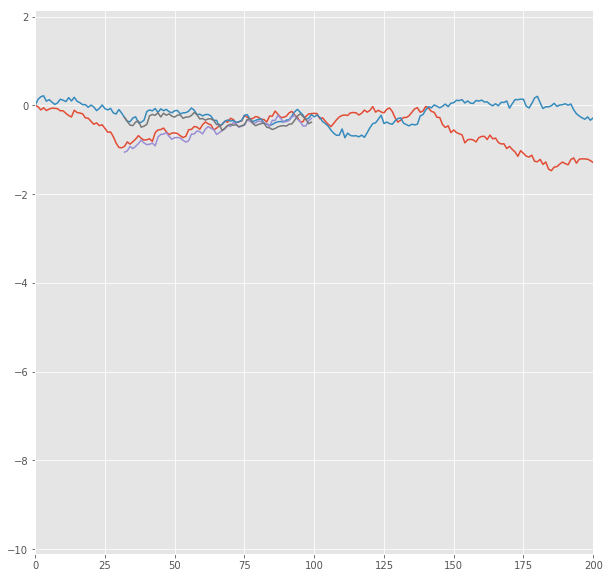

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.2219 RMSE
Predict Score for 1 -steps forecast: 0.2269 RMSE
Error Test Score for 1 -steps forecast: 0.0787 RMSE
RT Test Score for 1 -steps forecast: 0.1268 RMSE
Error Test Corr for 1 -steps forecast: 0.9811
RT Test Corr for 1 -steps forecast: 0.9582


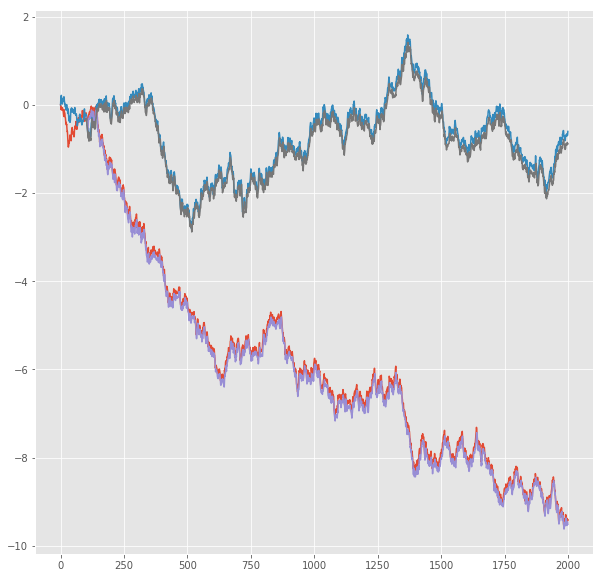

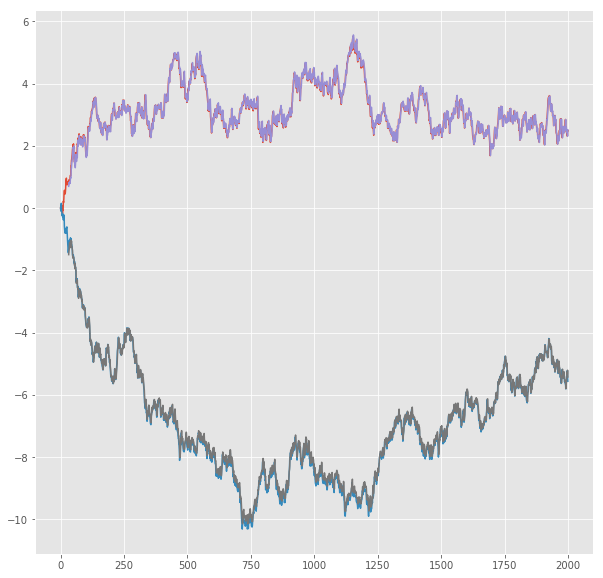

R^2 score for regression on Error: 0.9625
k = 1.0029


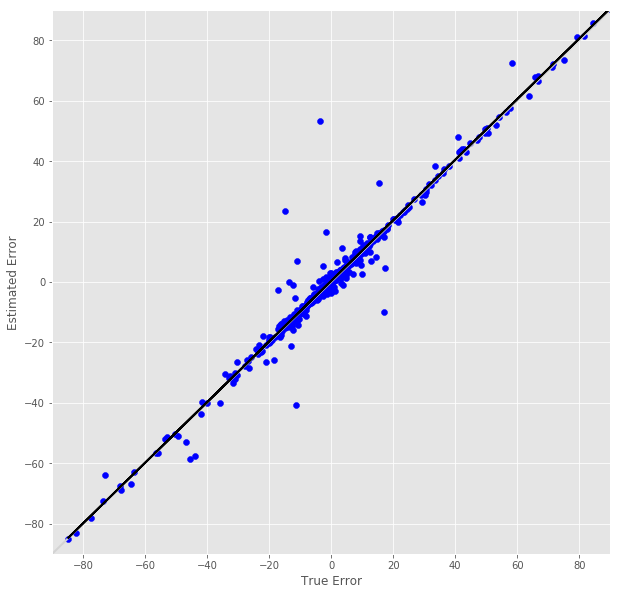

R^2 score for regression on RT: 0.9182
k = 0.9654


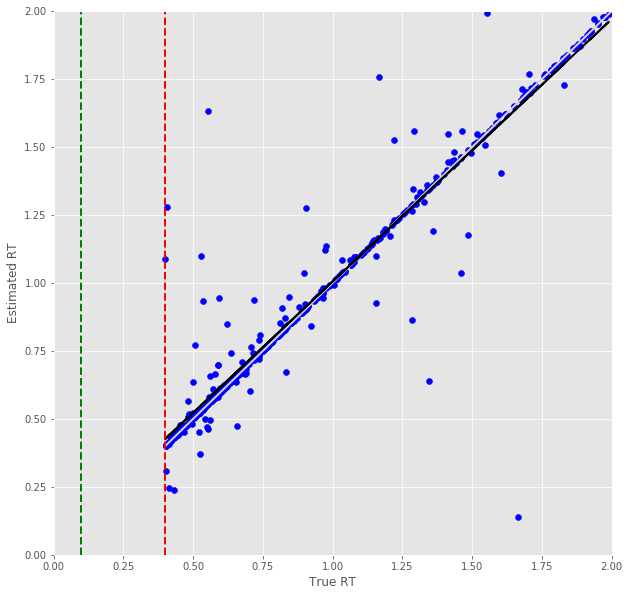

Error Prediction Score: 0.0604 RMSE
RT Prediction Score: 0.1130 RMSE
Error Prediction Corr: 0.9877
RT Prediction Corr: 0.9712
R^2 score for regression on Error: 0.9756
k = 1.0337


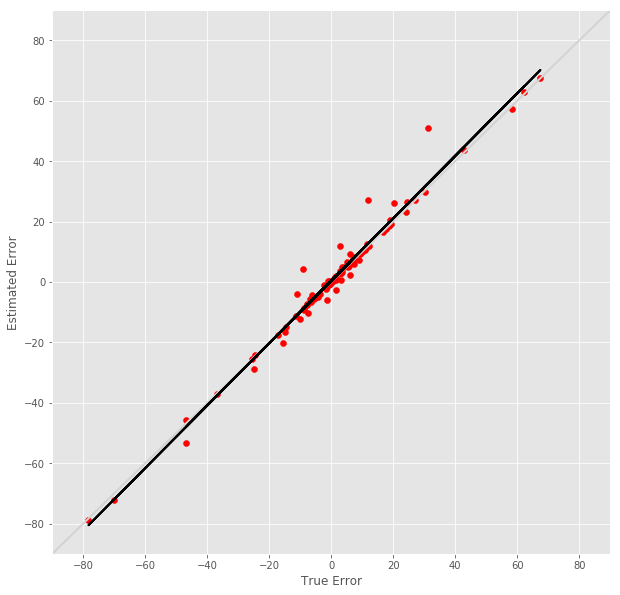

R^2 score for regression on RT: 0.9433
k = 0.9977


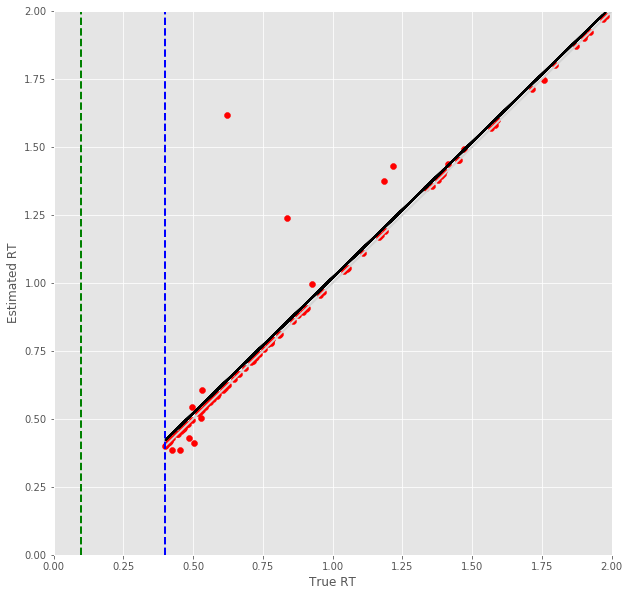

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.3569 RMSE
Predict Score for 2 -steps forecast: 0.3588 RMSE
Error Test Score for 2 -steps forecast: 0.1202 RMSE
RT Test Score for 2 -steps forecast: 0.1726 RMSE
Error Test Corr for 2 -steps forecast: 0.9574
RT Test Corr for 2 -steps forecast: 0.9245


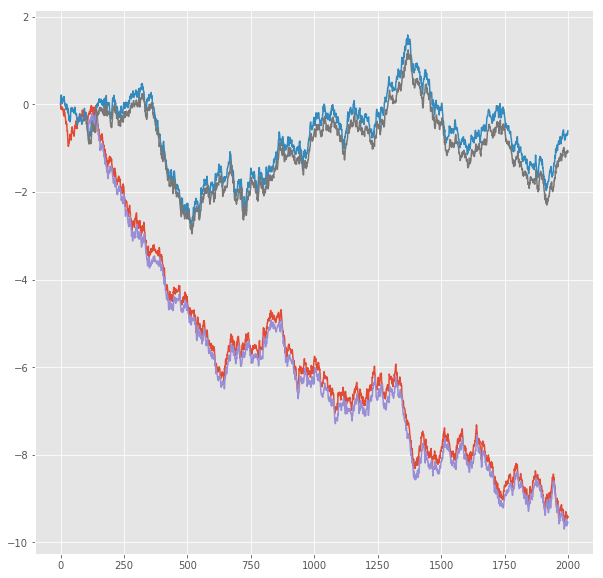

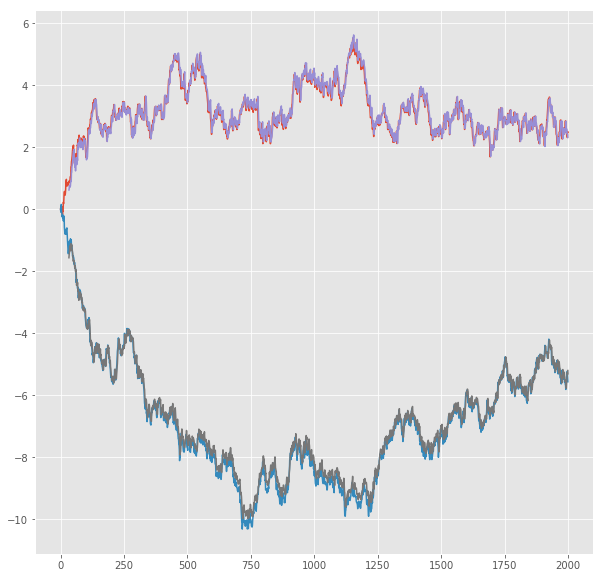

R^2 score for regression on Error: 0.9167
k = 0.9913


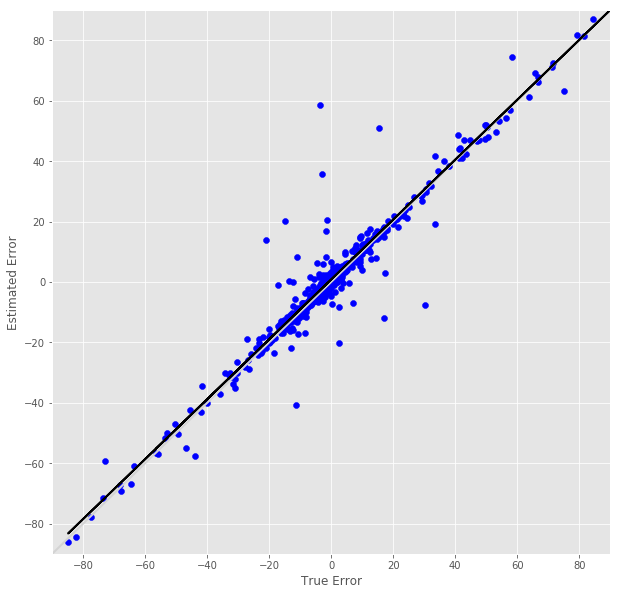

R^2 score for regression on RT: 0.8548
k = 0.9464


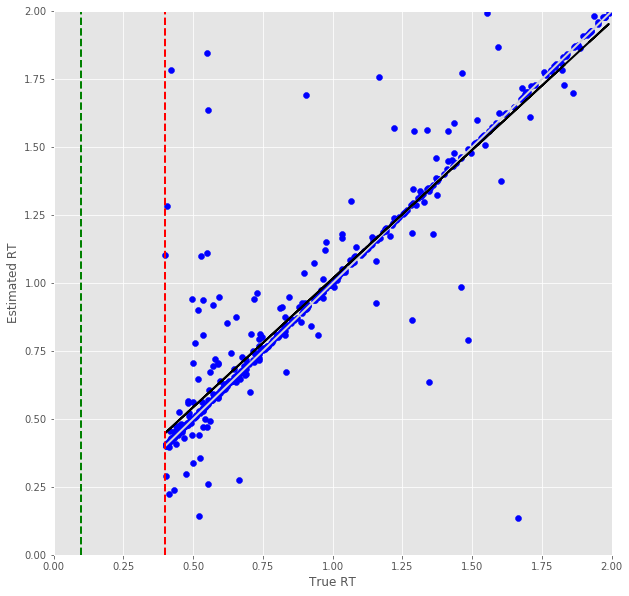

Error Prediction Score: 0.0753 RMSE
RT Prediction Score: 0.1646 RMSE
Error Prediction Corr: 0.9818
RT Prediction Corr: 0.9403
R^2 score for regression on Error: 0.9640
k = 1.0457


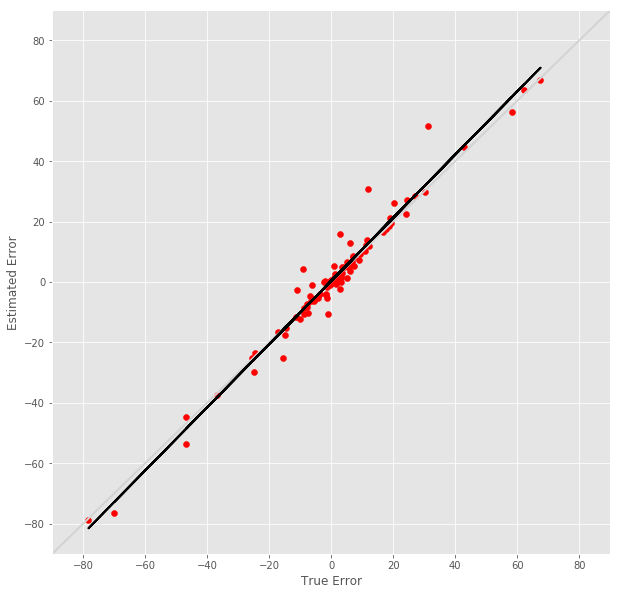

R^2 score for regression on RT: 0.8842
k = 0.9894


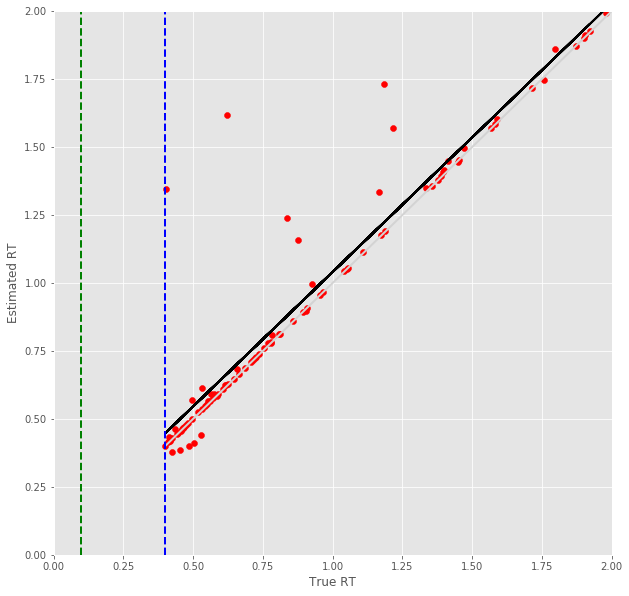

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.4814 RMSE
Predict Score for 3 -steps forecast: 0.4786 RMSE
Error Test Score for 3 -steps forecast: 0.1653 RMSE
RT Test Score for 3 -steps forecast: 0.2269 RMSE
Error Test Corr for 3 -steps forecast: 0.9211
RT Test Corr for 3 -steps forecast: 0.8706


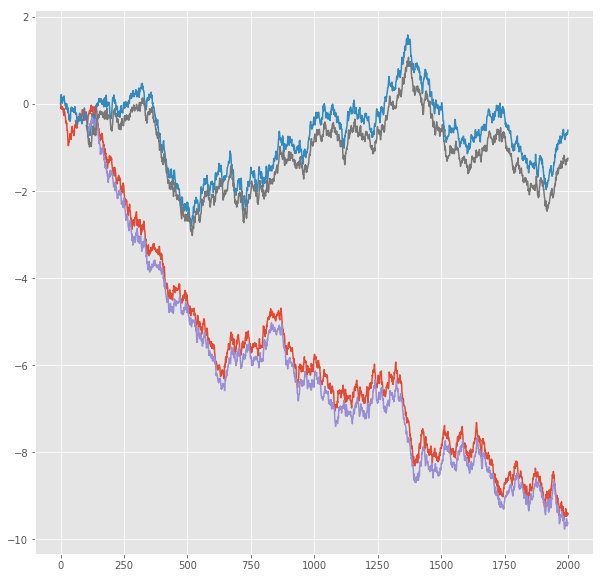

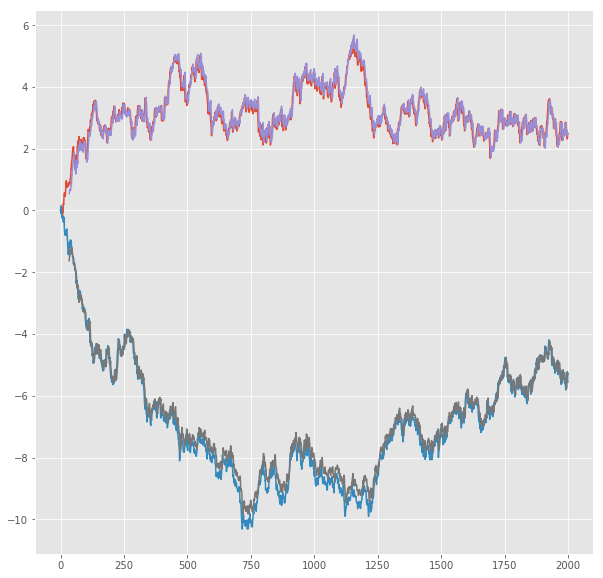

R^2 score for regression on Error: 0.8485
k = 0.9599


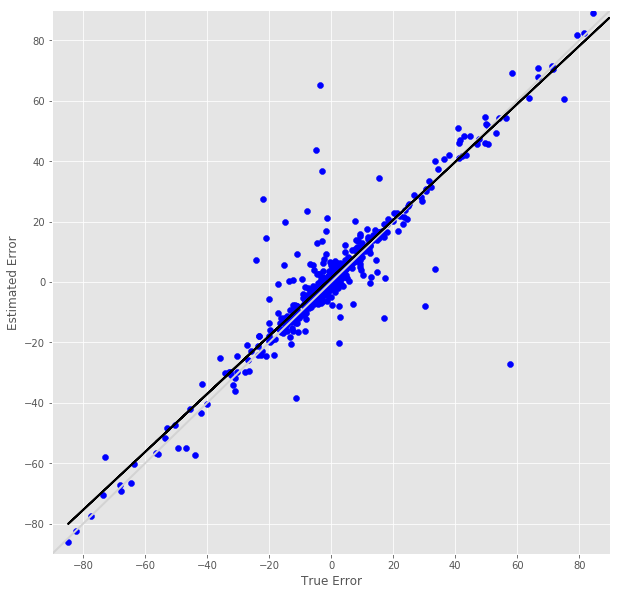

R^2 score for regression on RT: 0.7579
k = 0.9140


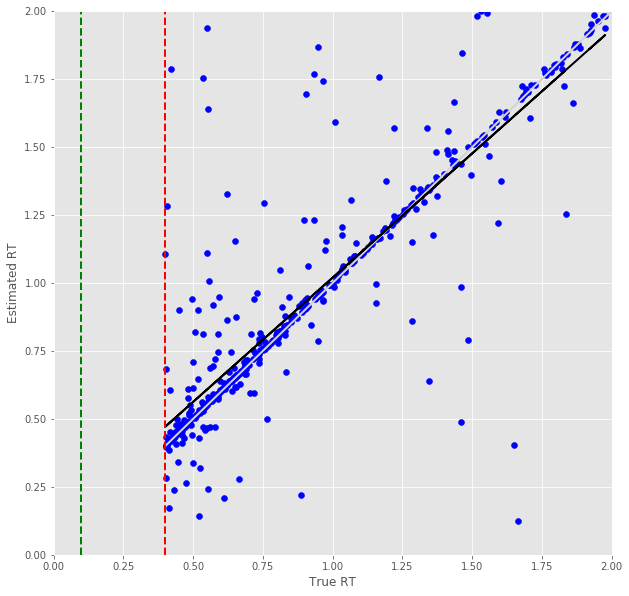

Error Prediction Score: 0.0878 RMSE
RT Prediction Score: 0.1754 RMSE
Error Prediction Corr: 0.9740
RT Prediction Corr: 0.9306
R^2 score for regression on Error: 0.9486
k = 1.0252


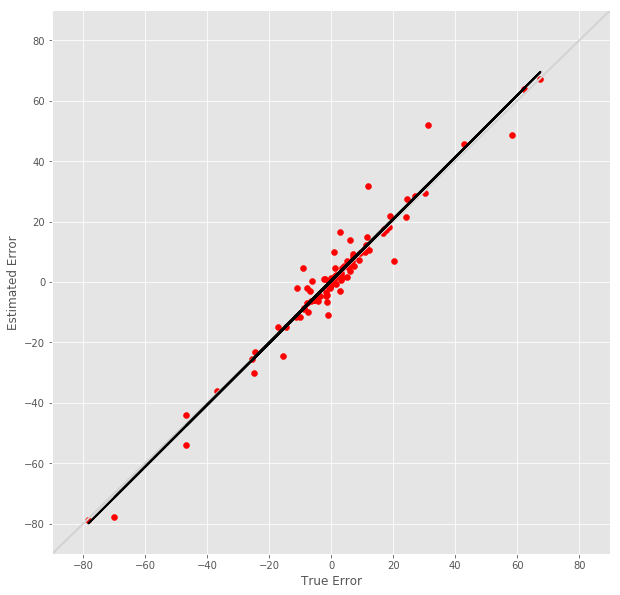

R^2 score for regression on RT: 0.8661
k = 0.9985


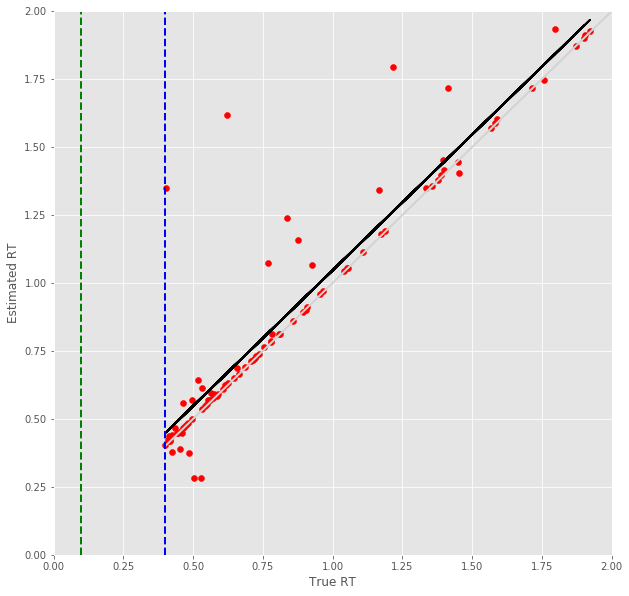

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.6009 RMSE
Predict Score for 4 -steps forecast: 0.5927 RMSE
Error Test Score for 4 -steps forecast: 0.2060 RMSE
RT Test Score for 4 -steps forecast: 0.2540 RMSE
Error Test Corr for 4 -steps forecast: 0.8800
RT Test Corr for 4 -steps forecast: 0.8363


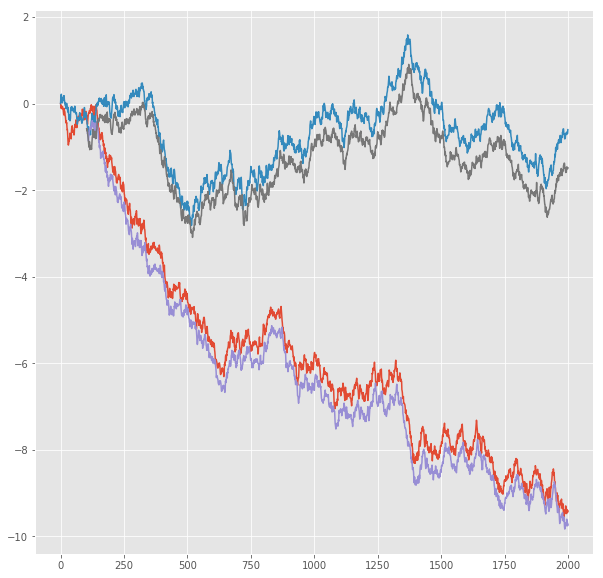

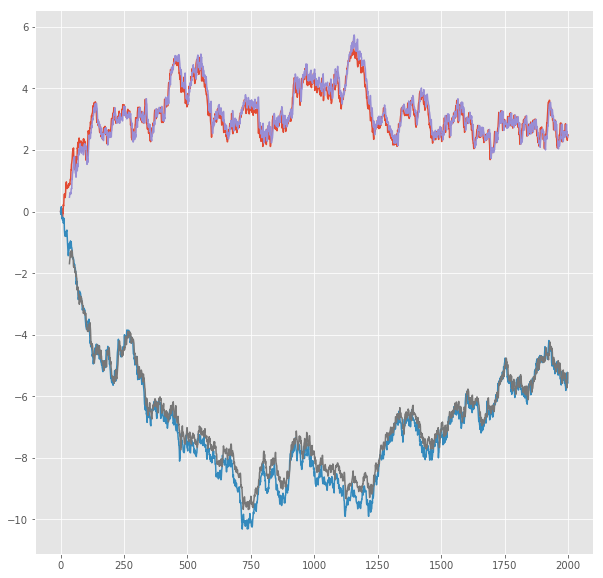

R^2 score for regression on Error: 0.7745
k = 0.9416


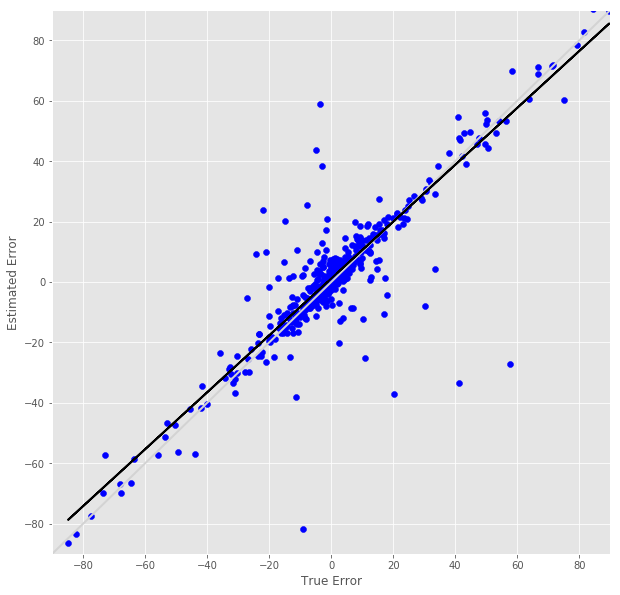

R^2 score for regression on RT: 0.6994
k = 0.8786


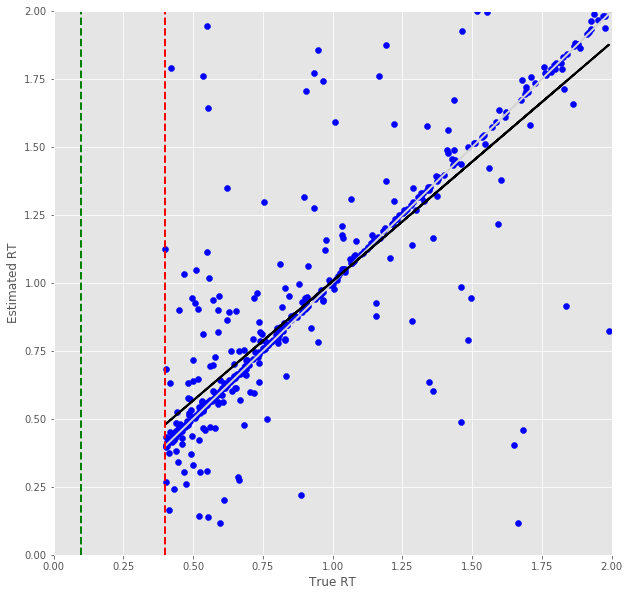

Error Prediction Score: 0.1432 RMSE
RT Prediction Score: 0.2144 RMSE
Error Prediction Corr: 0.9362
RT Prediction Corr: 0.8942
R^2 score for regression on Error: 0.8765
k = 1.0317


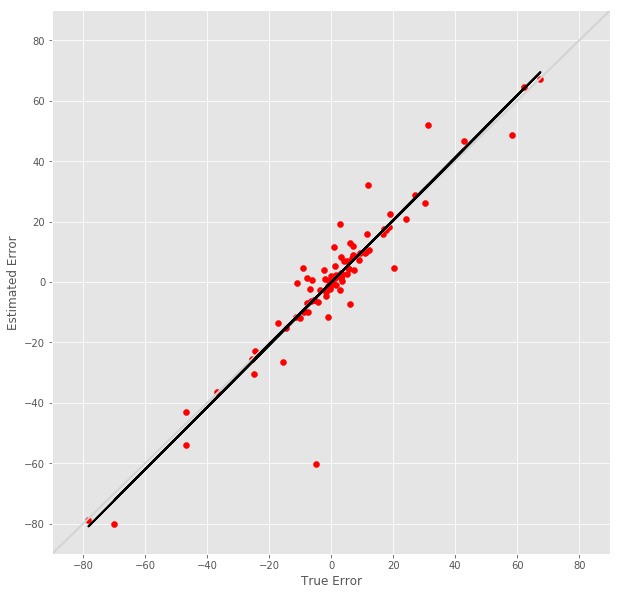

R^2 score for regression on RT: 0.7997
k = 0.9878


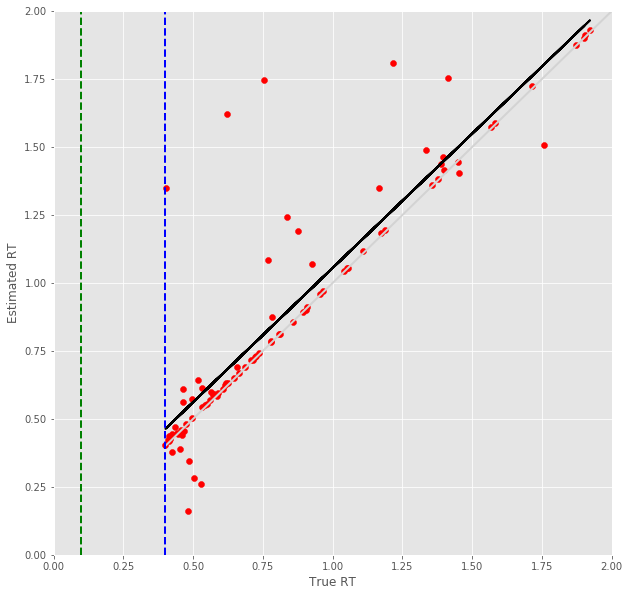

5 -step(s) forecast:
Test Score for 5 -steps forecast: 0.7172 RMSE
Predict Score for 5 -steps forecast: 0.7028 RMSE
Error Test Score for 5 -steps forecast: 0.2332 RMSE
RT Test Score for 5 -steps forecast: 0.2881 RMSE
Error Test Corr for 5 -steps forecast: 0.8543
RT Test Corr for 5 -steps forecast: 0.7850


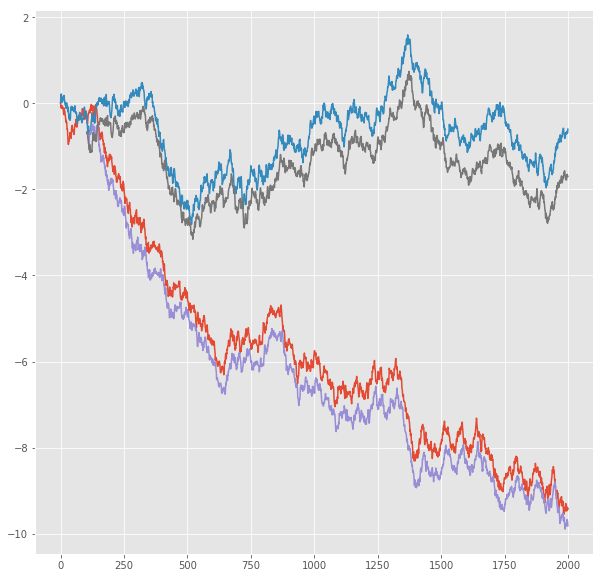

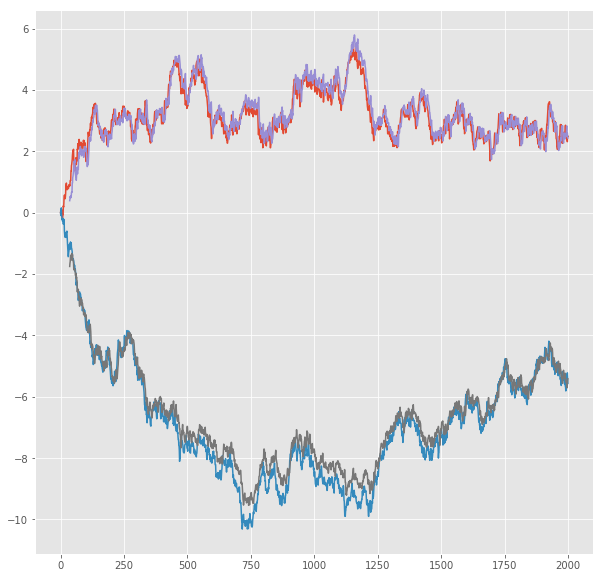

R^2 score for regression on Error: 0.7299
k = 0.9370


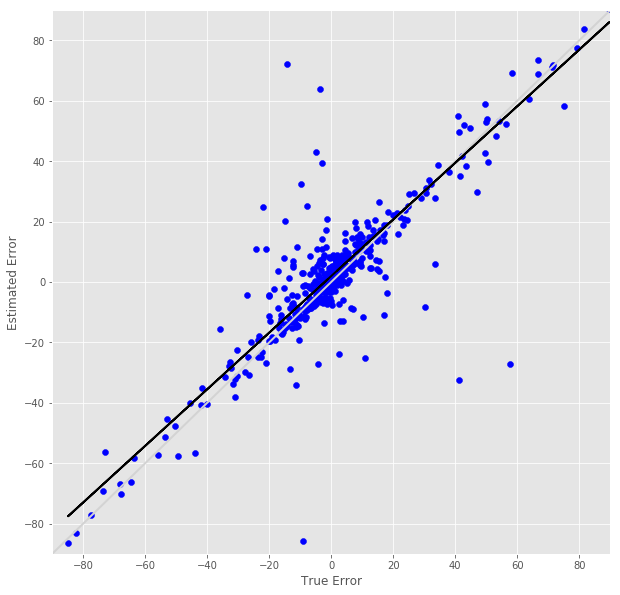

R^2 score for regression on RT: 0.6162
k = 0.8246


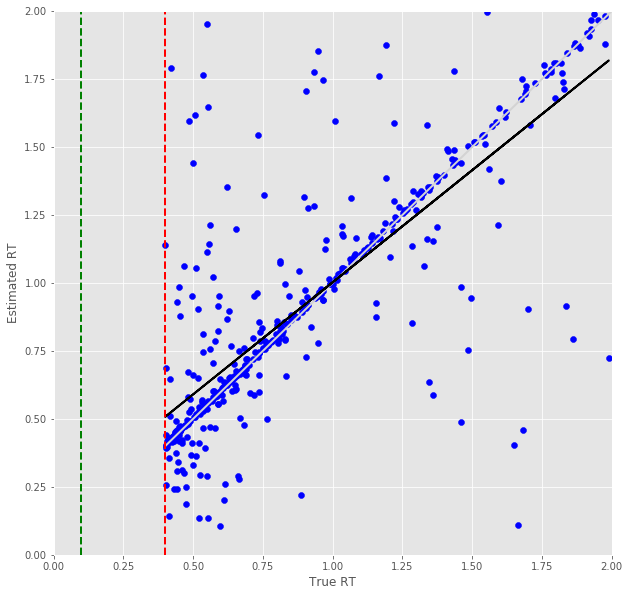

Error Prediction Score: 0.2630 RMSE
RT Prediction Score: 0.2838 RMSE
Error Prediction Corr: 0.8437
RT Prediction Corr: 0.7931
R^2 score for regression on Error: 0.7119
k = 1.0935


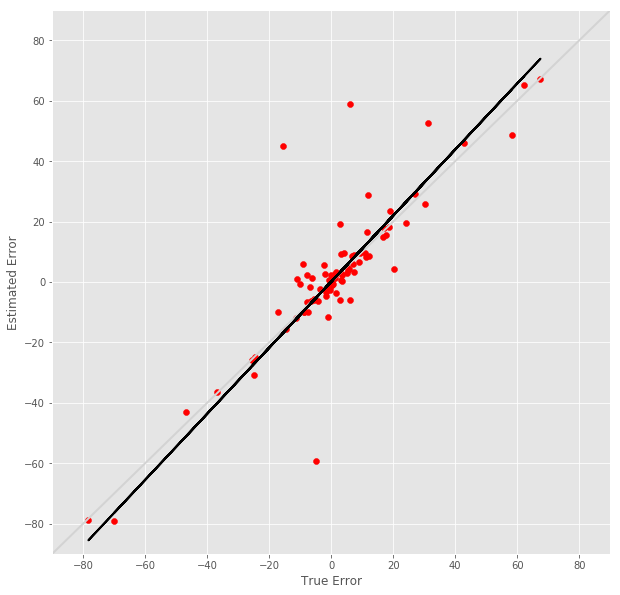

R^2 score for regression on RT: 0.6290
k = 0.8819


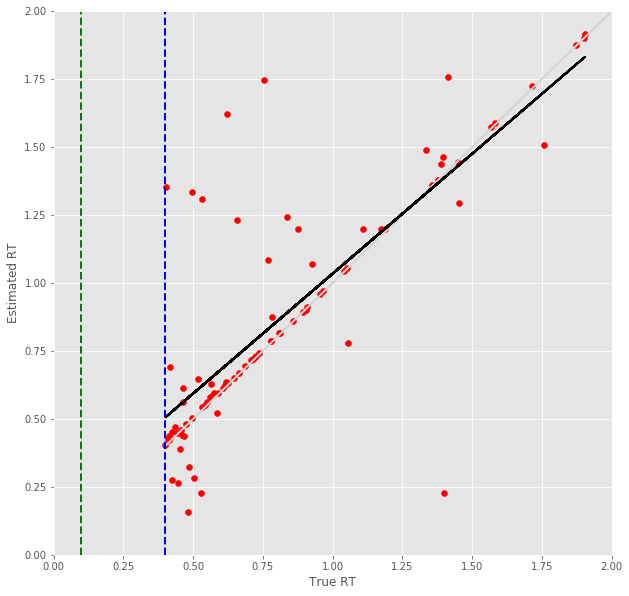

6 -step(s) forecast:
Test Score for 6 -steps forecast: 0.8308 RMSE
Predict Score for 6 -steps forecast: 0.8096 RMSE
Error Test Score for 6 -steps forecast: 0.2600 RMSE
RT Test Score for 6 -steps forecast: 0.3003 RMSE
Error Test Corr for 6 -steps forecast: 0.8293
RT Test Corr for 6 -steps forecast: 0.7714


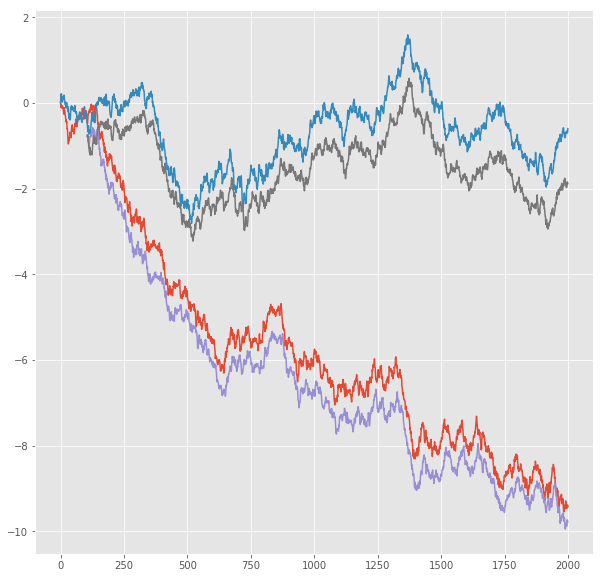

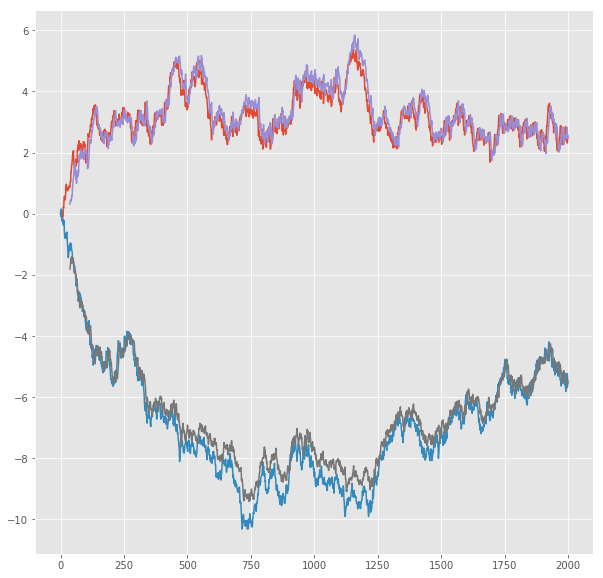

R^2 score for regression on Error: 0.6878
k = 0.9403


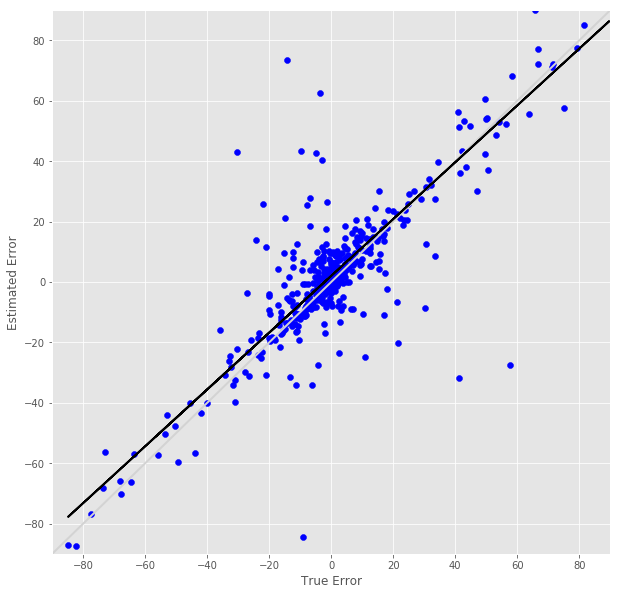

R^2 score for regression on RT: 0.5951
k = 0.8152


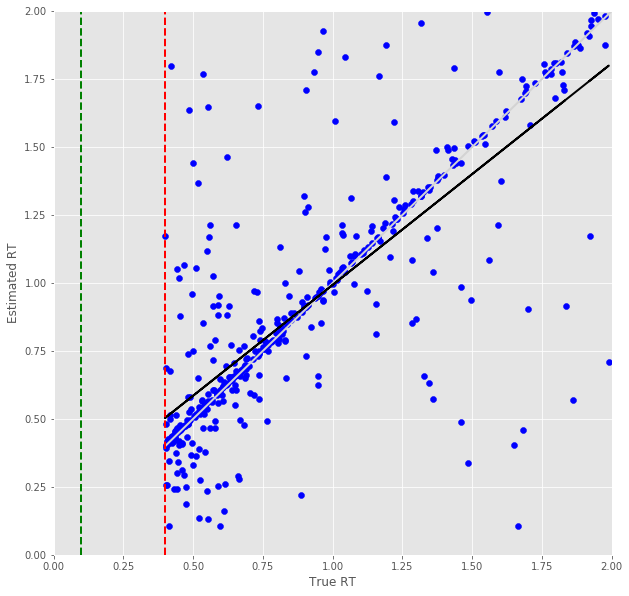

Error Prediction Score: 0.2712 RMSE
RT Prediction Score: 0.3008 RMSE
Error Prediction Corr: 0.8418
RT Prediction Corr: 0.7647
R^2 score for regression on Error: 0.7086
k = 1.1143


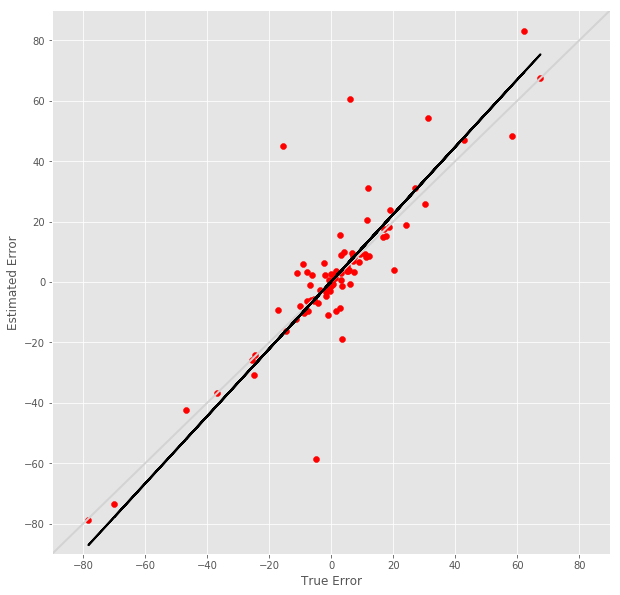

R^2 score for regression on RT: 0.5847
k = 0.8551


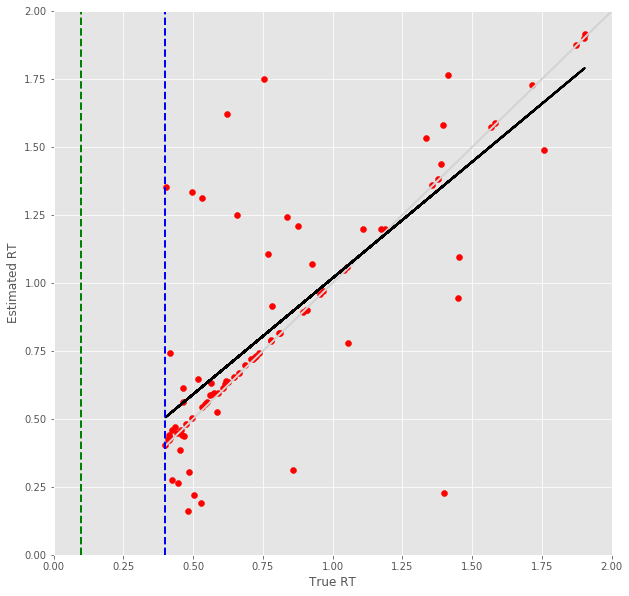

7 -step(s) forecast:
Test Score for 7 -steps forecast: 0.9419 RMSE
Predict Score for 7 -steps forecast: 0.9136 RMSE
Error Test Score for 7 -steps forecast: 0.2874 RMSE
RT Test Score for 7 -steps forecast: 0.3159 RMSE
Error Test Corr for 7 -steps forecast: 0.8001
RT Test Corr for 7 -steps forecast: 0.7529


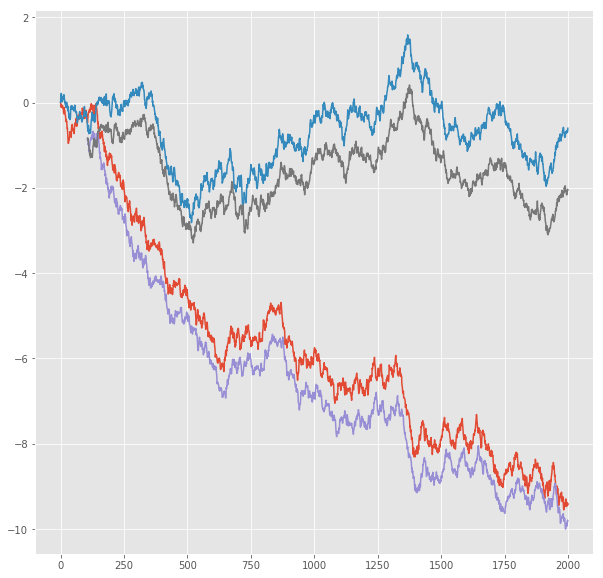

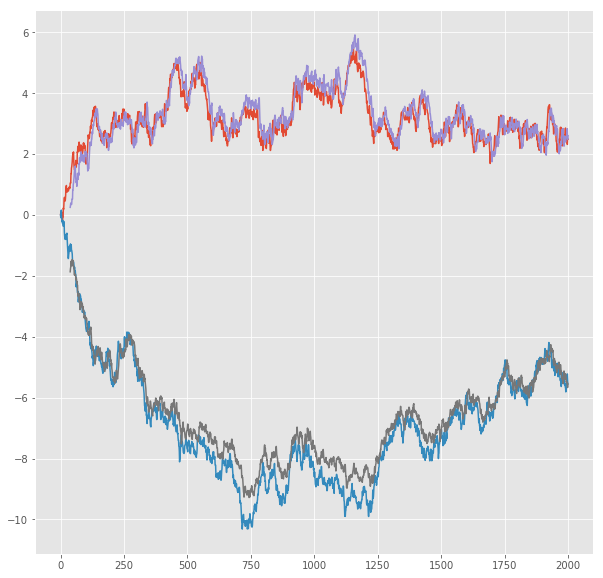

R^2 score for regression on Error: 0.6402
k = 0.9434


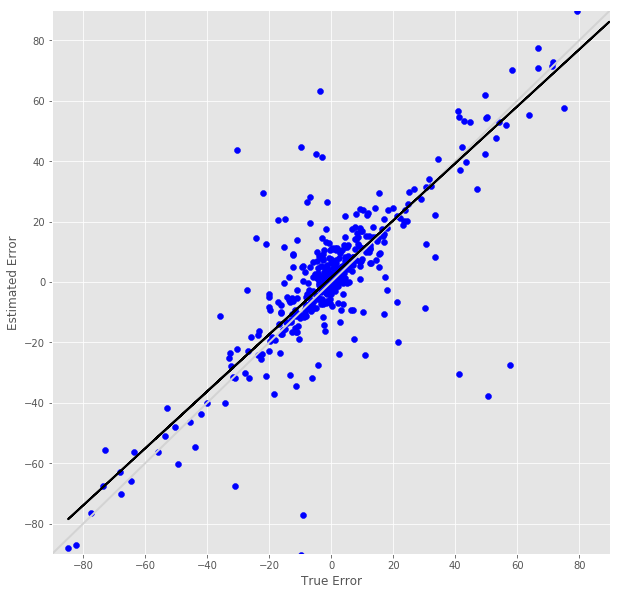

R^2 score for regression on RT: 0.5668
k = 0.8109


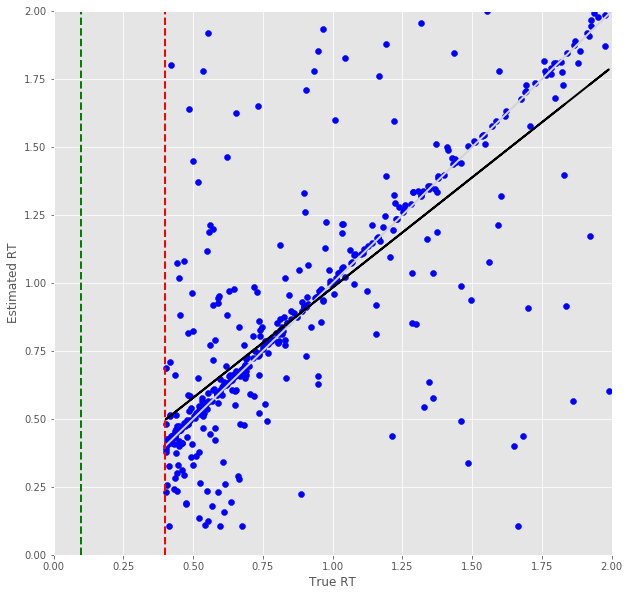

Error Prediction Score: 0.2894 RMSE
RT Prediction Score: 0.2913 RMSE
Error Prediction Corr: 0.8169
RT Prediction Corr: 0.7776
R^2 score for regression on Error: 0.6673
k = 1.0770


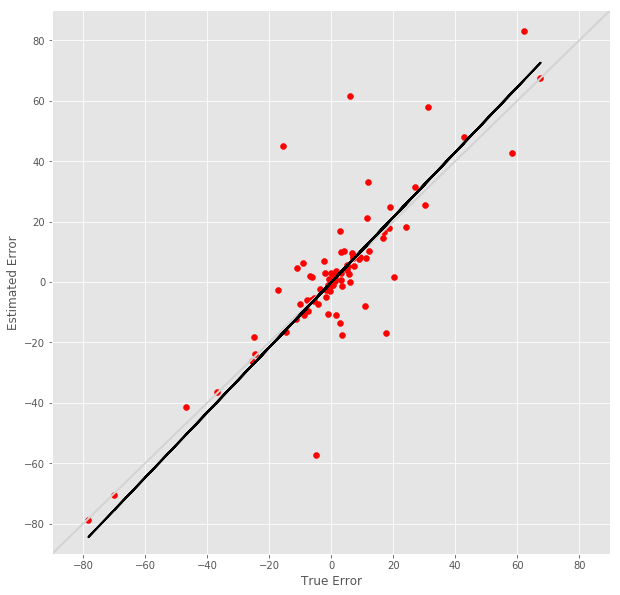

R^2 score for regression on RT: 0.6047
k = 0.8590


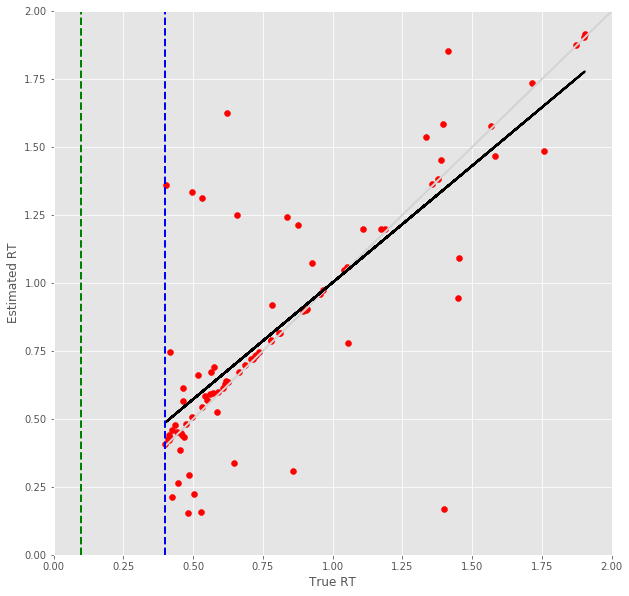

8 -step(s) forecast:
Test Score for 8 -steps forecast: 1.0507 RMSE
Predict Score for 8 -steps forecast: 1.0150 RMSE
Error Test Score for 8 -steps forecast: 0.3050 RMSE
RT Test Score for 8 -steps forecast: 0.3449 RMSE
Error Test Corr for 8 -steps forecast: 0.7862
RT Test Corr for 8 -steps forecast: 0.6994


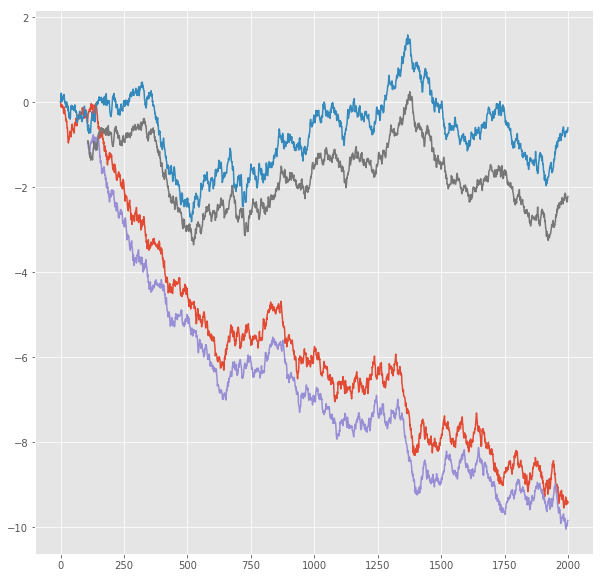

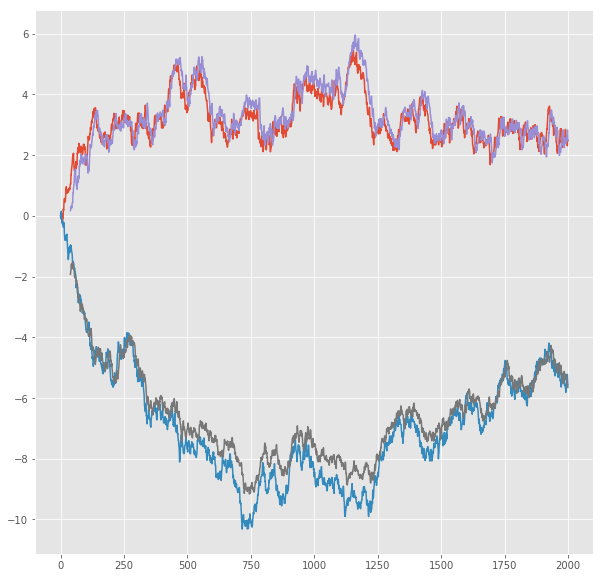

R^2 score for regression on Error: 0.6182
k = 0.9496


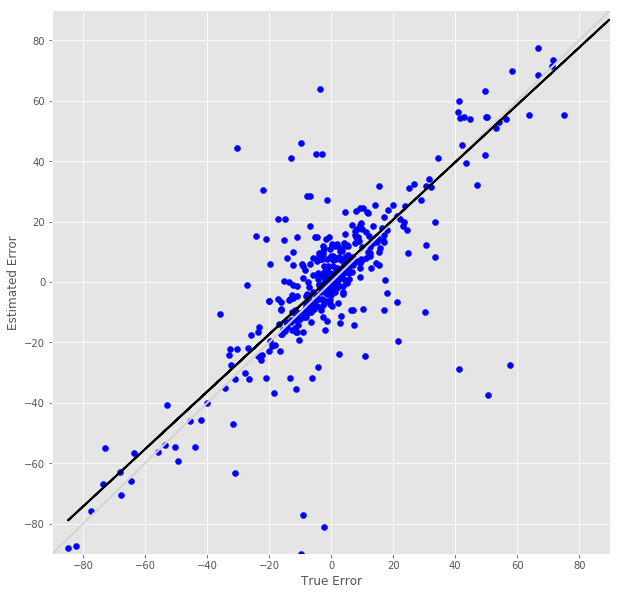

R^2 score for regression on RT: 0.4892
k = 0.7530


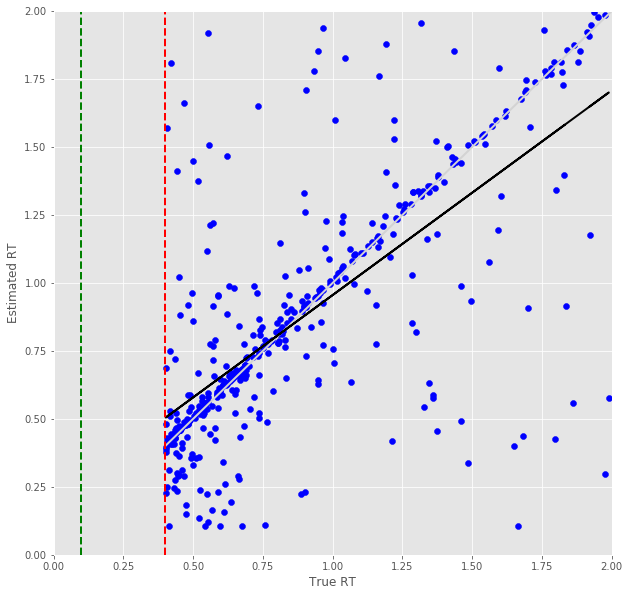

Error Prediction Score: 0.3016 RMSE
RT Prediction Score: 0.3530 RMSE
Error Prediction Corr: 0.8022
RT Prediction Corr: 0.6773
R^2 score for regression on Error: 0.6435
k = 1.0665


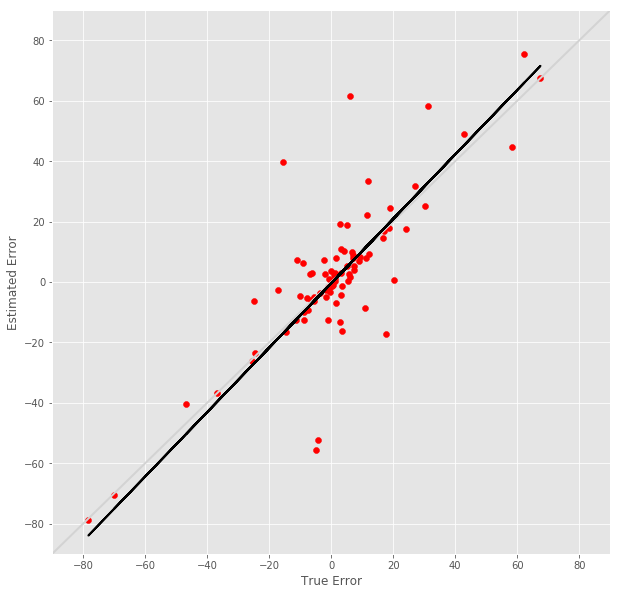

R^2 score for regression on RT: 0.4587
k = 0.7634


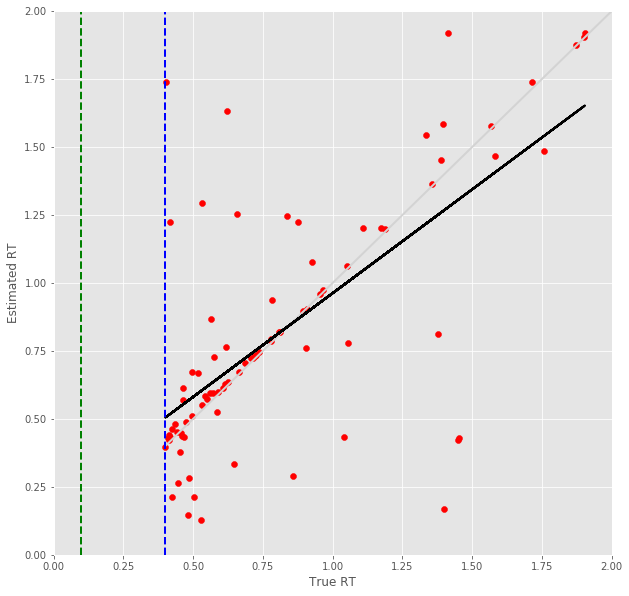

9 -step(s) forecast:
Test Score for 9 -steps forecast: 1.1574 RMSE
Predict Score for 9 -steps forecast: 1.1141 RMSE
Error Test Score for 9 -steps forecast: 0.3219 RMSE
RT Test Score for 9 -steps forecast: 0.3689 RMSE
Error Test Corr for 9 -steps forecast: 0.7712
RT Test Corr for 9 -steps forecast: 0.6593


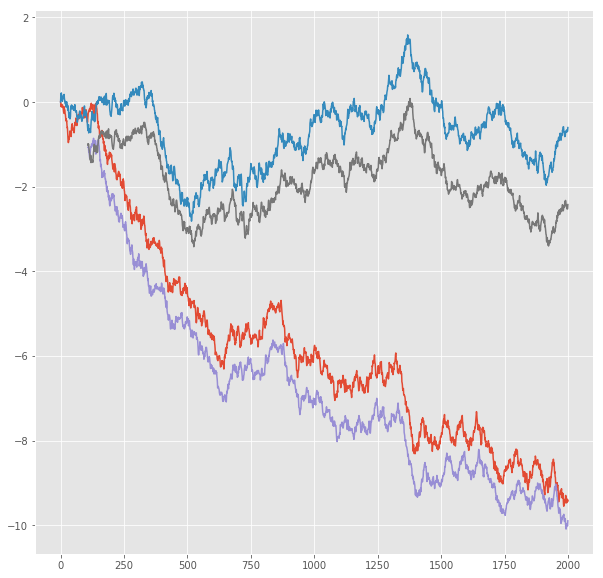

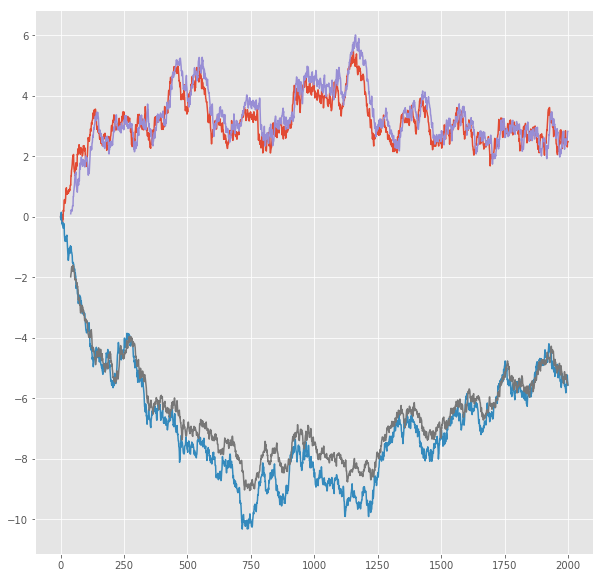

R^2 score for regression on Error: 0.5948
k = 0.9455


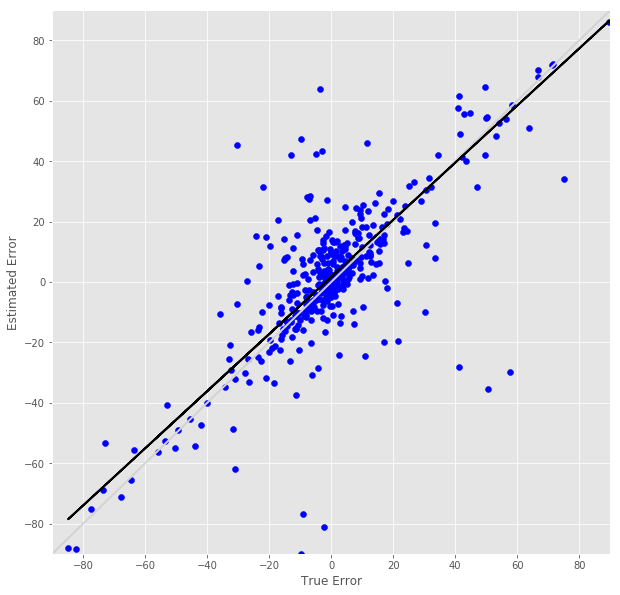

R^2 score for regression on RT: 0.4346
k = 0.7175


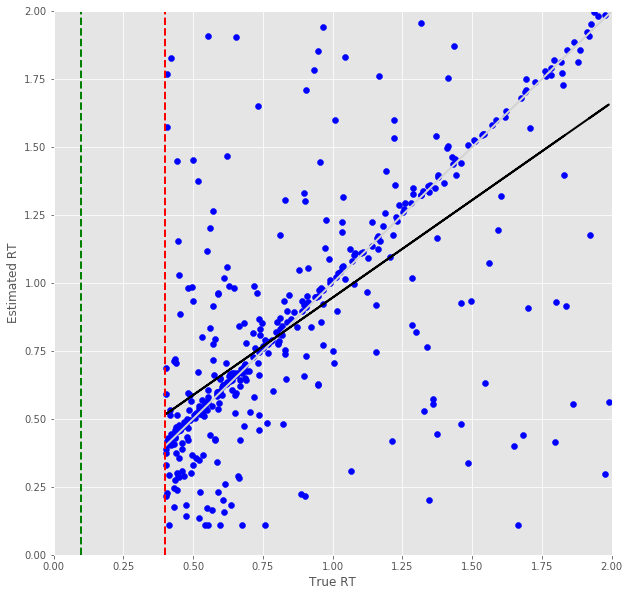

Error Prediction Score: 0.3673 RMSE
RT Prediction Score: 0.3629 RMSE
Error Prediction Corr: 0.7328
RT Prediction Corr: 0.6758
R^2 score for regression on Error: 0.5370
k = 1.0458


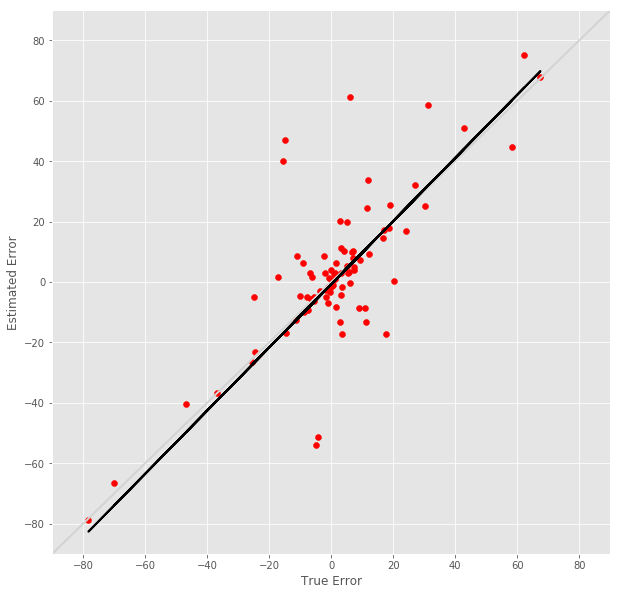

R^2 score for regression on RT: 0.4566
k = 0.7469


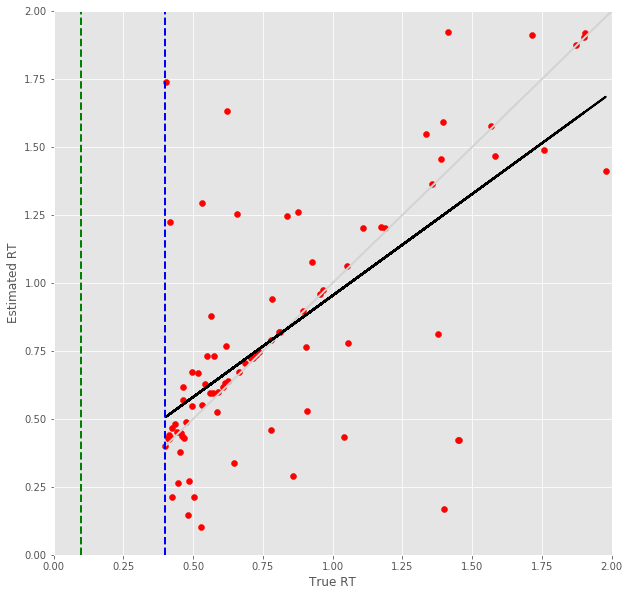

10 -step(s) forecast:
Test Score for 10 -steps forecast: 1.2620 RMSE
Predict Score for 10 -steps forecast: 1.2112 RMSE
Error Test Score for 10 -steps forecast: 0.3636 RMSE
RT Test Score for 10 -steps forecast: 0.3881 RMSE
Error Test Corr for 10 -steps forecast: 0.7341
RT Test Corr for 10 -steps forecast: 0.6328


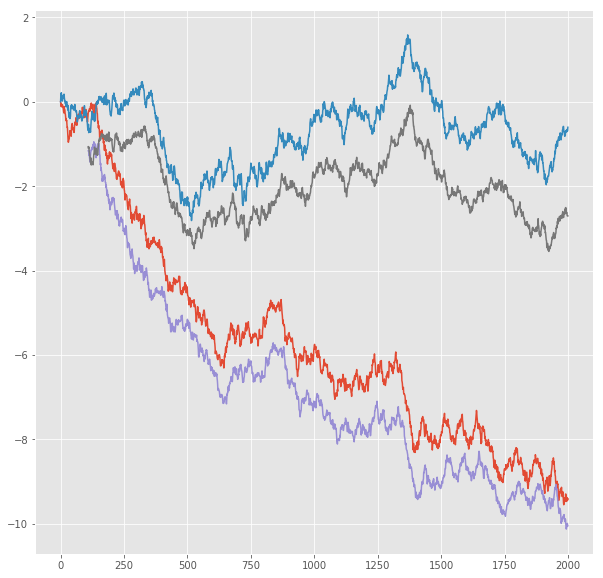

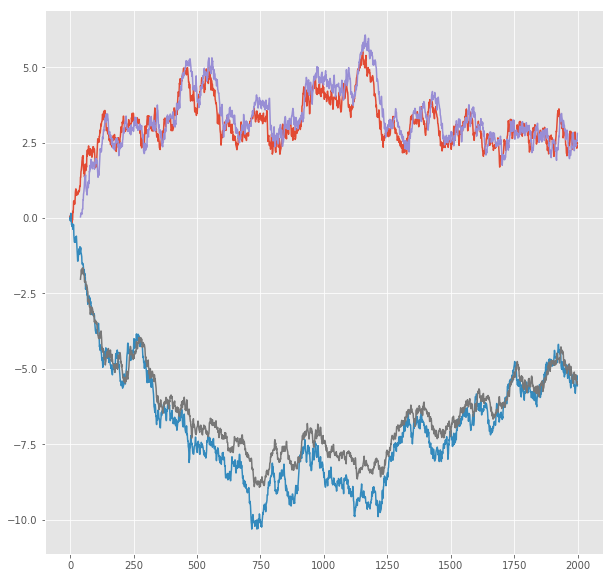

R^2 score for regression on Error: 0.5389
k = 0.9586


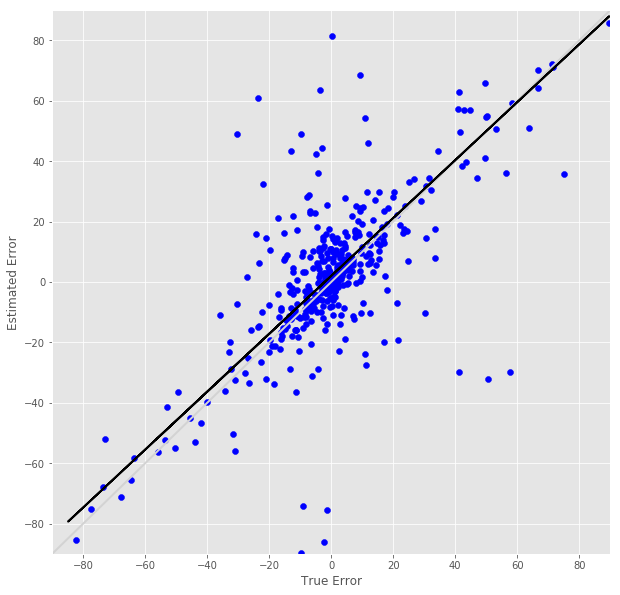

R^2 score for regression on RT: 0.4004
k = 0.7039


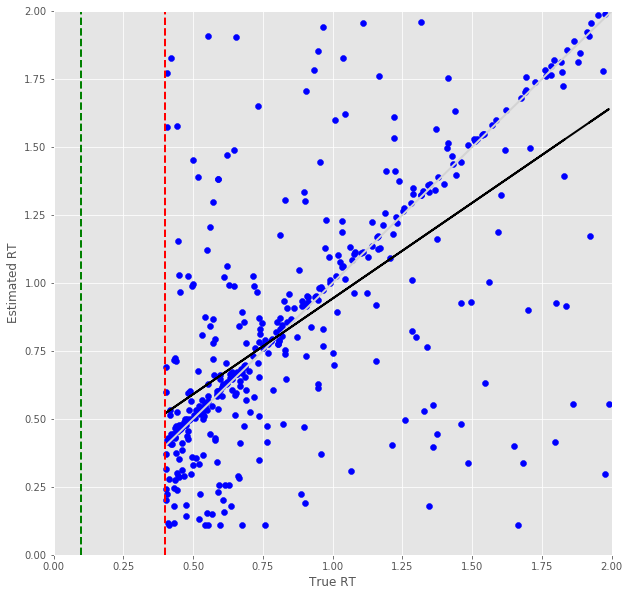

Error Prediction Score: 0.3983 RMSE
RT Prediction Score: 0.4031 RMSE
Error Prediction Corr: 0.6338
RT Prediction Corr: 0.5678
R^2 score for regression on Error: 0.4017
k = 0.9327


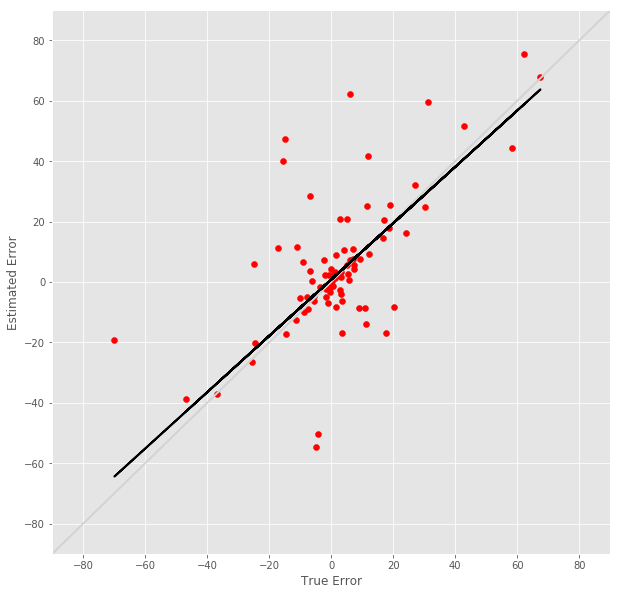

R^2 score for regression on RT: 0.3224
k = 0.6218


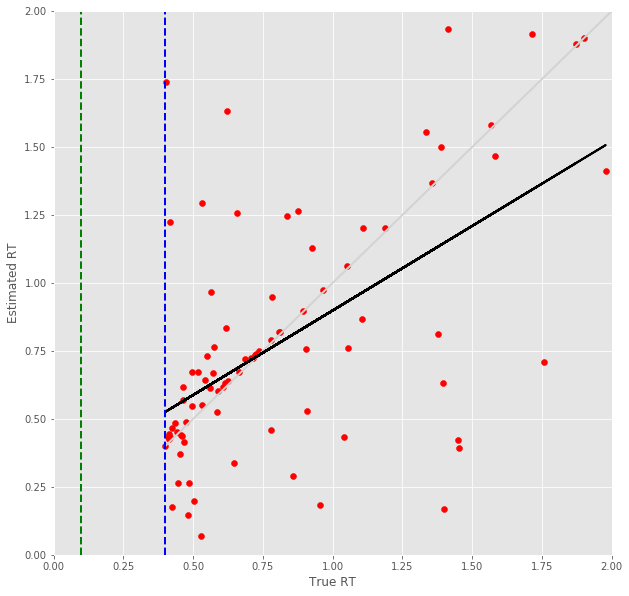

11 -step(s) forecast:
Test Score for 11 -steps forecast: 1.3648 RMSE
Predict Score for 11 -steps forecast: 1.3064 RMSE
Error Test Score for 11 -steps forecast: 0.3729 RMSE
RT Test Score for 11 -steps forecast: 0.4102 RMSE
Error Test Corr for 11 -steps forecast: 0.7267
RT Test Corr for 11 -steps forecast: 0.5982


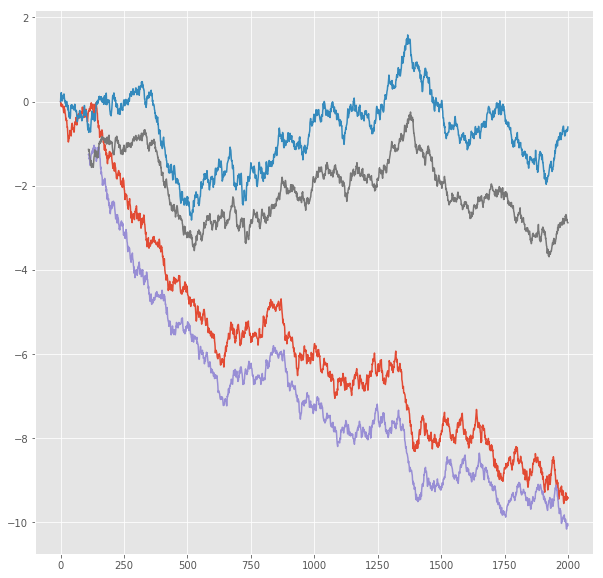

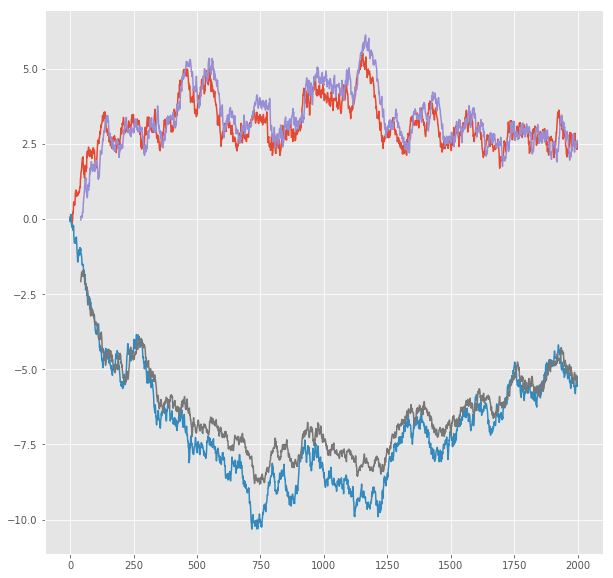

R^2 score for regression on Error: 0.5281
k = 0.9595


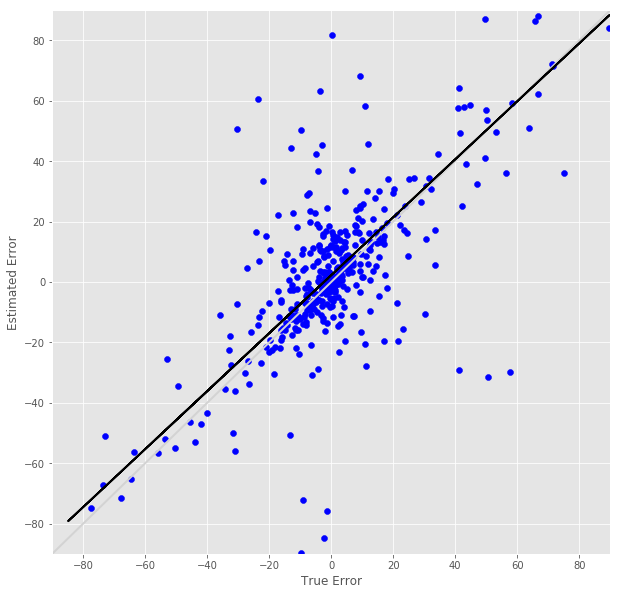

R^2 score for regression on RT: 0.3578
k = 0.6723


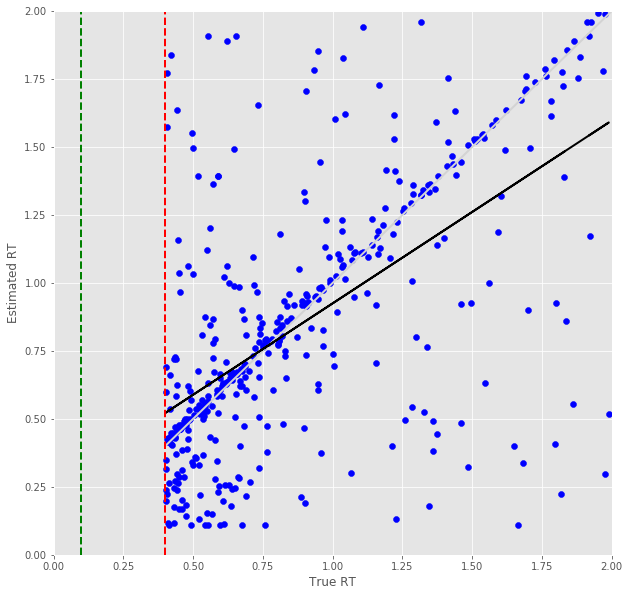

Error Prediction Score: 0.3995 RMSE
RT Prediction Score: 0.4082 RMSE
Error Prediction Corr: 0.6347
RT Prediction Corr: 0.5594
R^2 score for regression on Error: 0.4028
k = 0.9368


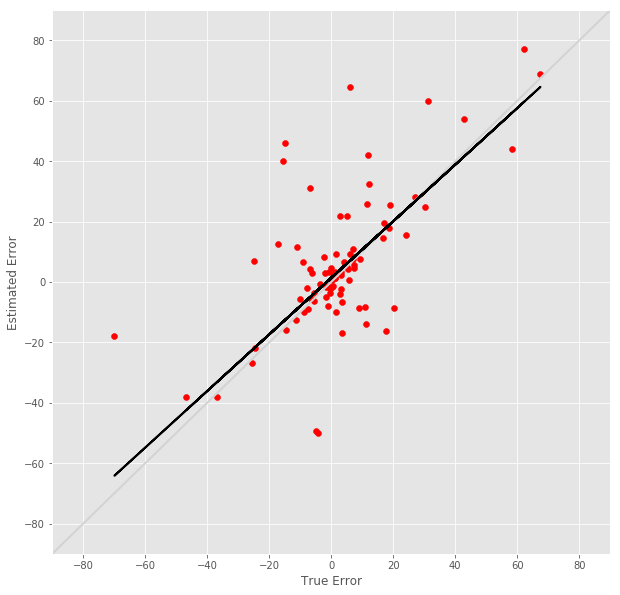

R^2 score for regression on RT: 0.3129
k = 0.6165


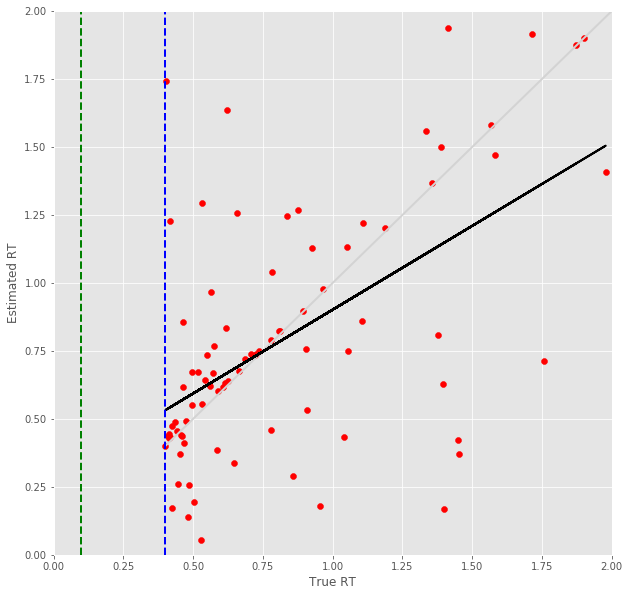

12 -step(s) forecast:
Test Score for 12 -steps forecast: 1.4659 RMSE
Predict Score for 12 -steps forecast: 1.3998 RMSE
Error Test Score for 12 -steps forecast: 0.3865 RMSE
RT Test Score for 12 -steps forecast: 0.4228 RMSE
Error Test Corr for 12 -steps forecast: 0.7249
RT Test Corr for 12 -steps forecast: 0.5805


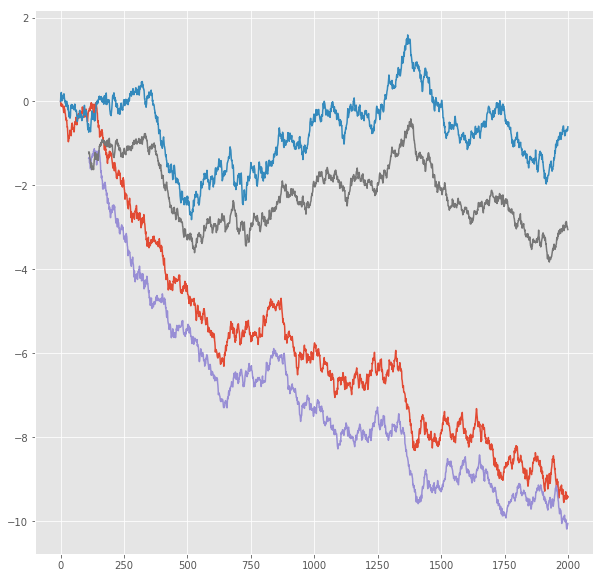

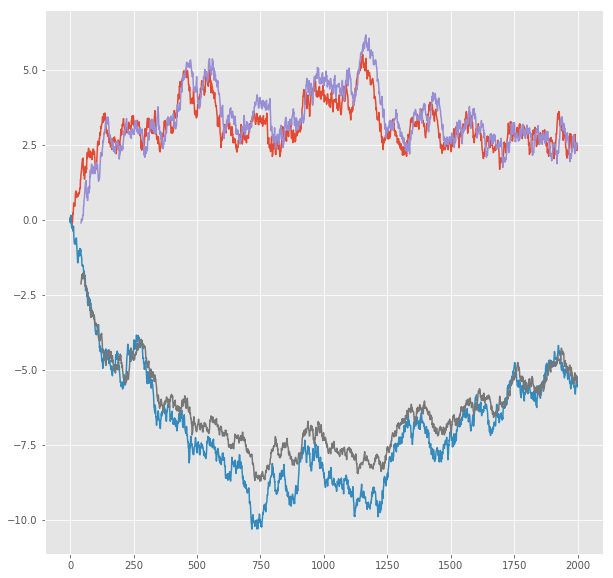

R^2 score for regression on Error: 0.5255
k = 0.9978


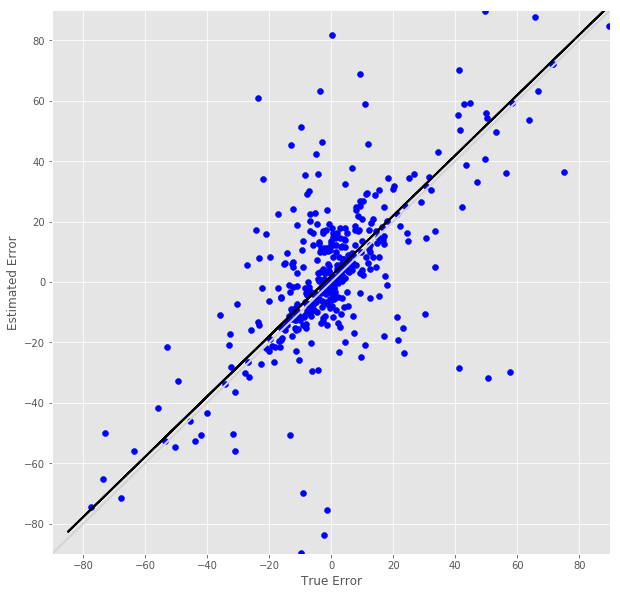

R^2 score for regression on RT: 0.3370
k = 0.6608


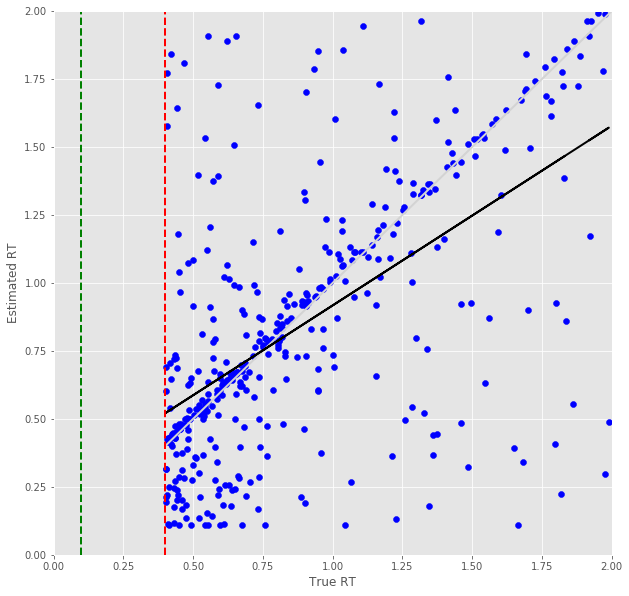

Error Prediction Score: 0.4048 RMSE
RT Prediction Score: 0.4456 RMSE
Error Prediction Corr: 0.6560
RT Prediction Corr: 0.4491
R^2 score for regression on Error: 0.4303
k = 0.9963


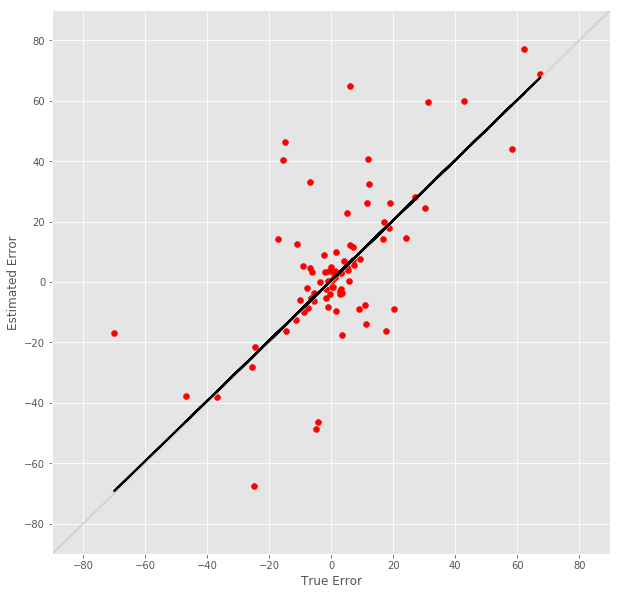

R^2 score for regression on RT: 0.2017
k = 0.4850


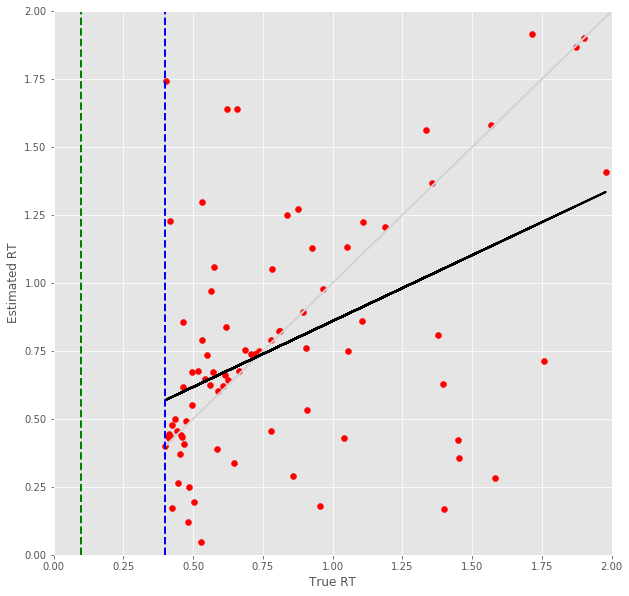

13 -step(s) forecast:
Test Score for 13 -steps forecast: 1.5654 RMSE
Predict Score for 13 -steps forecast: 1.4916 RMSE
Error Test Score for 13 -steps forecast: 0.4101 RMSE
RT Test Score for 13 -steps forecast: 0.4446 RMSE
Error Test Corr for 13 -steps forecast: 0.7016
RT Test Corr for 13 -steps forecast: 0.5415


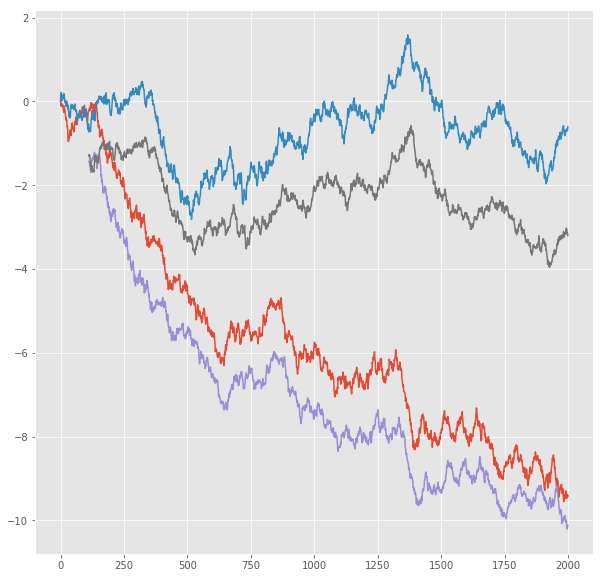

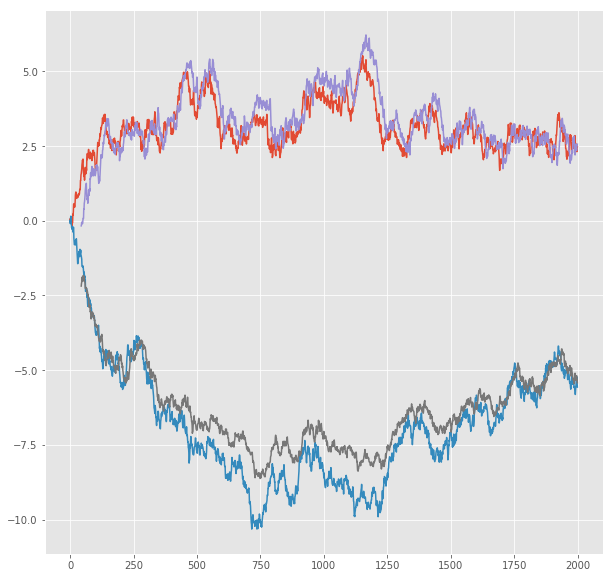

R^2 score for regression on Error: 0.4922
k = 0.9855


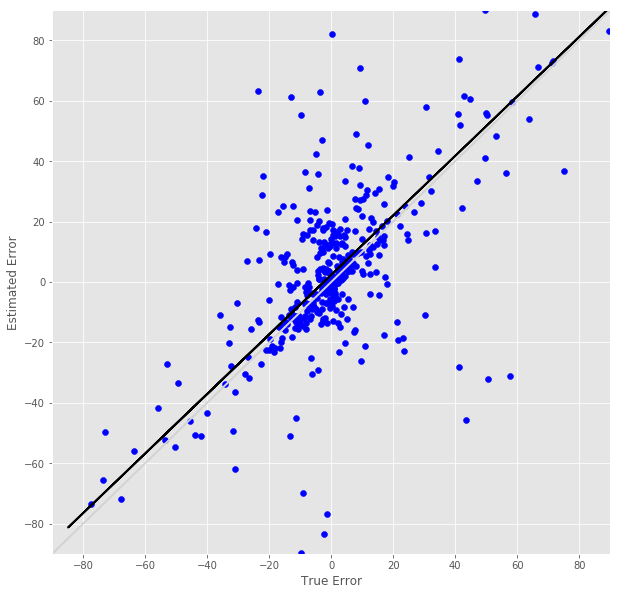

R^2 score for regression on RT: 0.2932
k = 0.6210


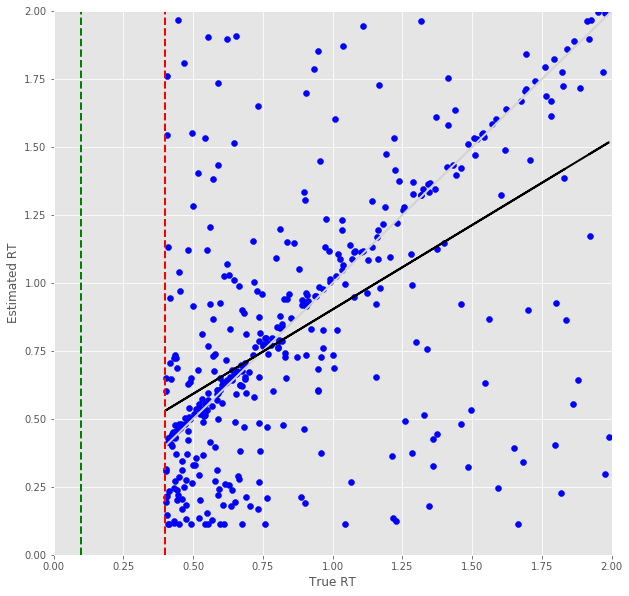

Error Prediction Score: 0.4046 RMSE
RT Prediction Score: 0.4525 RMSE
Error Prediction Corr: 0.6506
RT Prediction Corr: 0.4413
R^2 score for regression on Error: 0.4232
k = 0.9815


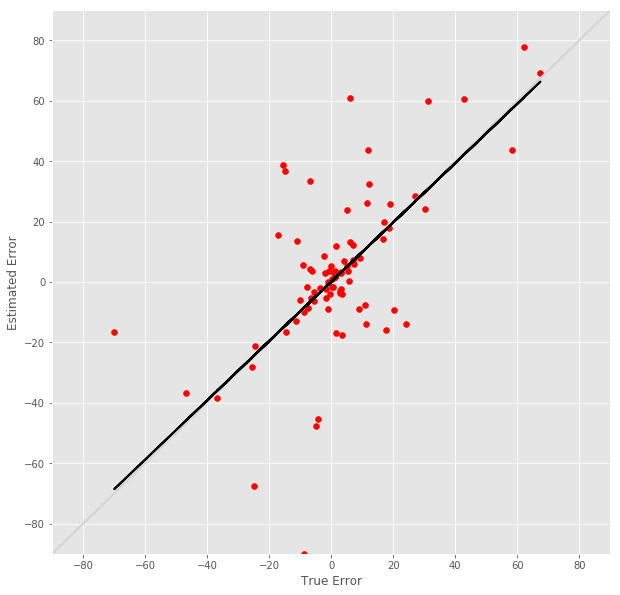

R^2 score for regression on RT: 0.1948
k = 0.4827


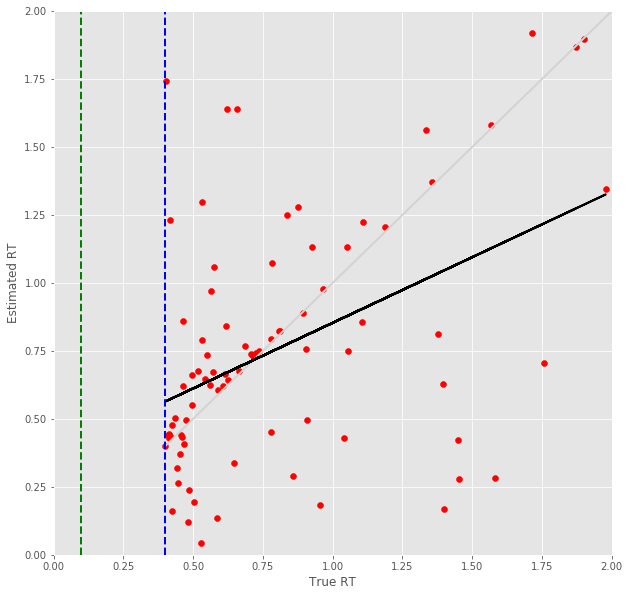

14 -step(s) forecast:
Test Score for 14 -steps forecast: 1.6636 RMSE
Predict Score for 14 -steps forecast: 1.5821 RMSE
Error Test Score for 14 -steps forecast: 0.4209 RMSE
RT Test Score for 14 -steps forecast: 0.4561 RMSE
Error Test Corr for 14 -steps forecast: 0.7040
RT Test Corr for 14 -steps forecast: 0.5212


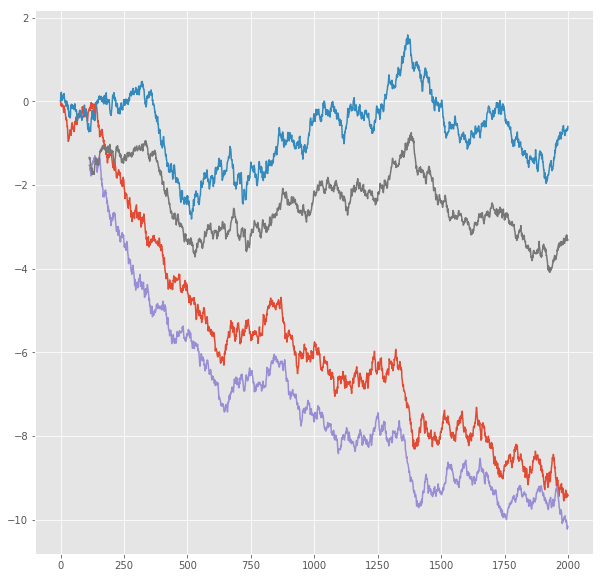

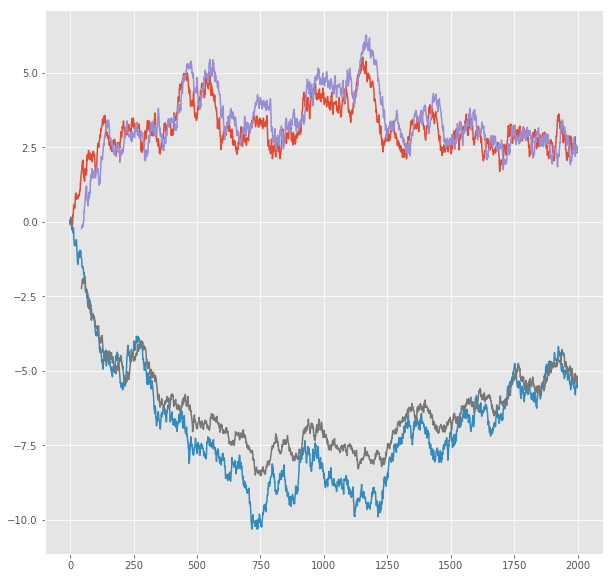

R^2 score for regression on Error: 0.4956
k = 1.0135


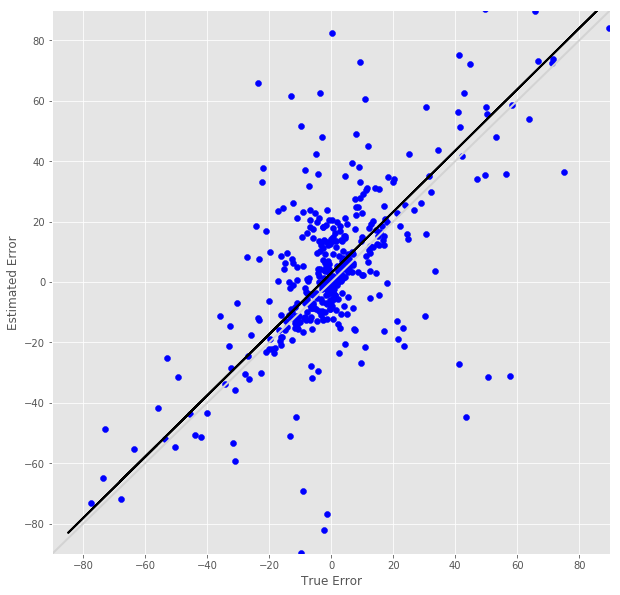

R^2 score for regression on RT: 0.2716
k = 0.6057


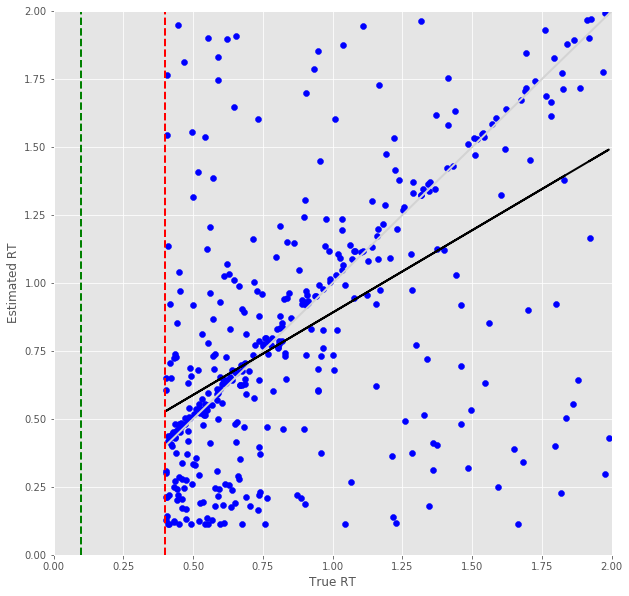

Error Prediction Score: 0.4435 RMSE
RT Prediction Score: 0.4921 RMSE
Error Prediction Corr: 0.5138
RT Prediction Corr: 0.3491
R^2 score for regression on Error: 0.2640
k = 0.7371


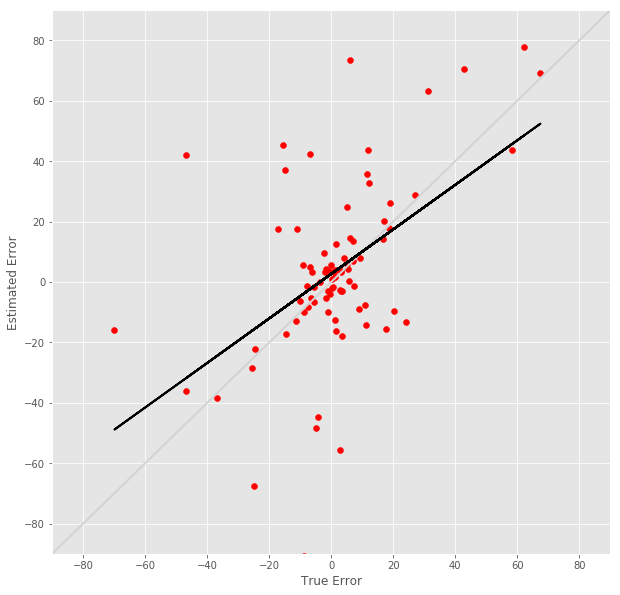

R^2 score for regression on RT: 0.1219
k = 0.3834


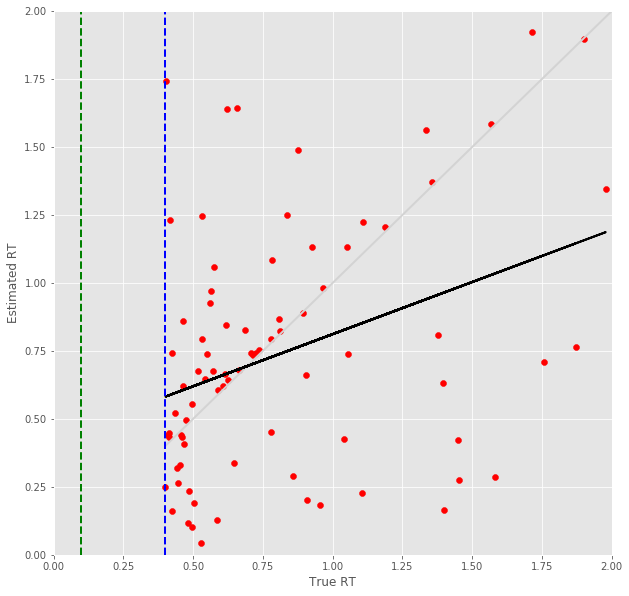

15 -step(s) forecast:
Test Score for 15 -steps forecast: 1.7606 RMSE
Predict Score for 15 -steps forecast: 1.6712 RMSE
Error Test Score for 15 -steps forecast: 0.4301 RMSE
RT Test Score for 15 -steps forecast: 0.4738 RMSE
Error Test Corr for 15 -steps forecast: 0.7026
RT Test Corr for 15 -steps forecast: 0.4971


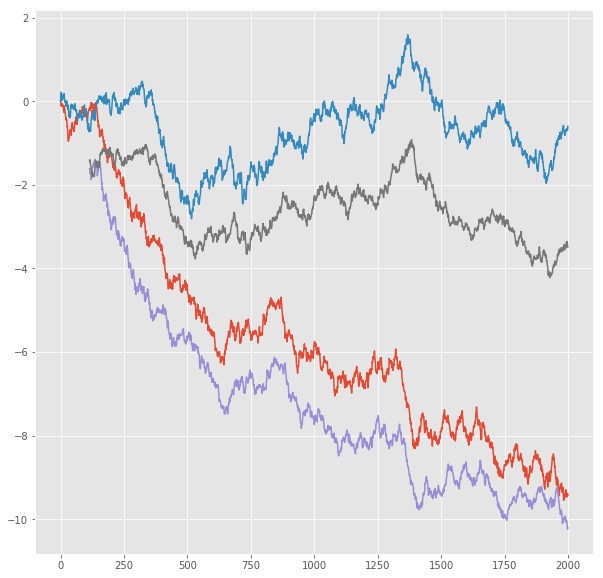

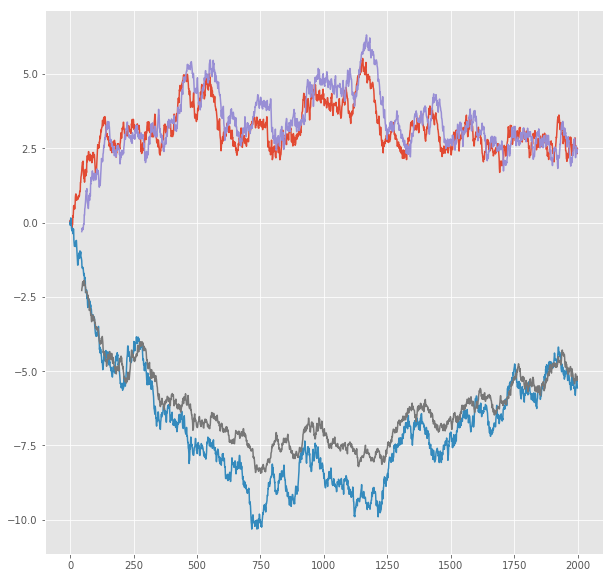

R^2 score for regression on Error: 0.4937
k = 1.0262


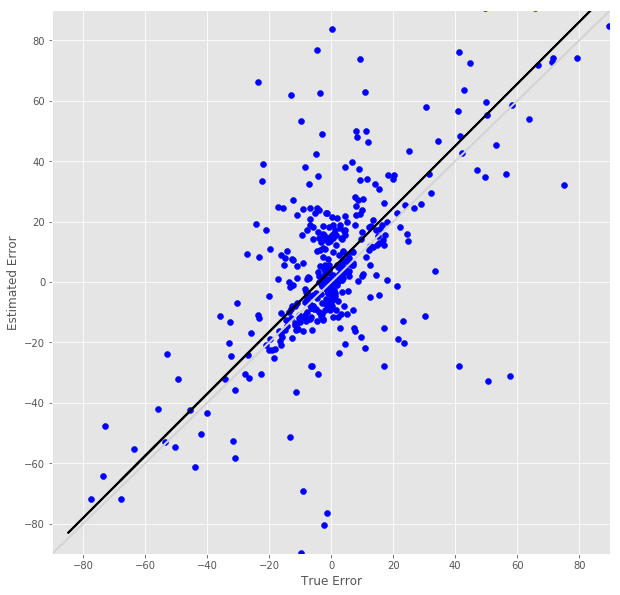

R^2 score for regression on RT: 0.2471
k = 0.5872


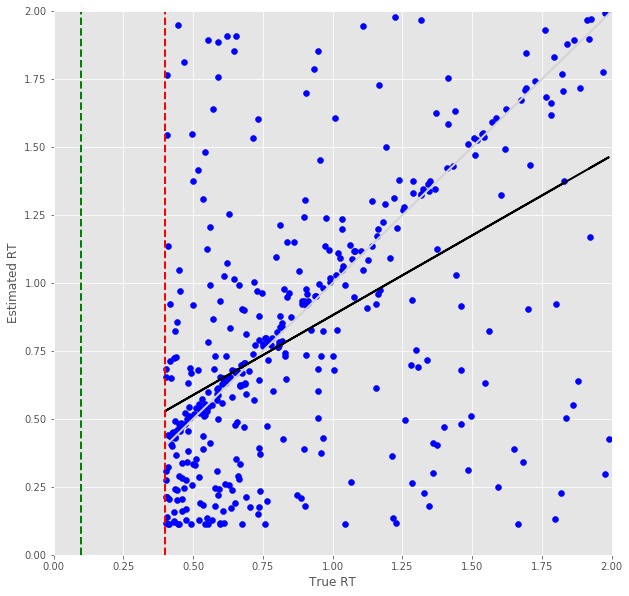

Error Prediction Score: 0.4522 RMSE
RT Prediction Score: 0.5010 RMSE
Error Prediction Corr: 0.5301
RT Prediction Corr: 0.3300
R^2 score for regression on Error: 0.2811
k = 0.7865


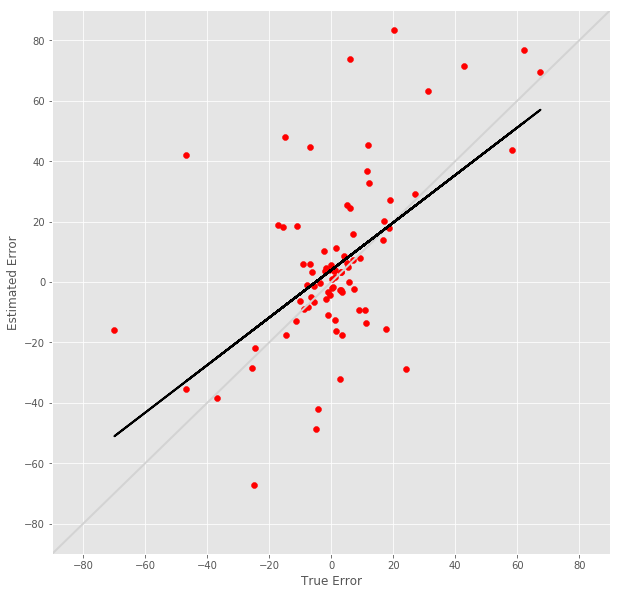

R^2 score for regression on RT: 0.1089
k = 0.3612


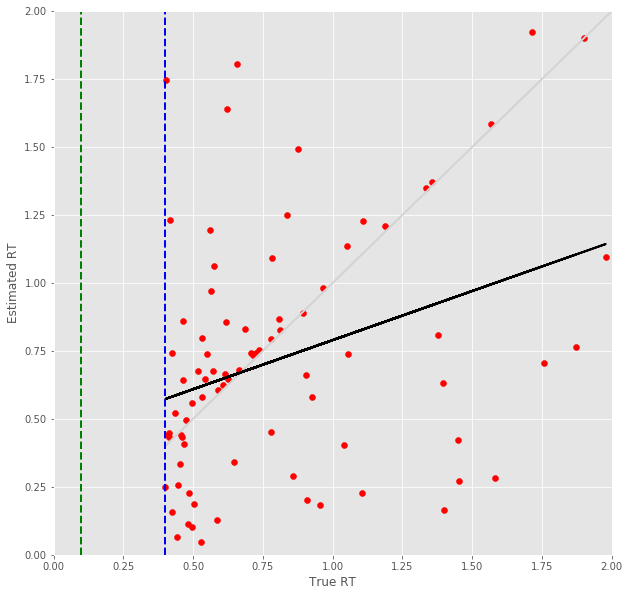

16 -step(s) forecast:
Test Score for 16 -steps forecast: 1.8565 RMSE
Predict Score for 16 -steps forecast: 1.7593 RMSE
Error Test Score for 16 -steps forecast: 0.4504 RMSE
RT Test Score for 16 -steps forecast: 0.4897 RMSE
Error Test Corr for 16 -steps forecast: 0.6958
RT Test Corr for 16 -steps forecast: 0.4598


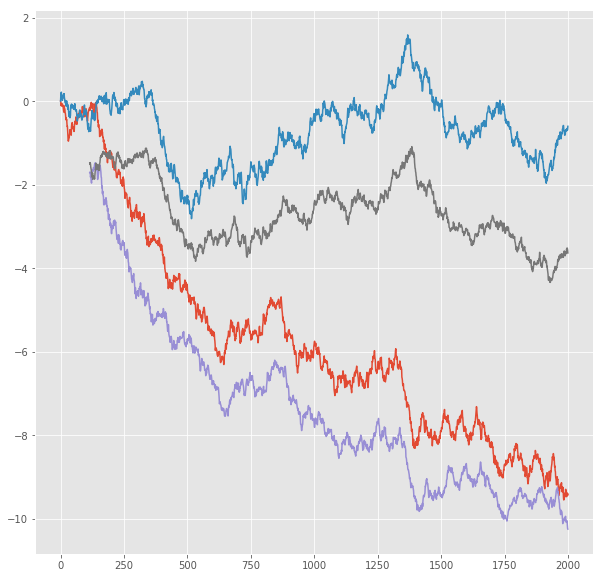

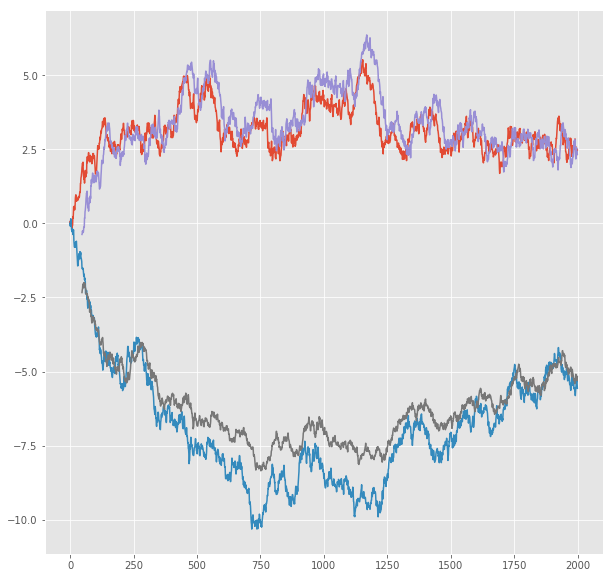

R^2 score for regression on Error: 0.4841
k = 1.0584


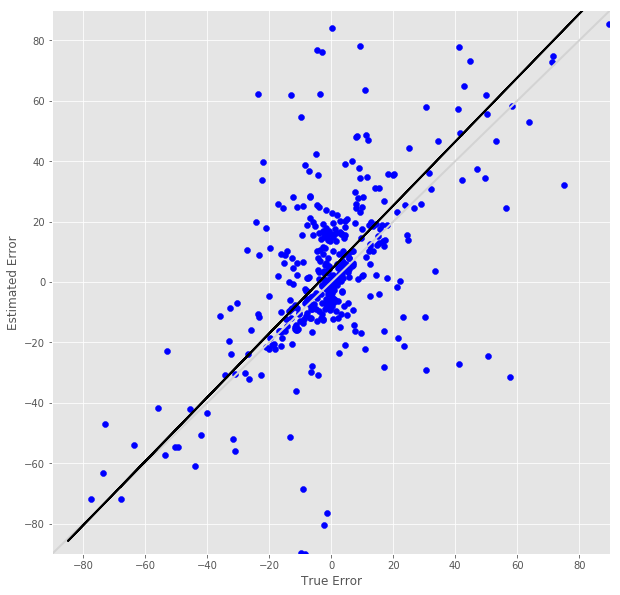

R^2 score for regression on RT: 0.2114
k = 0.5421


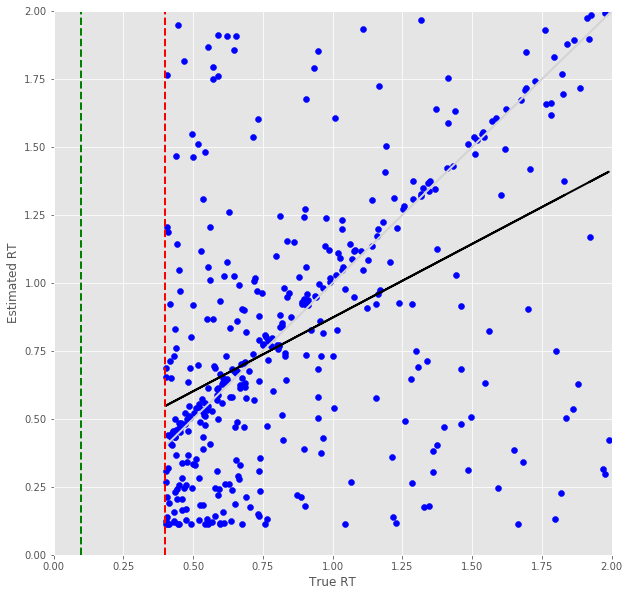

Error Prediction Score: 0.4741 RMSE
RT Prediction Score: 0.5371 RMSE
Error Prediction Corr: 0.6012
RT Prediction Corr: 0.2689
R^2 score for regression on Error: 0.3614
k = 0.9302


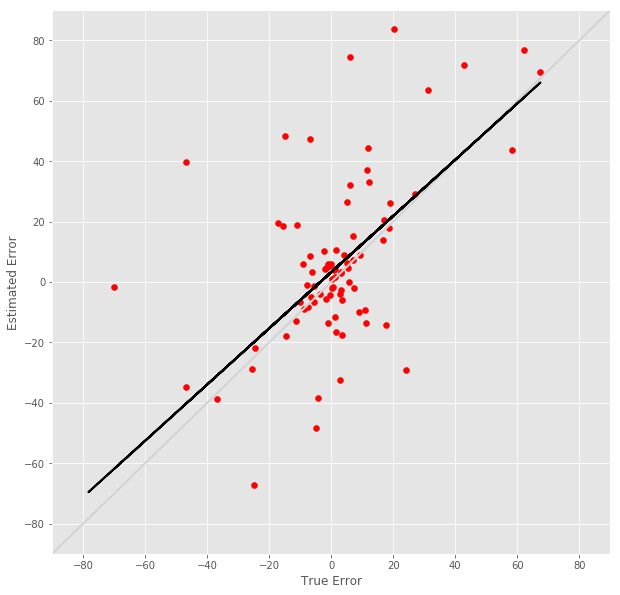

R^2 score for regression on RT: 0.0723
k = 0.2867


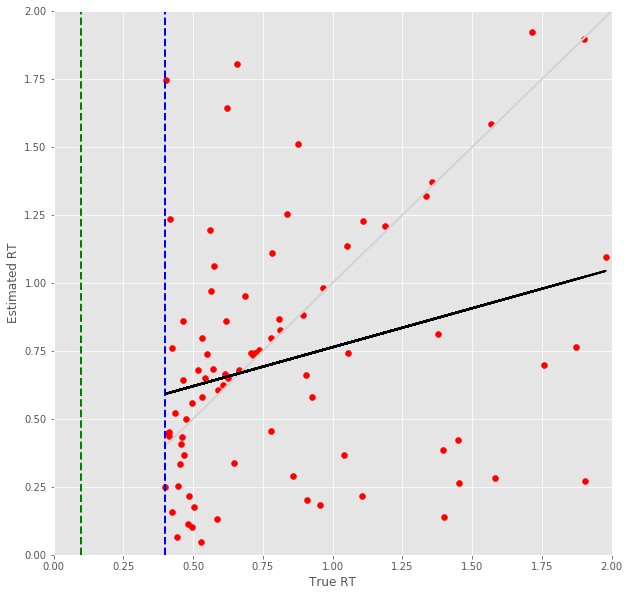

17 -step(s) forecast:
Test Score for 17 -steps forecast: 1.9514 RMSE
Predict Score for 17 -steps forecast: 1.8462 RMSE
Error Test Score for 17 -steps forecast: 0.4559 RMSE
RT Test Score for 17 -steps forecast: 0.5049 RMSE
Error Test Corr for 17 -steps forecast: 0.6906
RT Test Corr for 17 -steps forecast: 0.4282


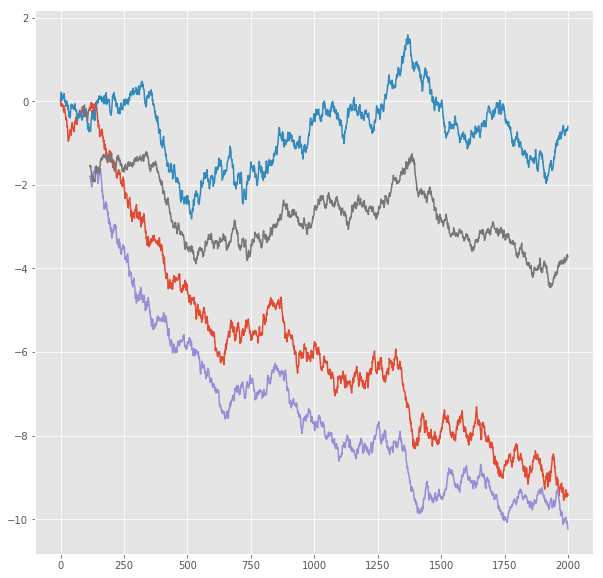

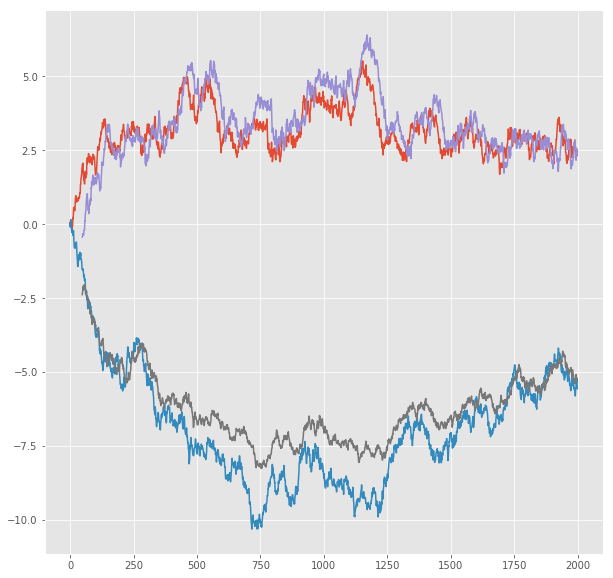

R^2 score for regression on Error: 0.4769
k = 1.0523


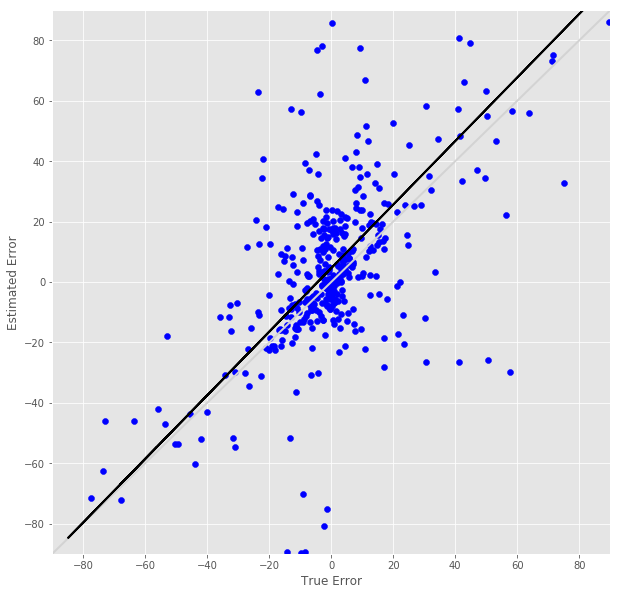

R^2 score for regression on RT: 0.1834
k = 0.5087


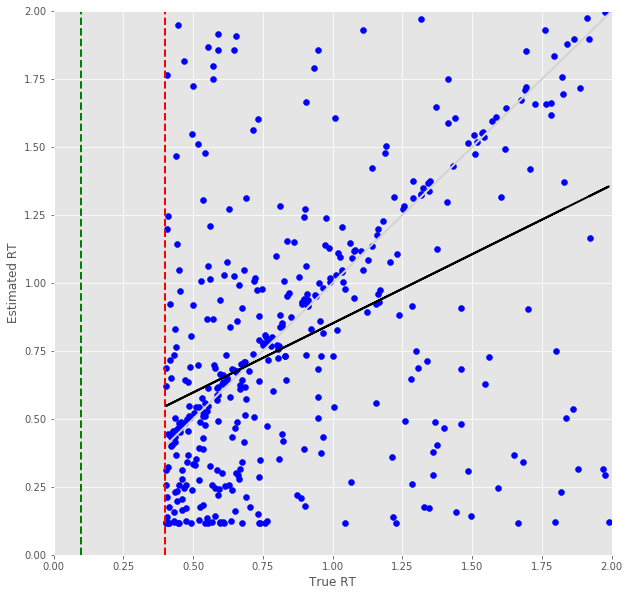

Error Prediction Score: 0.5342 RMSE
RT Prediction Score: 0.5781 RMSE
Error Prediction Corr: 0.5494
RT Prediction Corr: 0.1923
R^2 score for regression on Error: 0.3018
k = 0.9142


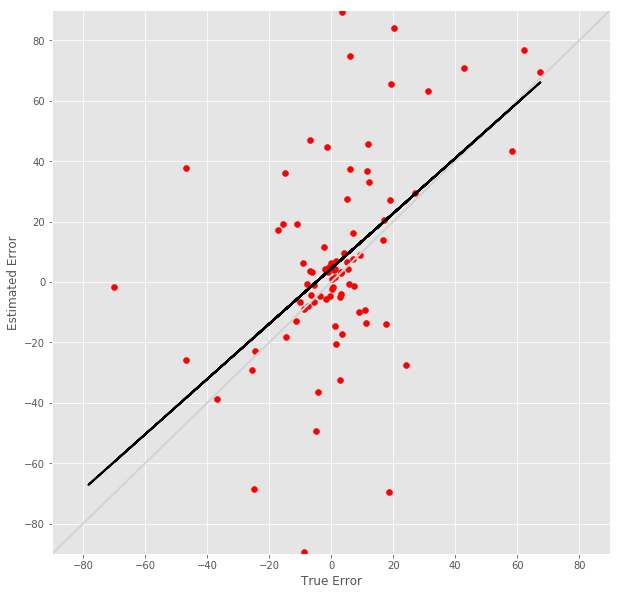

R^2 score for regression on RT: 0.0370
k = 0.1993


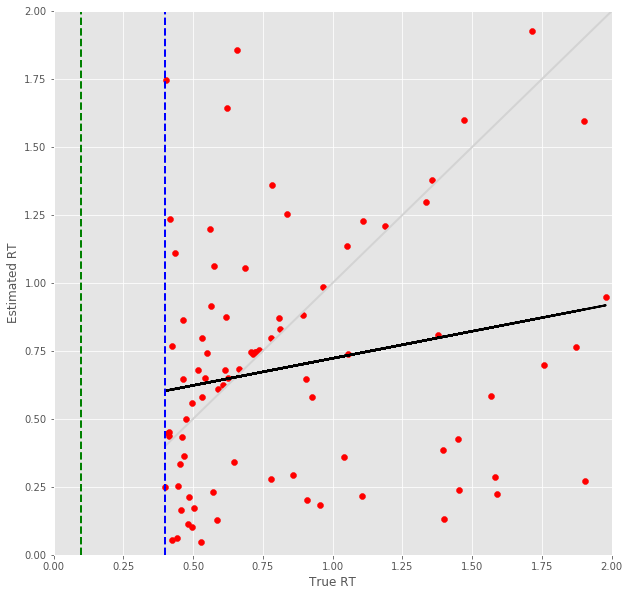

18 -step(s) forecast:
Test Score for 18 -steps forecast: 2.0454 RMSE
Predict Score for 18 -steps forecast: 1.9321 RMSE
Error Test Score for 18 -steps forecast: 0.4859 RMSE
RT Test Score for 18 -steps forecast: 0.5154 RMSE
Error Test Corr for 18 -steps forecast: 0.6640
RT Test Corr for 18 -steps forecast: 0.4021


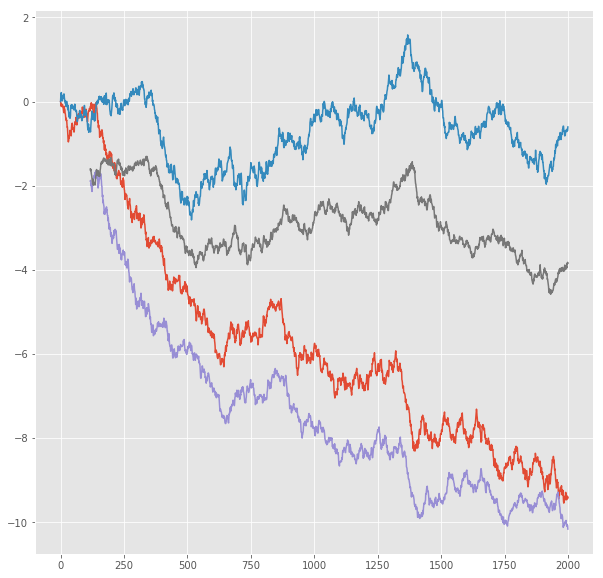

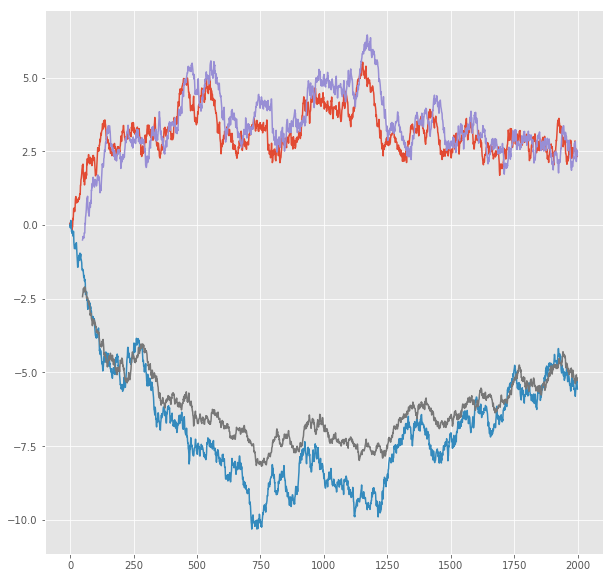

R^2 score for regression on Error: 0.4409
k = 1.0440


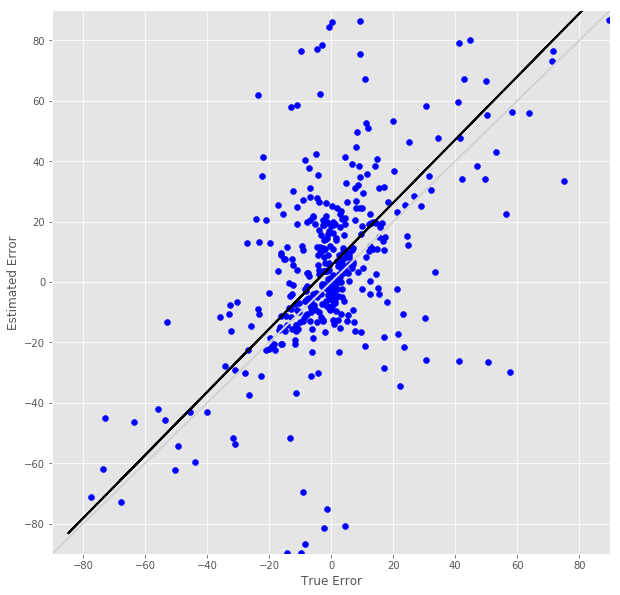

R^2 score for regression on RT: 0.1617
k = 0.4746


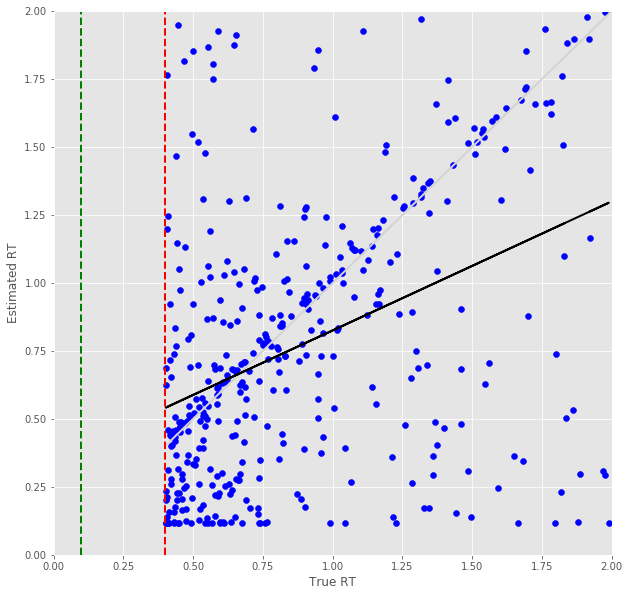

Error Prediction Score: 0.5402 RMSE
RT Prediction Score: 0.5927 RMSE
Error Prediction Corr: 0.5471
RT Prediction Corr: 0.1576
R^2 score for regression on Error: 0.2993
k = 0.9165


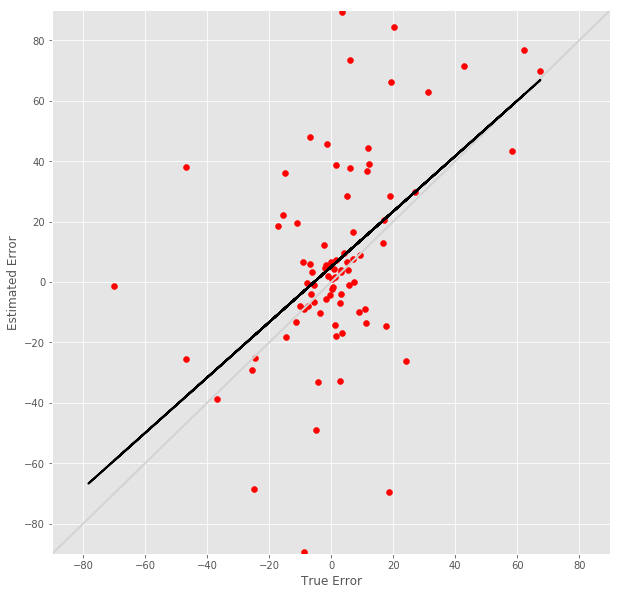

R^2 score for regression on RT: 0.0248
k = 0.1669


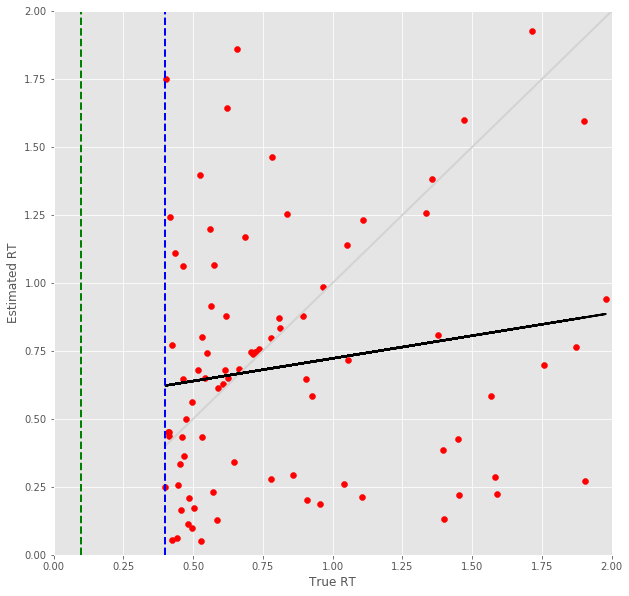

19 -step(s) forecast:
Test Score for 19 -steps forecast: 2.1384 RMSE
Predict Score for 19 -steps forecast: 2.0171 RMSE
Error Test Score for 19 -steps forecast: 0.4918 RMSE
RT Test Score for 19 -steps forecast: 0.5185 RMSE
Error Test Corr for 19 -steps forecast: 0.6393
RT Test Corr for 19 -steps forecast: 0.3808


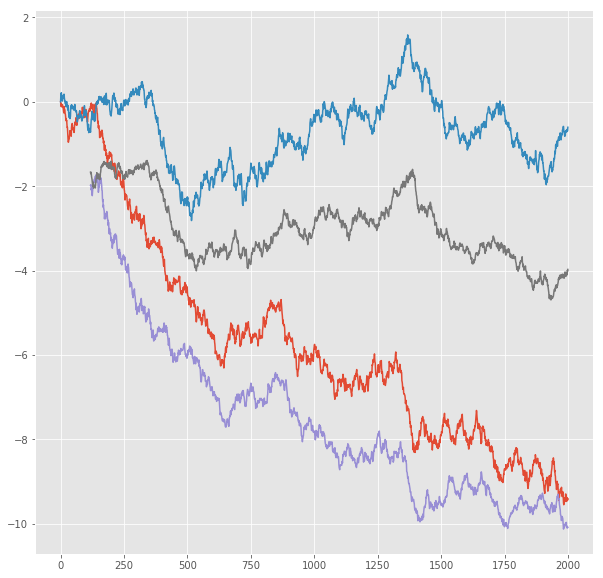

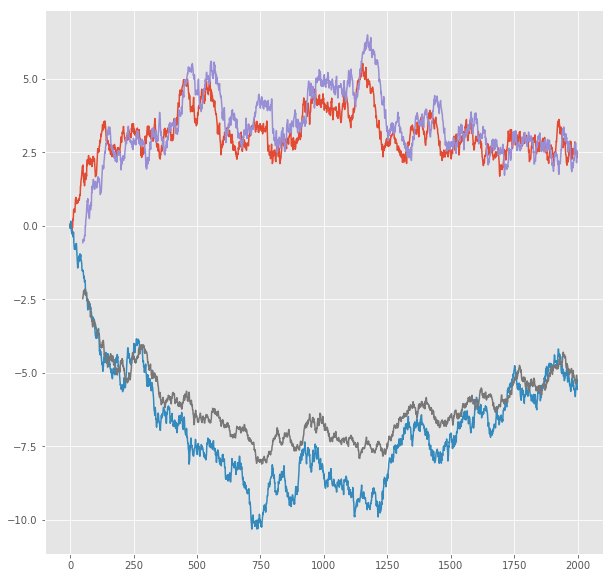

R^2 score for regression on Error: 0.4087
k = 0.9879


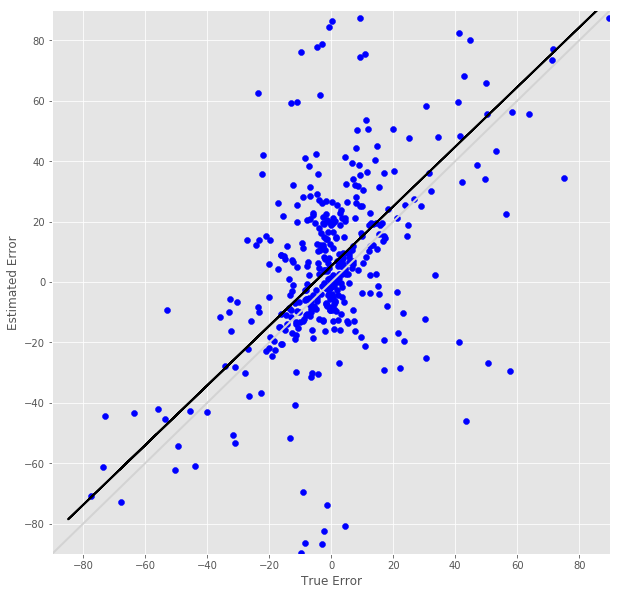

R^2 score for regression on RT: 0.1450
k = 0.4388


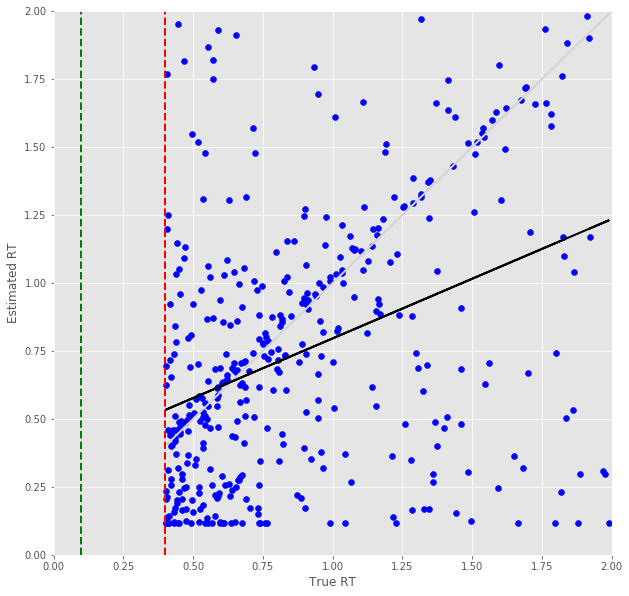

Error Prediction Score: 0.5605 RMSE
RT Prediction Score: 0.5940 RMSE
Error Prediction Corr: 0.5413
RT Prediction Corr: 0.1600
R^2 score for regression on Error: 0.2930
k = 0.9390


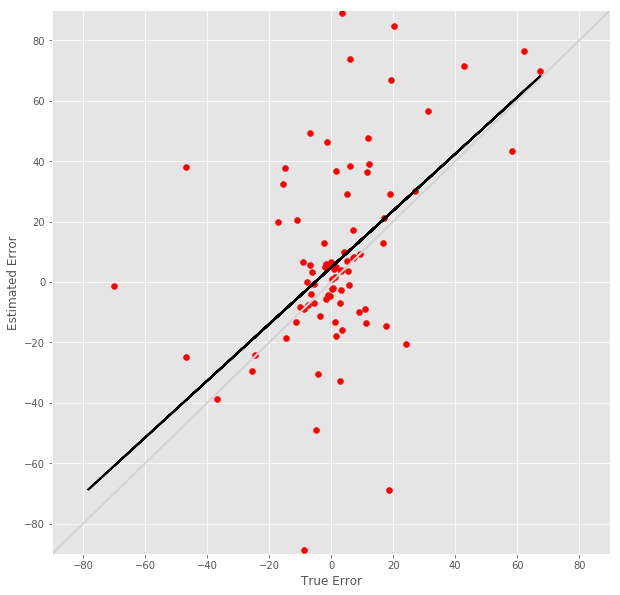

R^2 score for regression on RT: 0.0256
k = 0.1704


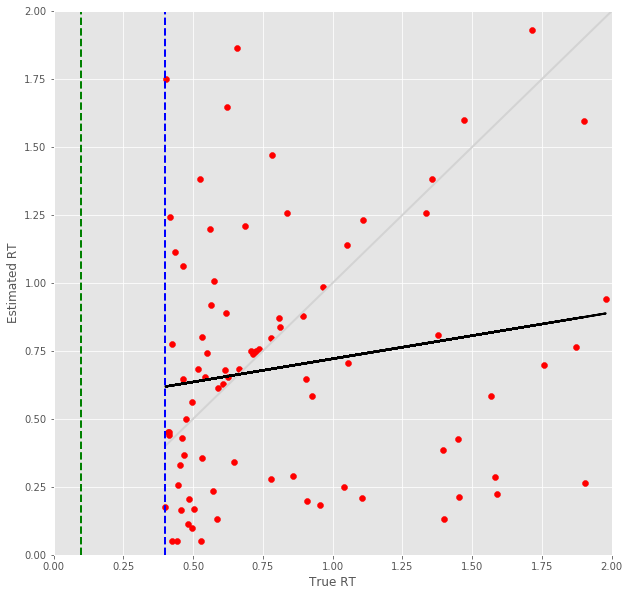

20 -step(s) forecast:
Test Score for 20 -steps forecast: 2.2307 RMSE
Predict Score for 20 -steps forecast: 2.1012 RMSE
Error Test Score for 20 -steps forecast: 0.5136 RMSE
RT Test Score for 20 -steps forecast: 0.5275 RMSE
Error Test Corr for 20 -steps forecast: 0.6437
RT Test Corr for 20 -steps forecast: 0.3687


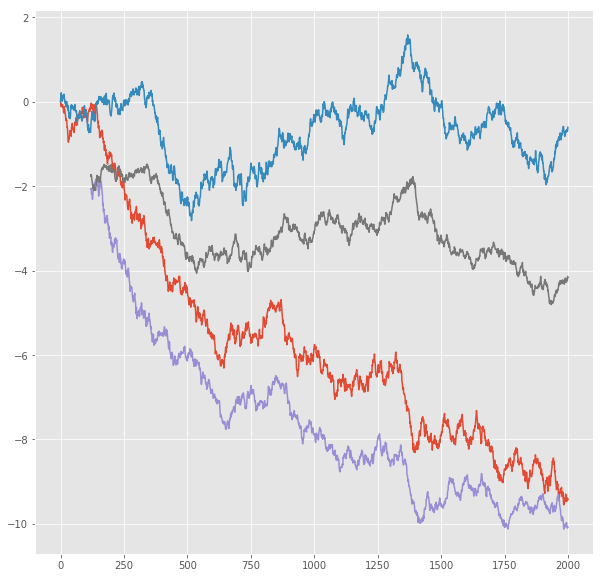

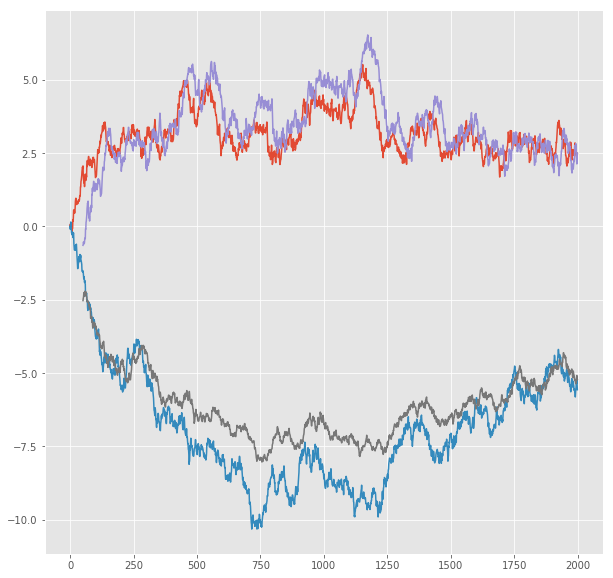

R^2 score for regression on Error: 0.4143
k = 1.0494


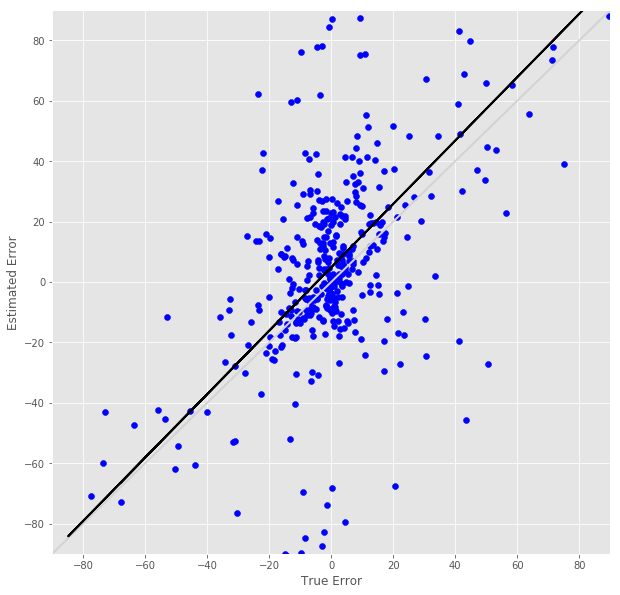

R^2 score for regression on RT: 0.1360
k = 0.4292


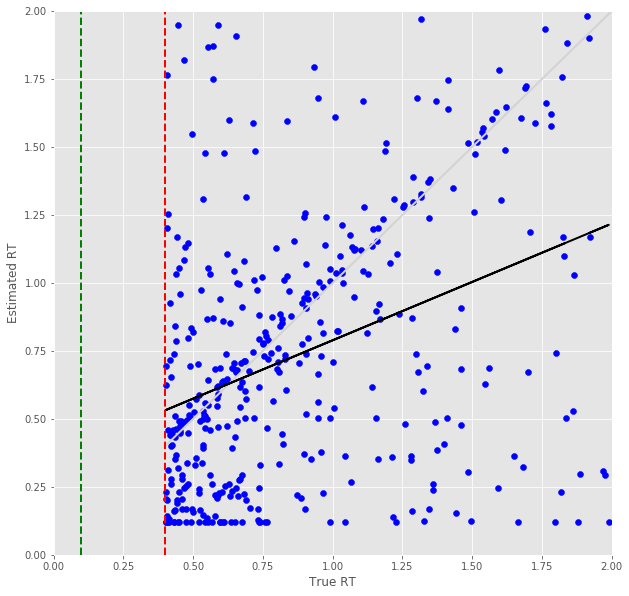

Error Prediction Score: 0.5898 RMSE
RT Prediction Score: 0.6133 RMSE
Error Prediction Corr: 0.5029
RT Prediction Corr: 0.1440
R^2 score for regression on Error: 0.2529
k = 0.9047


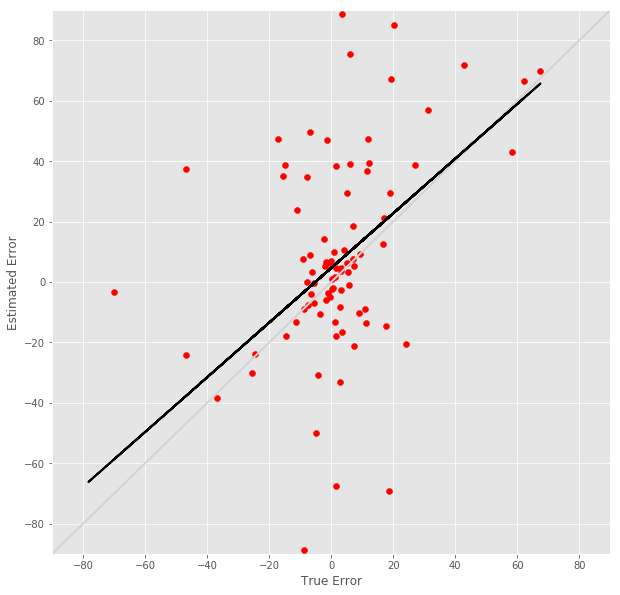

R^2 score for regression on RT: 0.0207
k = 0.1583


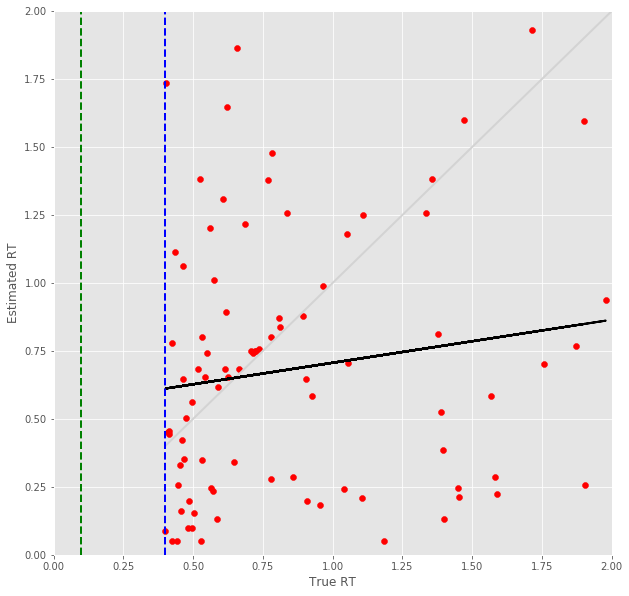

21 -step(s) forecast:
Test Score for 21 -steps forecast: 2.3221 RMSE
Predict Score for 21 -steps forecast: 2.1846 RMSE
Error Test Score for 21 -steps forecast: 0.5179 RMSE
RT Test Score for 21 -steps forecast: 0.5357 RMSE
Error Test Corr for 21 -steps forecast: 0.6423
RT Test Corr for 21 -steps forecast: 0.3554


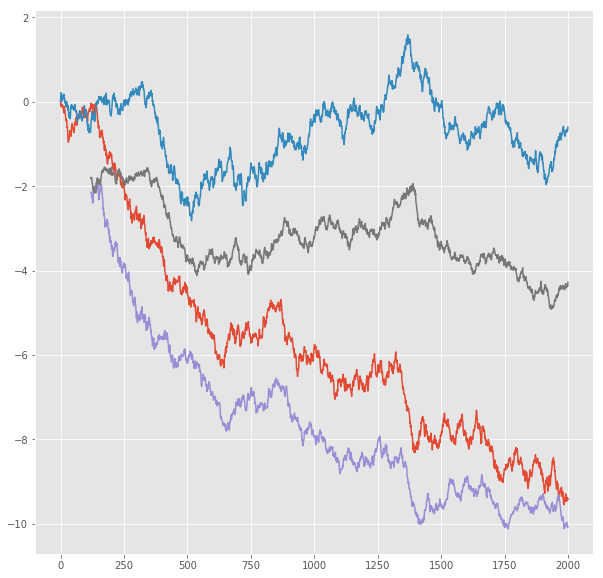

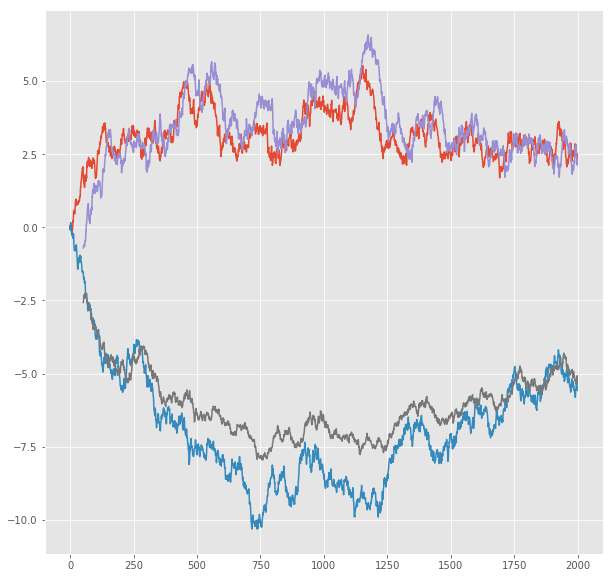

R^2 score for regression on Error: 0.4125
k = 1.0532


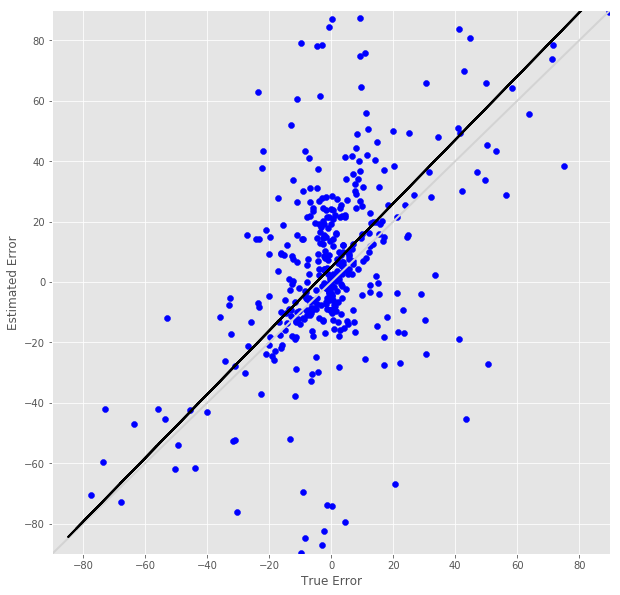

R^2 score for regression on RT: 0.1263
k = 0.4123


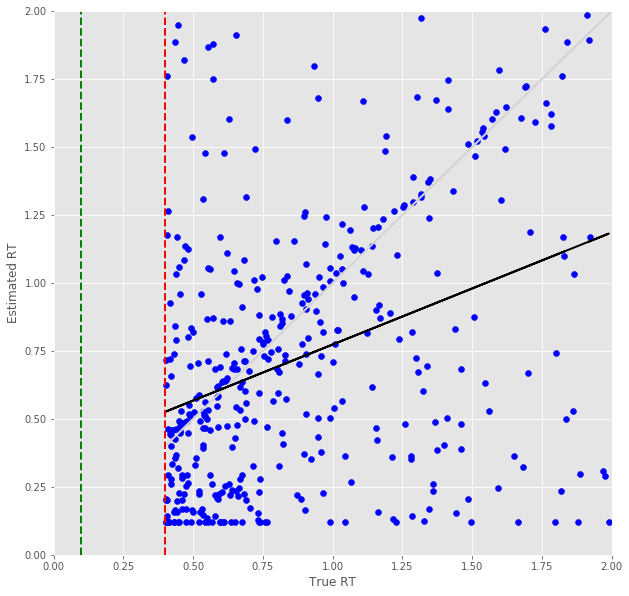

Error Prediction Score: 0.5865 RMSE
RT Prediction Score: 0.6286 RMSE
Error Prediction Corr: 0.5018
RT Prediction Corr: 0.1235
R^2 score for regression on Error: 0.2518
k = 0.8886


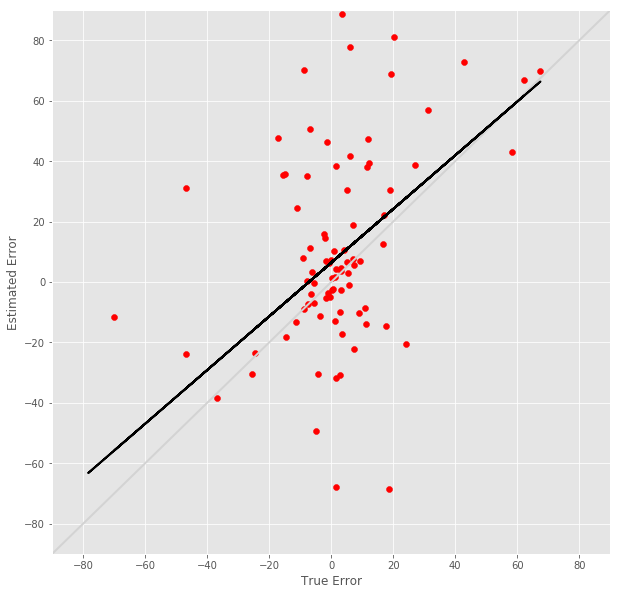

R^2 score for regression on RT: 0.0153
k = 0.1381


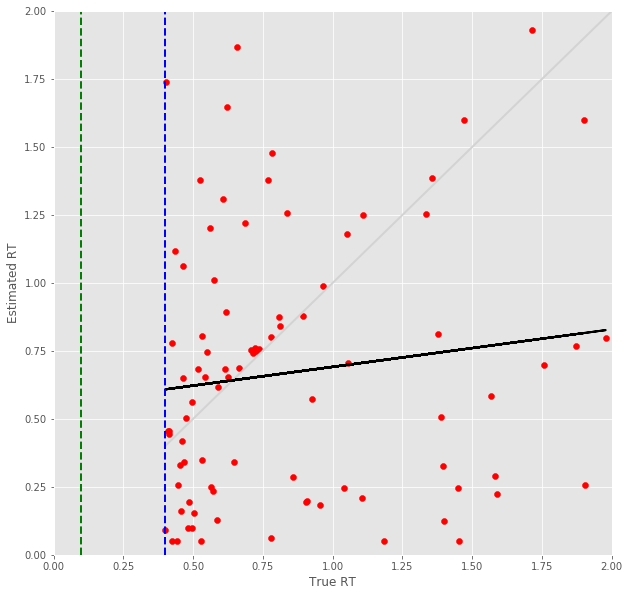

22 -step(s) forecast:
Test Score for 22 -steps forecast: 2.4128 RMSE
Predict Score for 22 -steps forecast: 2.2672 RMSE
Error Test Score for 22 -steps forecast: 0.5296 RMSE
RT Test Score for 22 -steps forecast: 0.5465 RMSE
Error Test Corr for 22 -steps forecast: 0.6460
RT Test Corr for 22 -steps forecast: 0.3438


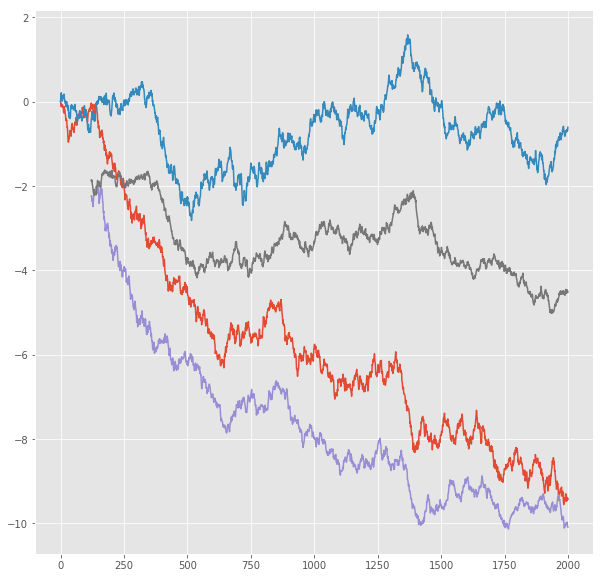

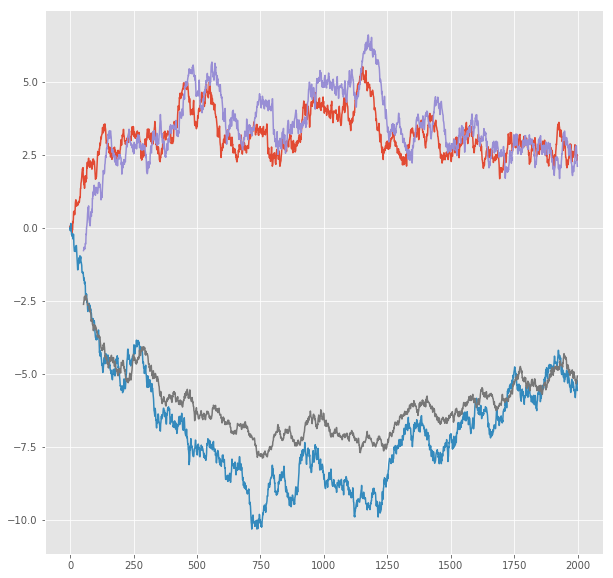

R^2 score for regression on Error: 0.4173
k = 1.0711


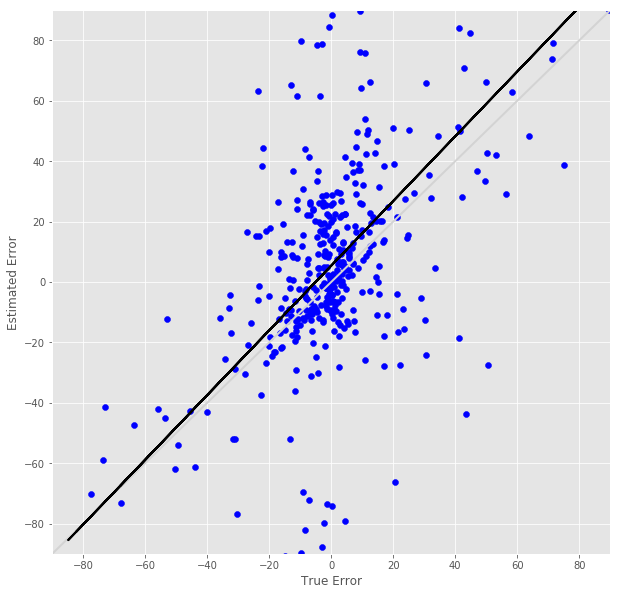

R^2 score for regression on RT: 0.1182
k = 0.3982


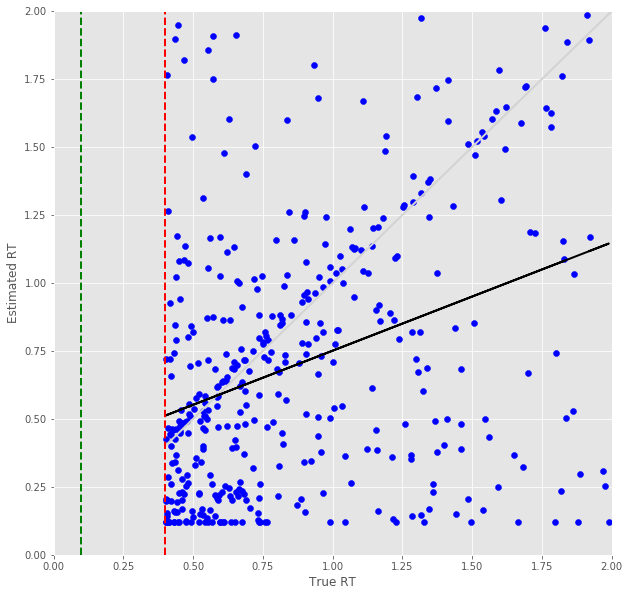

Error Prediction Score: 0.5814 RMSE
RT Prediction Score: 0.6371 RMSE
Error Prediction Corr: 0.4697
RT Prediction Corr: 0.1219
R^2 score for regression on Error: 0.2206
k = 0.7890


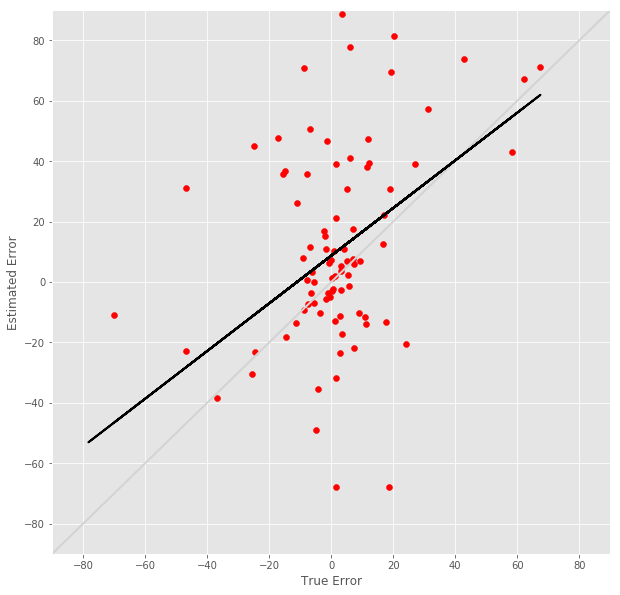

R^2 score for regression on RT: 0.0149
k = 0.1390


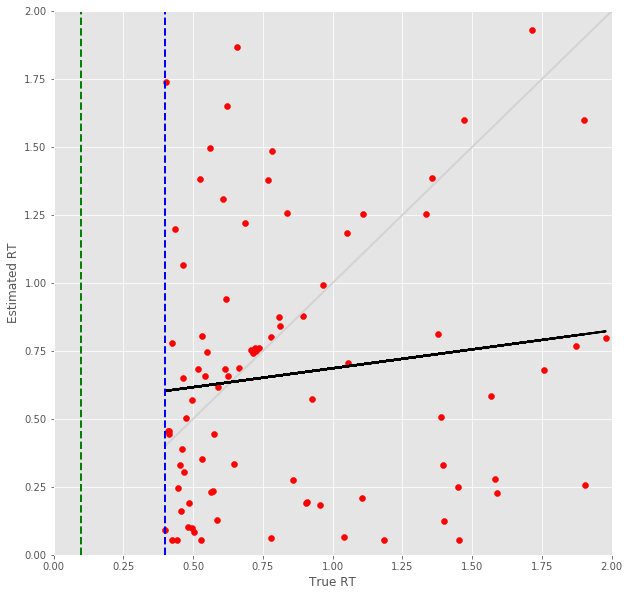

23 -step(s) forecast:
Test Score for 23 -steps forecast: 2.5027 RMSE
Predict Score for 23 -steps forecast: 2.3490 RMSE
Error Test Score for 23 -steps forecast: 0.5361 RMSE
RT Test Score for 23 -steps forecast: 0.5588 RMSE
Error Test Corr for 23 -steps forecast: 0.6255
RT Test Corr for 23 -steps forecast: 0.3202


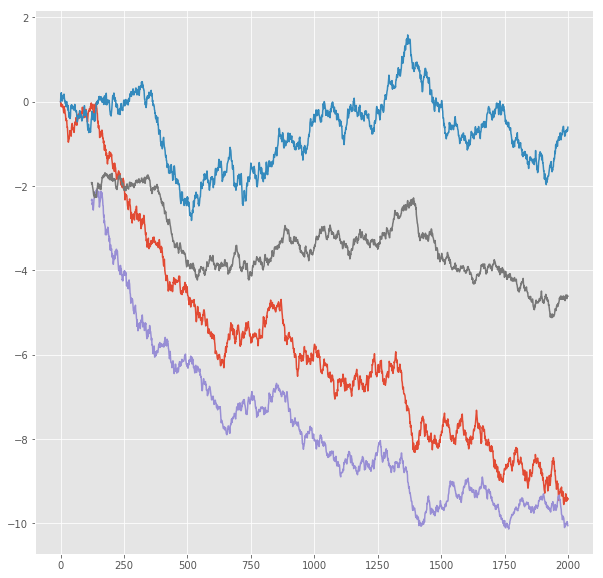

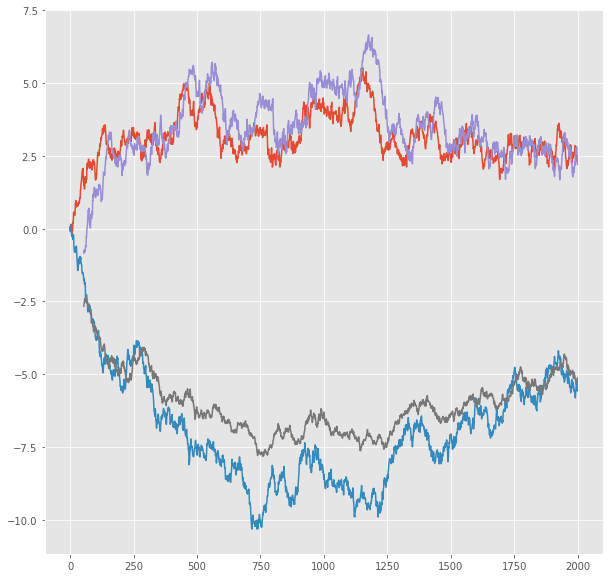

R^2 score for regression on Error: 0.3912
k = 1.0305


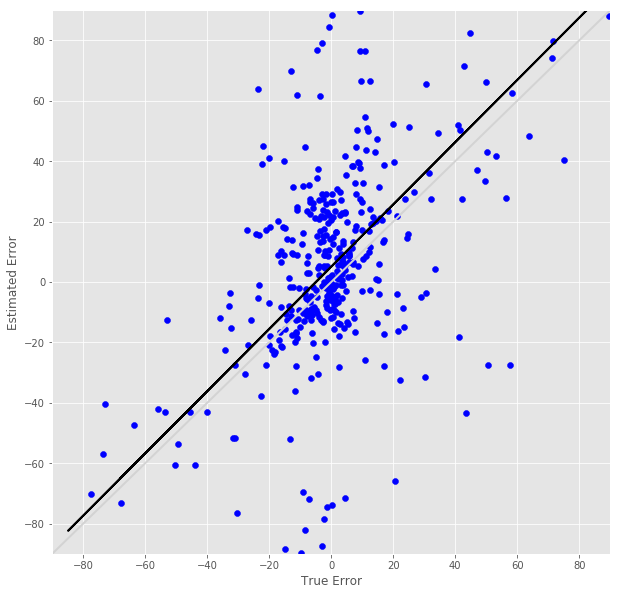

R^2 score for regression on RT: 0.1025
k = 0.3705


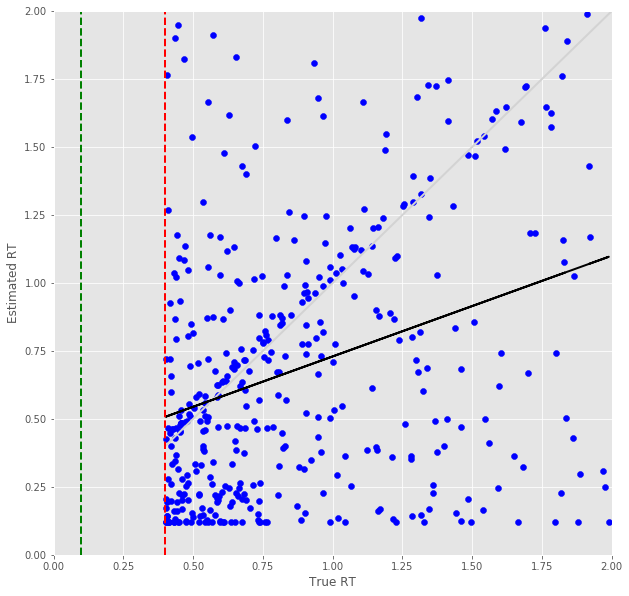

Error Prediction Score: 0.5878 RMSE
RT Prediction Score: 0.6508 RMSE
Error Prediction Corr: 0.4631
RT Prediction Corr: 0.1029
R^2 score for regression on Error: 0.2145
k = 0.7865


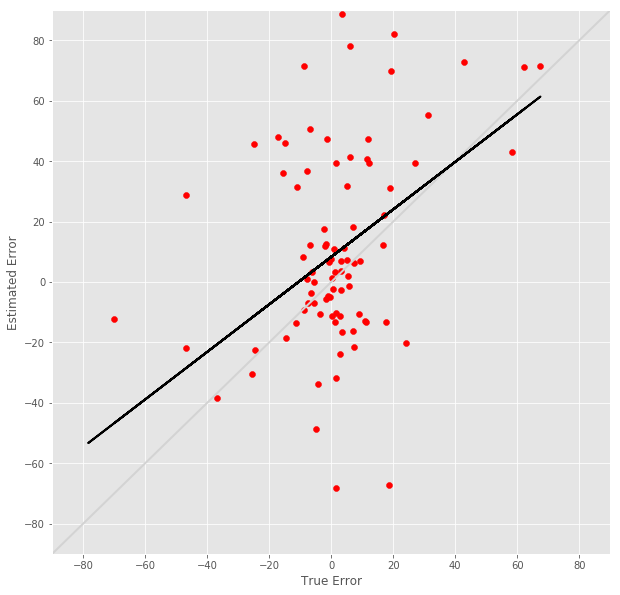

R^2 score for regression on RT: 0.0106
k = 0.1200


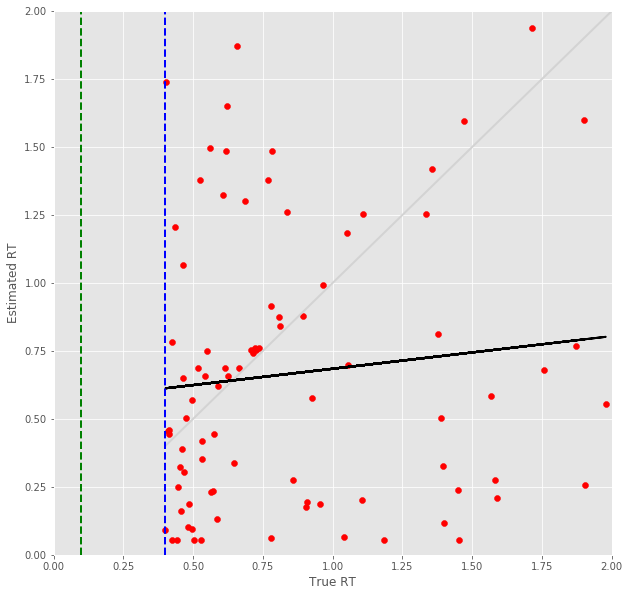

24 -step(s) forecast:
Test Score for 24 -steps forecast: 2.5919 RMSE
Predict Score for 24 -steps forecast: 2.4300 RMSE
Error Test Score for 24 -steps forecast: 0.5451 RMSE
RT Test Score for 24 -steps forecast: 0.5729 RMSE
Error Test Corr for 24 -steps forecast: 0.6218
RT Test Corr for 24 -steps forecast: 0.2890


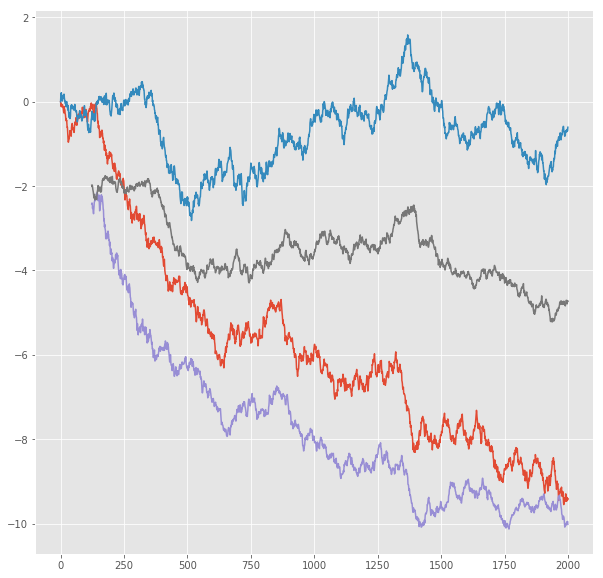

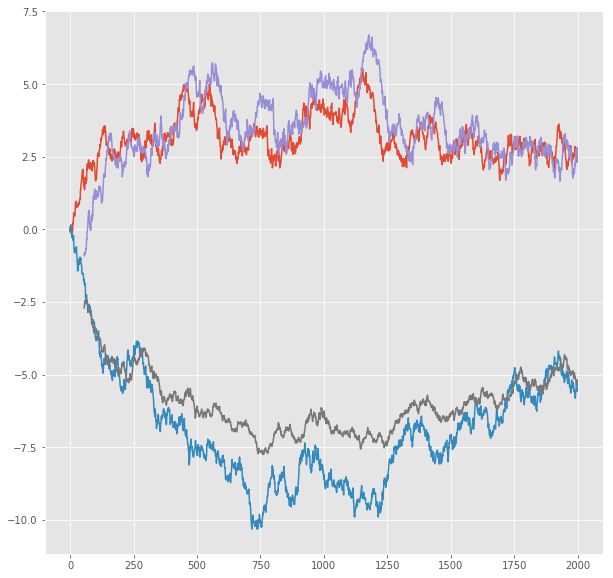

R^2 score for regression on Error: 0.3866
k = 1.0330


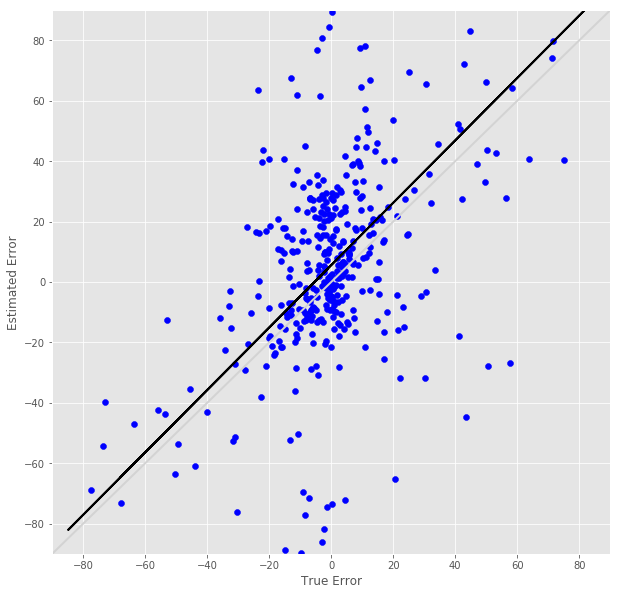

R^2 score for regression on RT: 0.0835
k = 0.3318


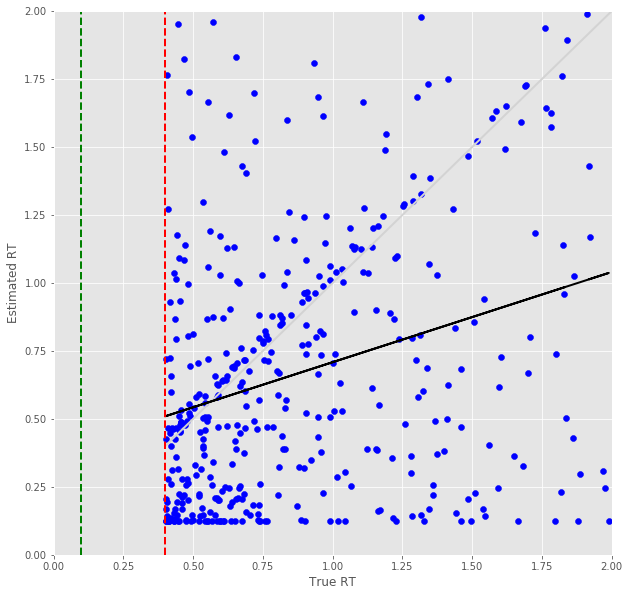

Error Prediction Score: 0.5897 RMSE
RT Prediction Score: 0.6488 RMSE
Error Prediction Corr: 0.4607
RT Prediction Corr: 0.1315
R^2 score for regression on Error: 0.2122
k = 0.7833


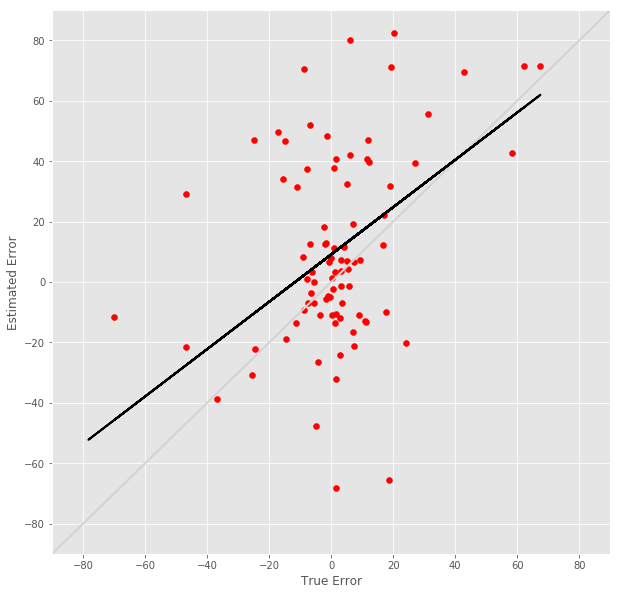

R^2 score for regression on RT: 0.0173
k = 0.1567


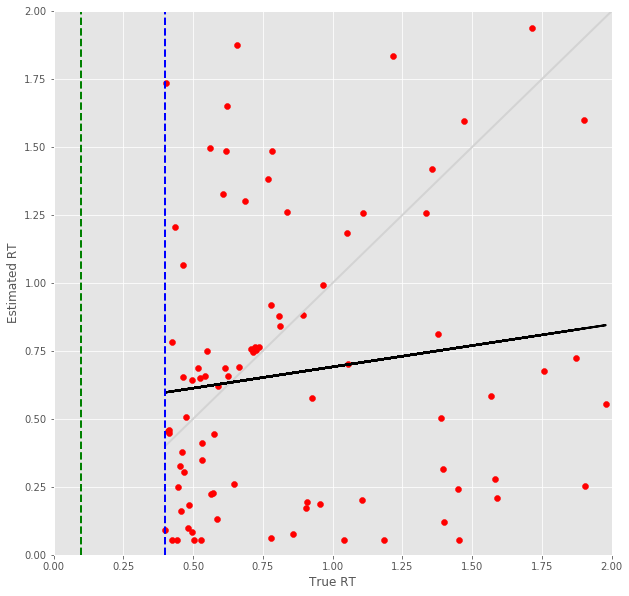

25 -step(s) forecast:
Test Score for 25 -steps forecast: 2.6804 RMSE
Predict Score for 25 -steps forecast: 2.5104 RMSE
Error Test Score for 25 -steps forecast: 0.5520 RMSE
RT Test Score for 25 -steps forecast: 0.5814 RMSE
Error Test Corr for 25 -steps forecast: 0.6110
RT Test Corr for 25 -steps forecast: 0.2814


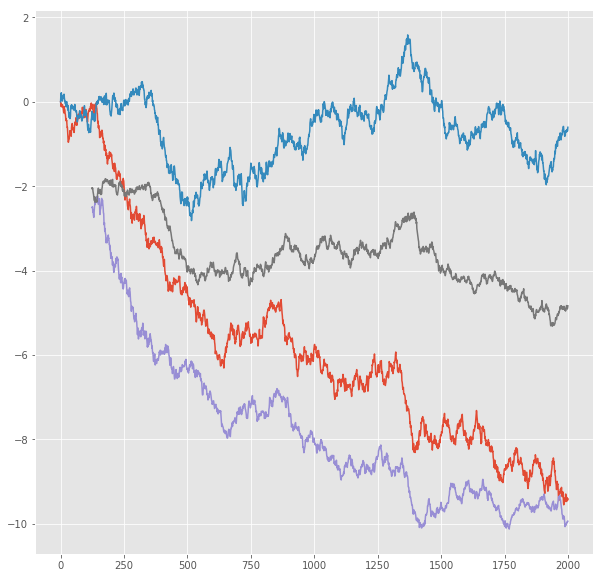

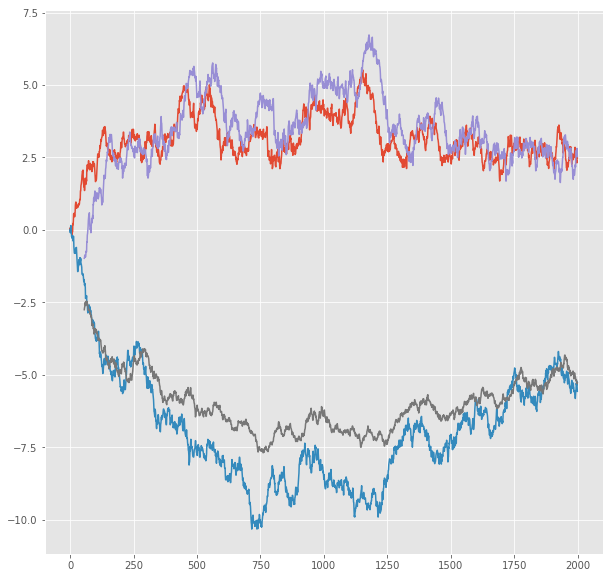

R^2 score for regression on Error: 0.3734
k = 1.0164


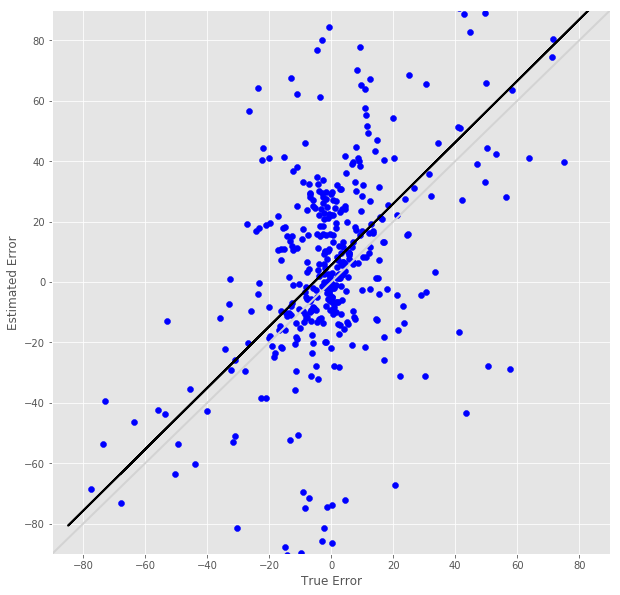

R^2 score for regression on RT: 0.0792
k = 0.3254


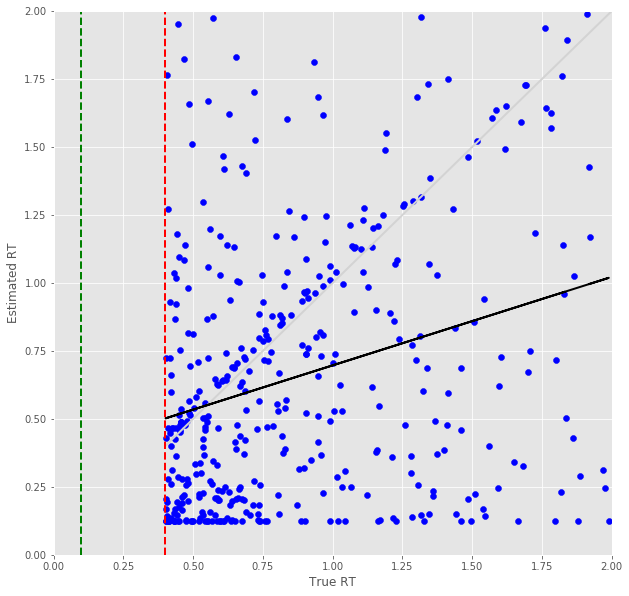

Error Prediction Score: 0.5879 RMSE
RT Prediction Score: 0.6538 RMSE
Error Prediction Corr: 0.4618
RT Prediction Corr: 0.1256
R^2 score for regression on Error: 0.2132
k = 0.7825


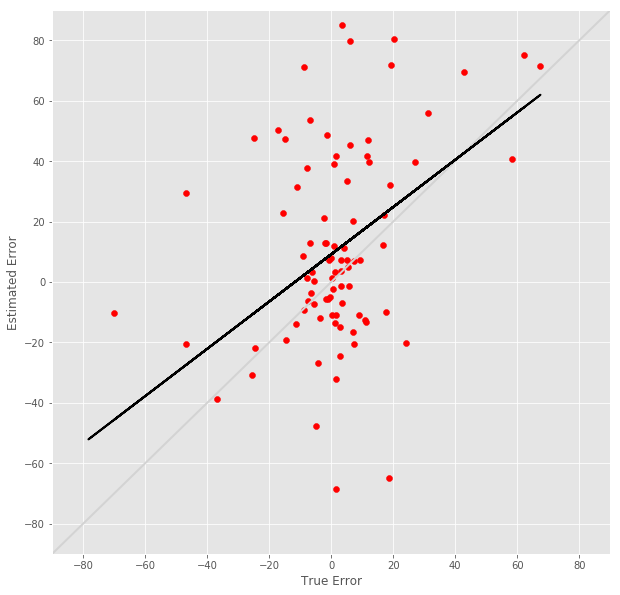

R^2 score for regression on RT: 0.0158
k = 0.1509


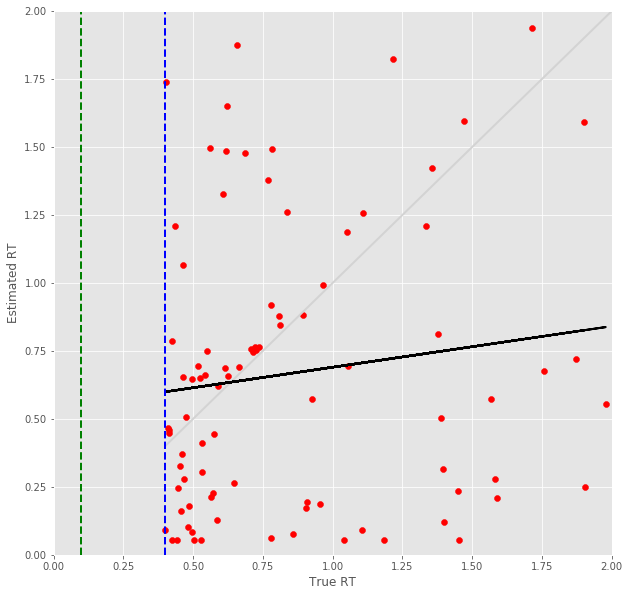

26 -step(s) forecast:
Test Score for 26 -steps forecast: 2.7681 RMSE
Predict Score for 26 -steps forecast: 2.5900 RMSE
Error Test Score for 26 -steps forecast: 0.5628 RMSE
RT Test Score for 26 -steps forecast: 0.5907 RMSE
Error Test Corr for 26 -steps forecast: 0.6038
RT Test Corr for 26 -steps forecast: 0.2708


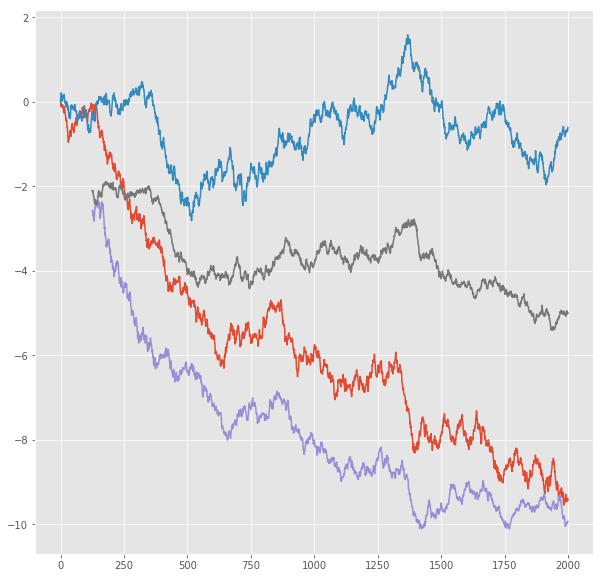

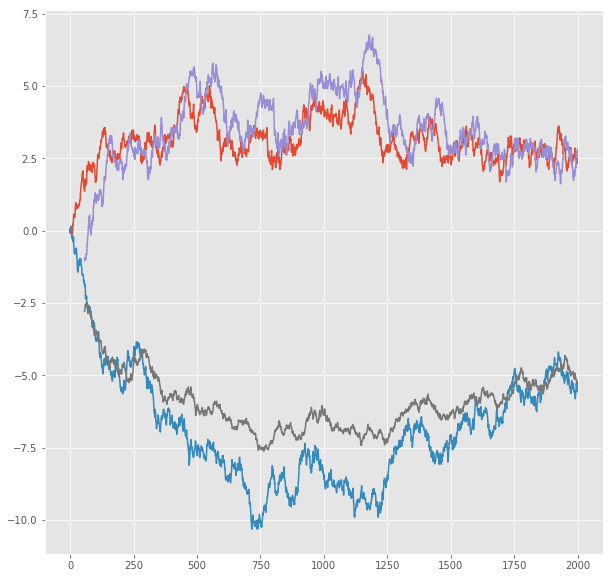

R^2 score for regression on Error: 0.3646
k = 1.0129


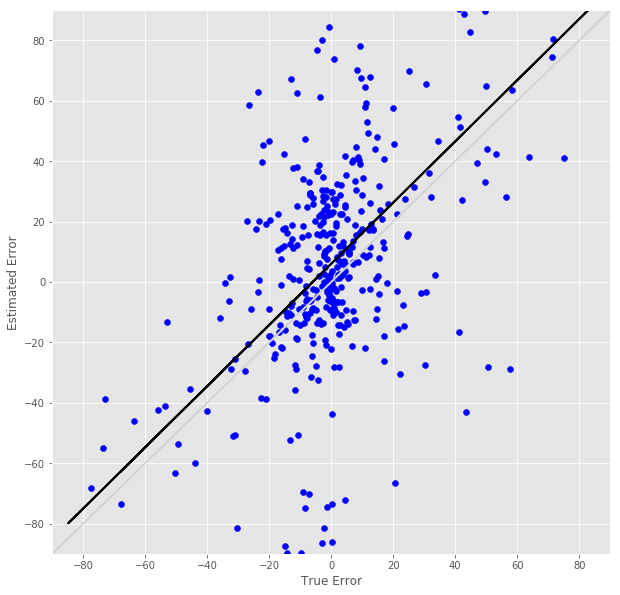

R^2 score for regression on RT: 0.0733
k = 0.3087


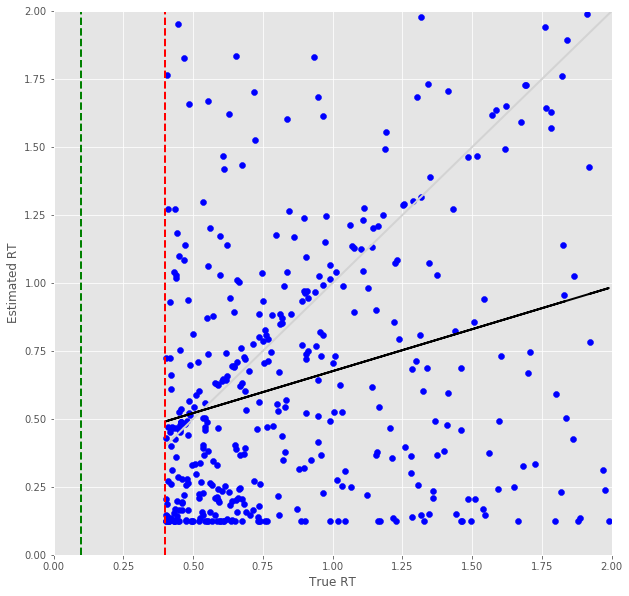

Error Prediction Score: 0.6009 RMSE
RT Prediction Score: 0.6606 RMSE
Error Prediction Corr: 0.4568
RT Prediction Corr: 0.1176
R^2 score for regression on Error: 0.2087
k = 0.7874


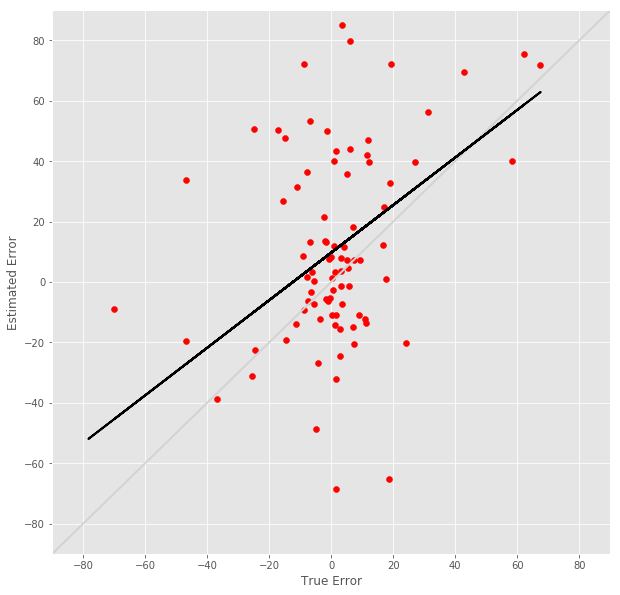

R^2 score for regression on RT: 0.0138
k = 0.1423


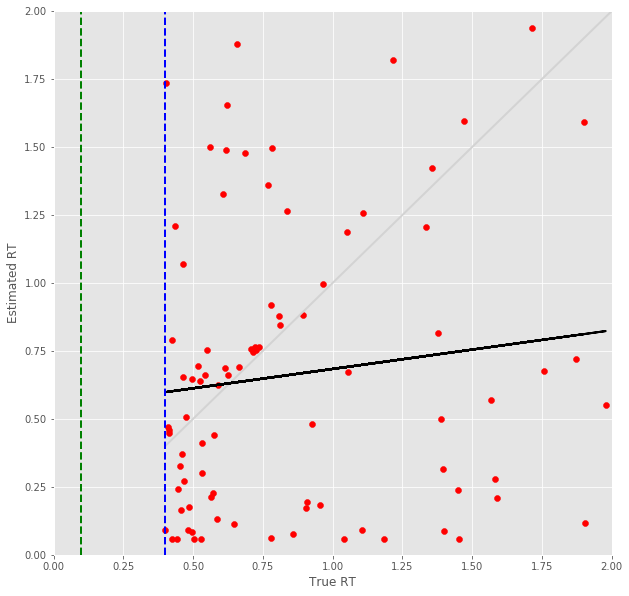

27 -step(s) forecast:
Test Score for 27 -steps forecast: 2.8551 RMSE
Predict Score for 27 -steps forecast: 2.6688 RMSE
Error Test Score for 27 -steps forecast: 0.5686 RMSE
RT Test Score for 27 -steps forecast: 0.5984 RMSE
Error Test Corr for 27 -steps forecast: 0.6003
RT Test Corr for 27 -steps forecast: 0.2663


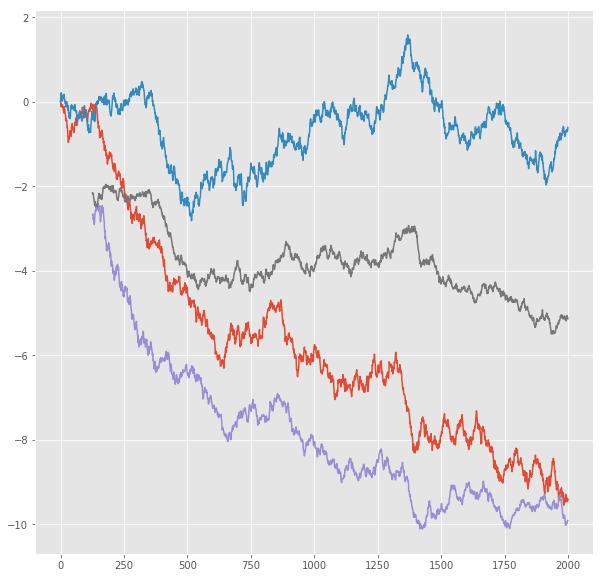

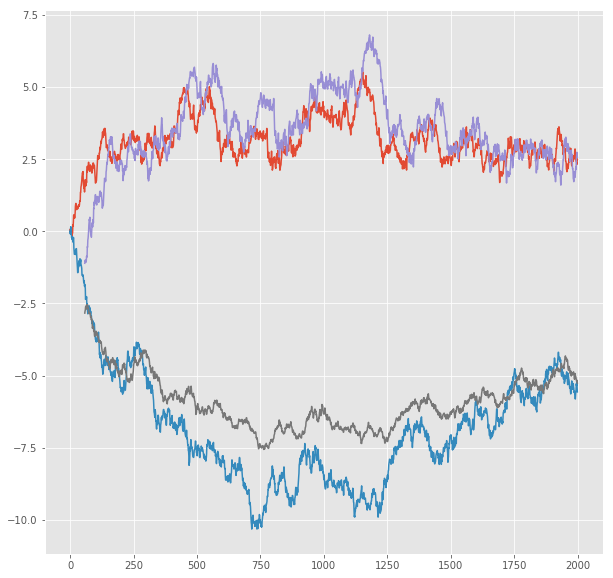

R^2 score for regression on Error: 0.3604
k = 1.0126


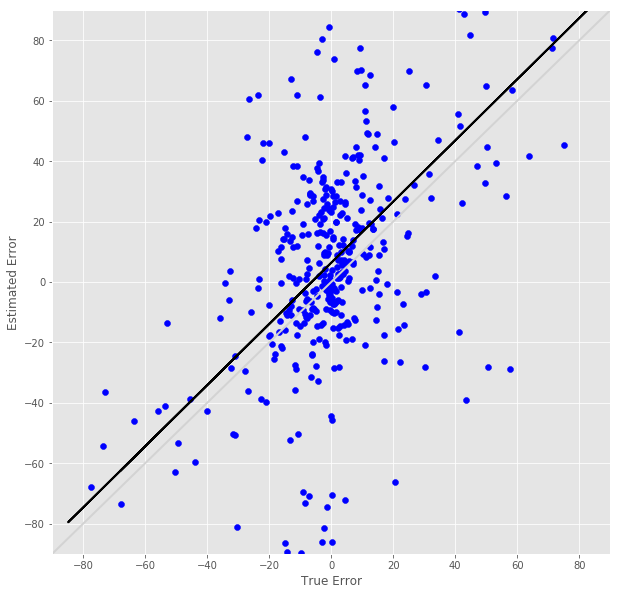

R^2 score for regression on RT: 0.0709
k = 0.3038


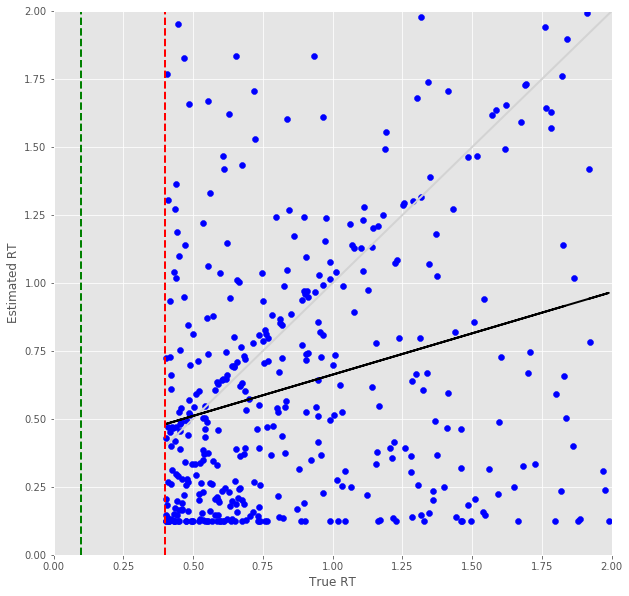

Error Prediction Score: 0.6093 RMSE
RT Prediction Score: 0.6686 RMSE
Error Prediction Corr: 0.4571
RT Prediction Corr: 0.1067
R^2 score for regression on Error: 0.2090
k = 0.7913


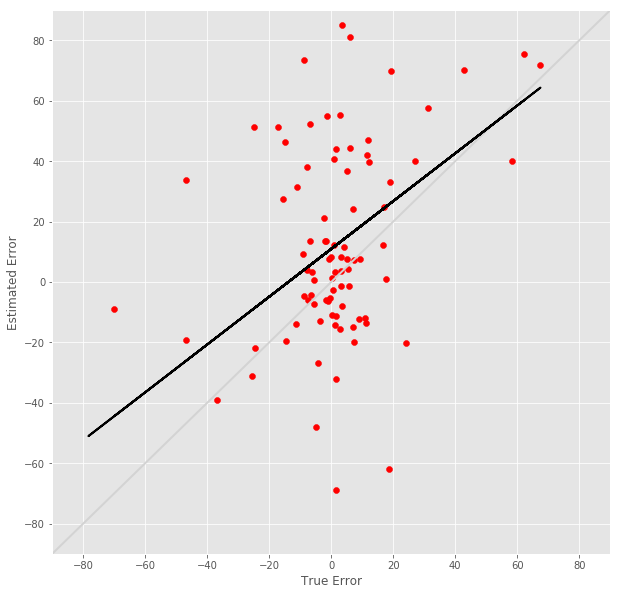

R^2 score for regression on RT: 0.0114
k = 0.1306


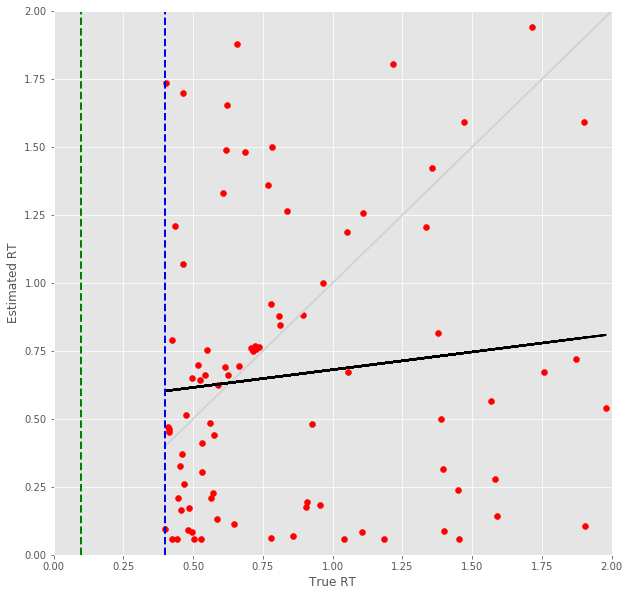

28 -step(s) forecast:
Test Score for 28 -steps forecast: 2.9413 RMSE
Predict Score for 28 -steps forecast: 2.7470 RMSE
Error Test Score for 28 -steps forecast: 0.5733 RMSE
RT Test Score for 28 -steps forecast: 0.6012 RMSE
Error Test Corr for 28 -steps forecast: 0.5970
RT Test Corr for 28 -steps forecast: 0.2664


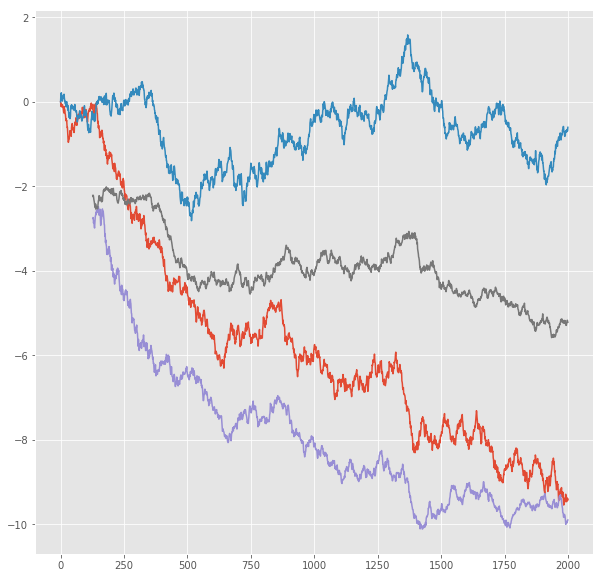

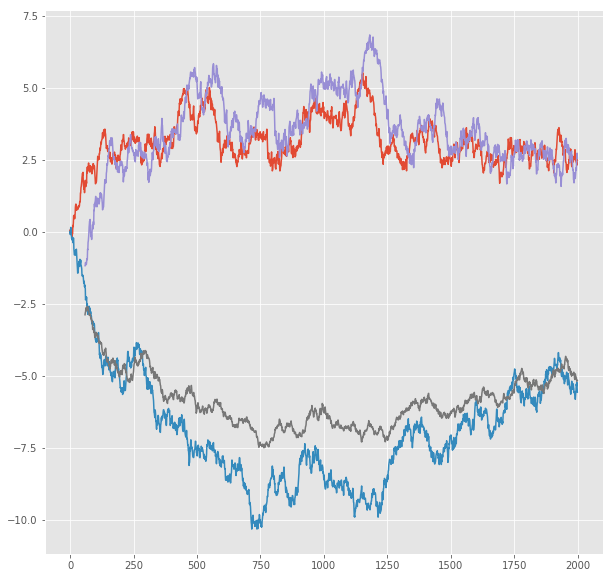

R^2 score for regression on Error: 0.3564
k = 1.0104


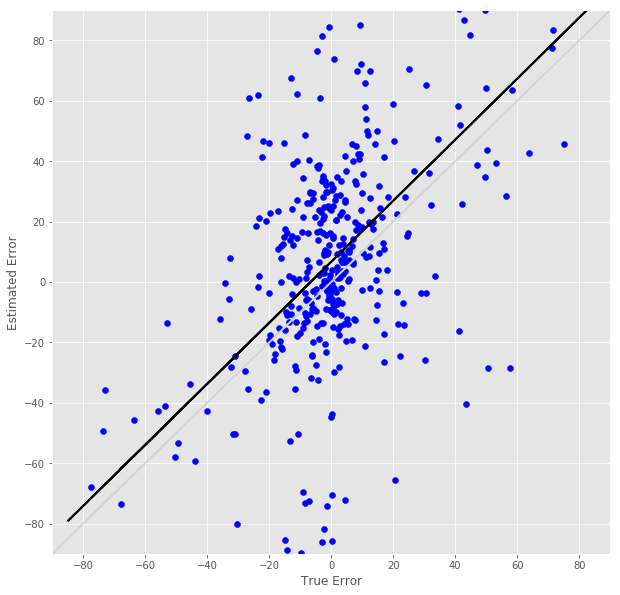

R^2 score for regression on RT: 0.0710
k = 0.3025


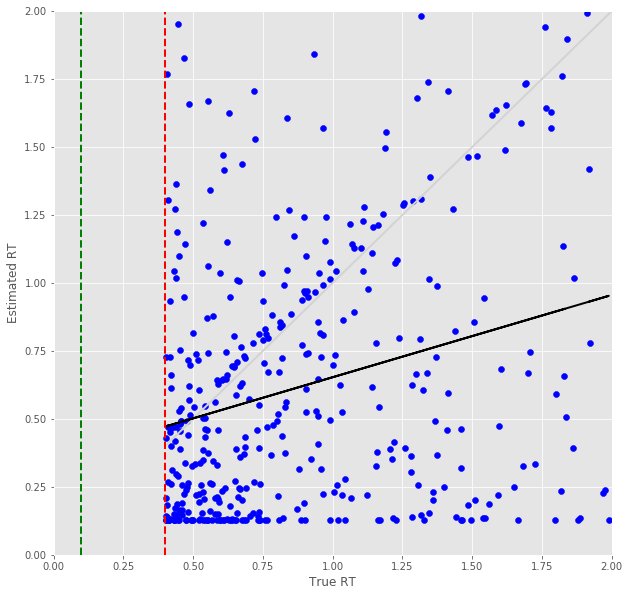

Error Prediction Score: 0.6205 RMSE
RT Prediction Score: 0.6803 RMSE
Error Prediction Corr: 0.4291
RT Prediction Corr: 0.1107
R^2 score for regression on Error: 0.1841
k = 0.7485


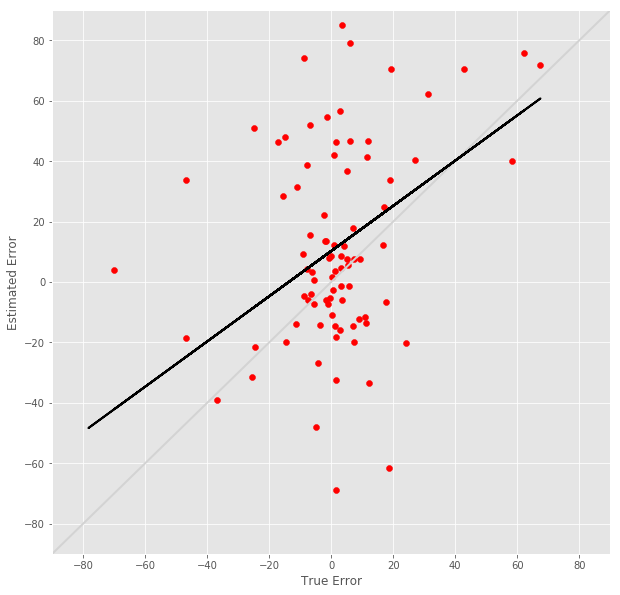

R^2 score for regression on RT: 0.0123
k = 0.1390


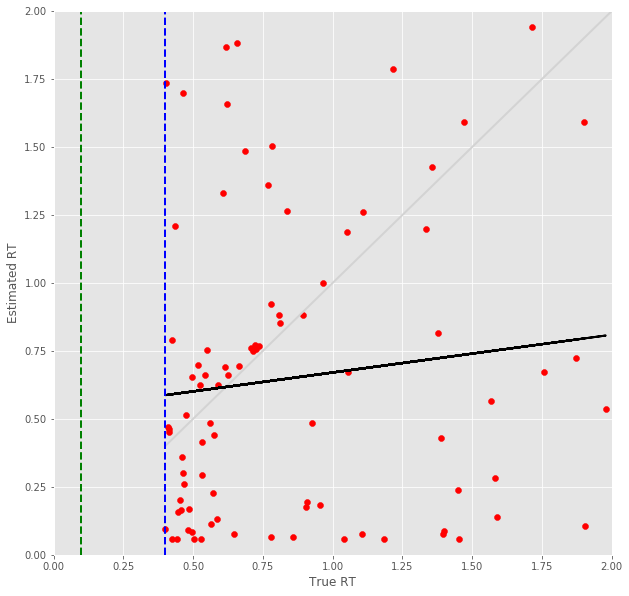

29 -step(s) forecast:
Test Score for 29 -steps forecast: 3.0268 RMSE
Predict Score for 29 -steps forecast: 2.8243 RMSE
Error Test Score for 29 -steps forecast: 0.5791 RMSE
RT Test Score for 29 -steps forecast: 0.6111 RMSE
Error Test Corr for 29 -steps forecast: 0.5930
RT Test Corr for 29 -steps forecast: 0.2549


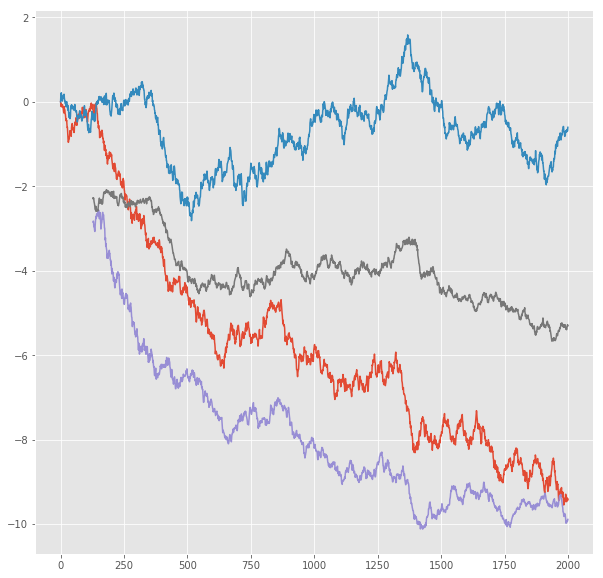

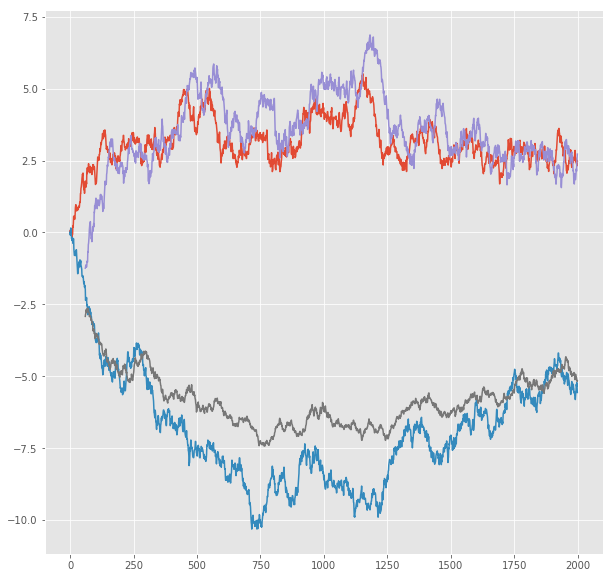

R^2 score for regression on Error: 0.3517
k = 1.0103


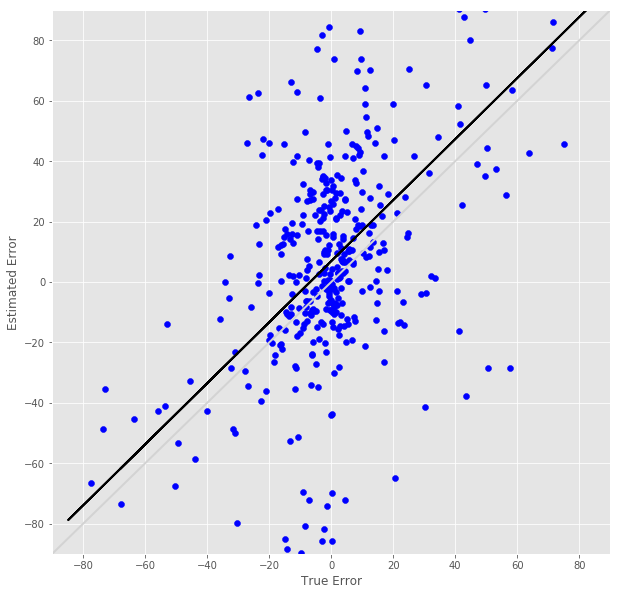

R^2 score for regression on RT: 0.0650
k = 0.2885


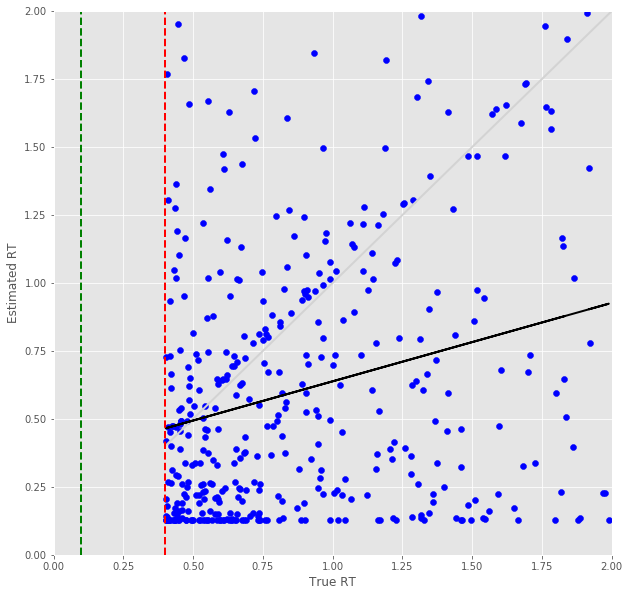

Error Prediction Score: 0.6426 RMSE
RT Prediction Score: 0.6723 RMSE
Error Prediction Corr: 0.4516
RT Prediction Corr: 0.1268
R^2 score for regression on Error: 0.2039
k = 0.8172


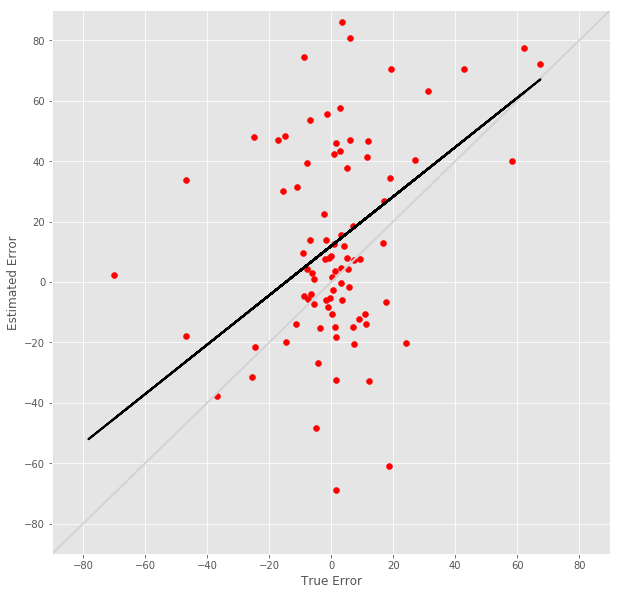

R^2 score for regression on RT: 0.0161
k = 0.1554


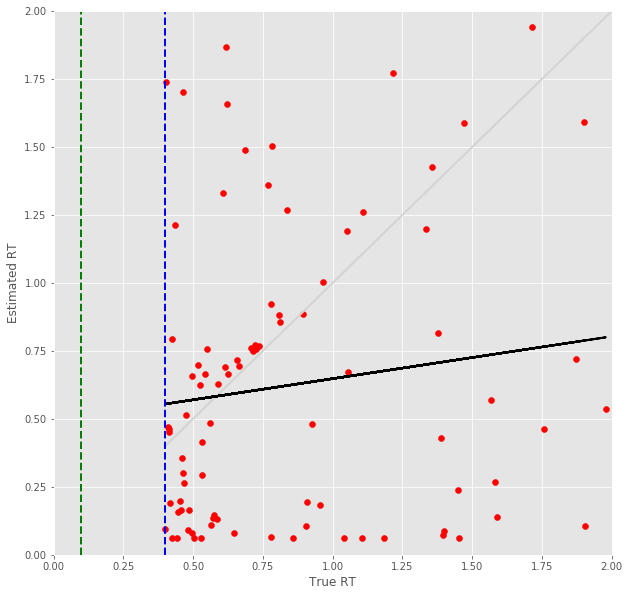

30 -step(s) forecast:
Test Score for 30 -steps forecast: 3.1115 RMSE
Predict Score for 30 -steps forecast: 2.9009 RMSE
Error Test Score for 30 -steps forecast: 0.5850 RMSE
RT Test Score for 30 -steps forecast: 0.6187 RMSE
Error Test Corr for 30 -steps forecast: 0.5854
RT Test Corr for 30 -steps forecast: 0.2482


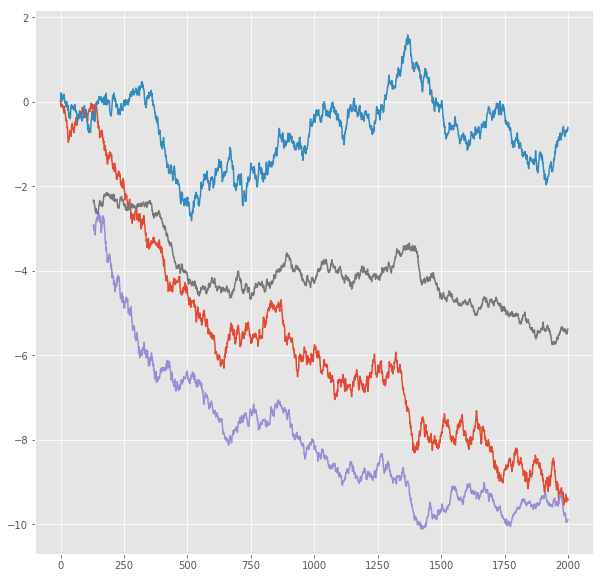

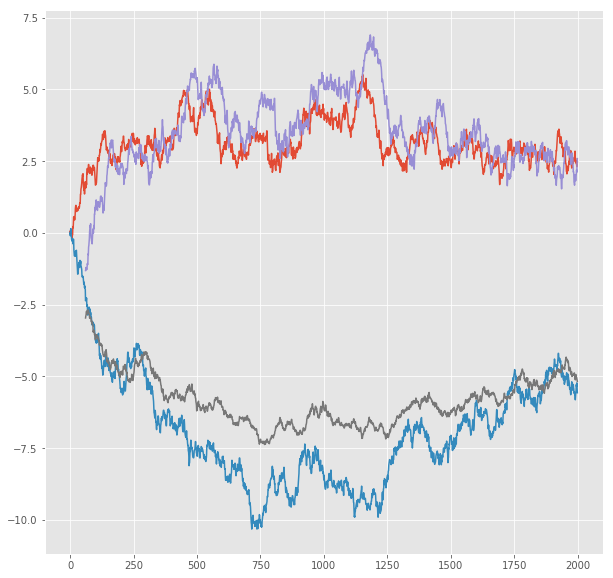

R^2 score for regression on Error: 0.3427
k = 0.9991


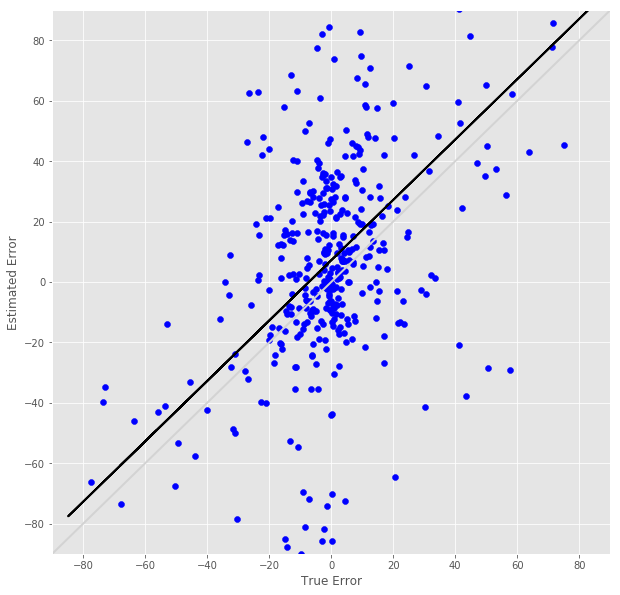

R^2 score for regression on RT: 0.0616
k = 0.2783


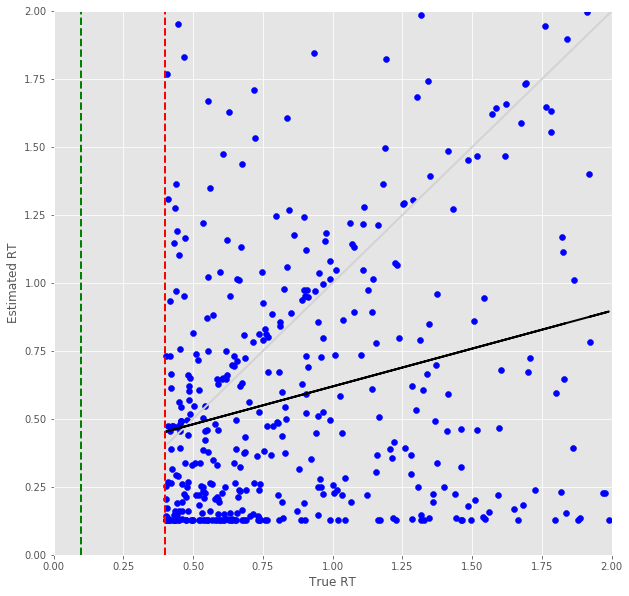

Error Prediction Score: 0.6465 RMSE
RT Prediction Score: 0.6829 RMSE
Error Prediction Corr: 0.3889
RT Prediction Corr: 0.0996
R^2 score for regression on Error: 0.1512
k = 0.6900


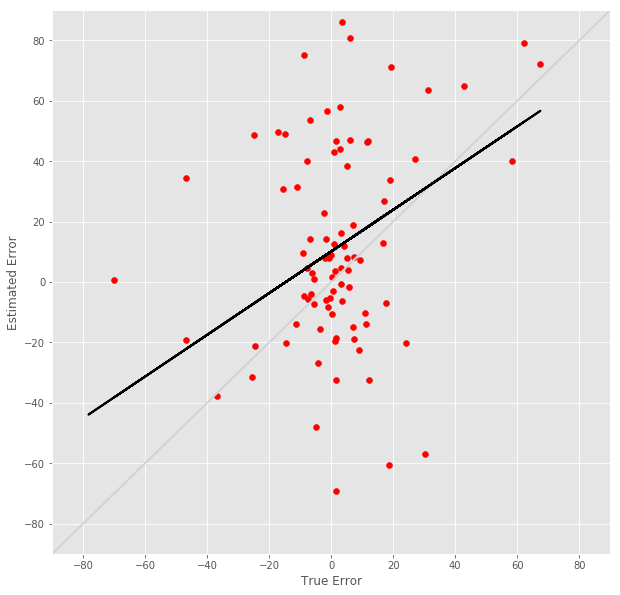

R^2 score for regression on RT: 0.0099
k = 0.1211


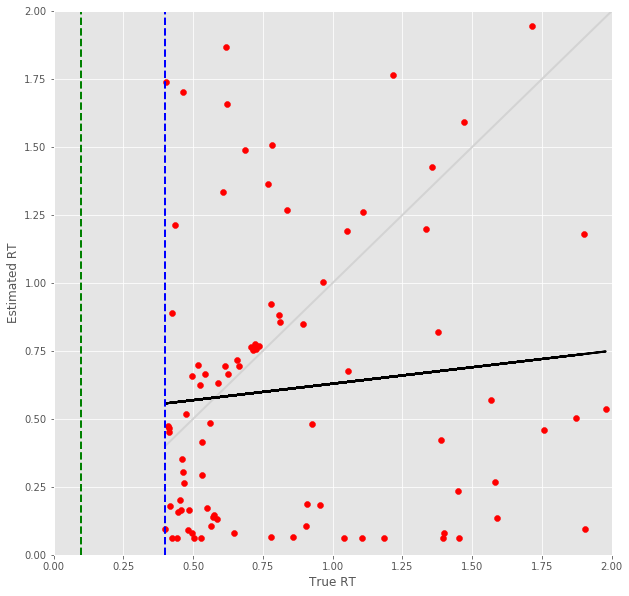

31 -step(s) forecast:
Test Score for 31 -steps forecast: 3.1954 RMSE
Predict Score for 31 -steps forecast: 2.9767 RMSE
Error Test Score for 31 -steps forecast: 0.5939 RMSE
RT Test Score for 31 -steps forecast: 0.6280 RMSE
Error Test Corr for 31 -steps forecast: 0.5829
RT Test Corr for 31 -steps forecast: 0.2325


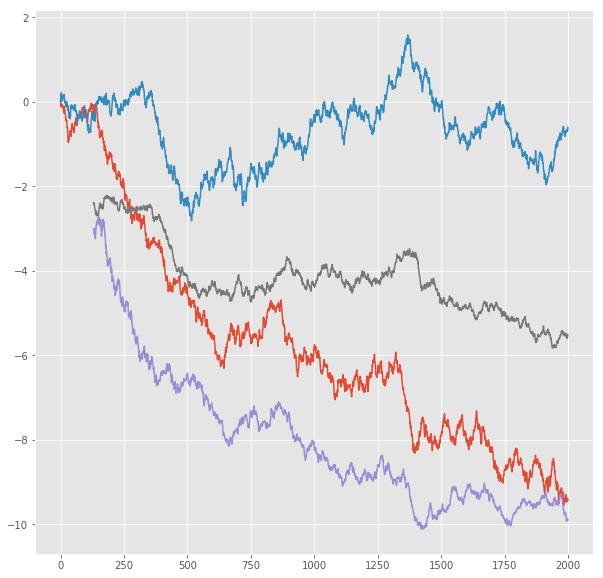

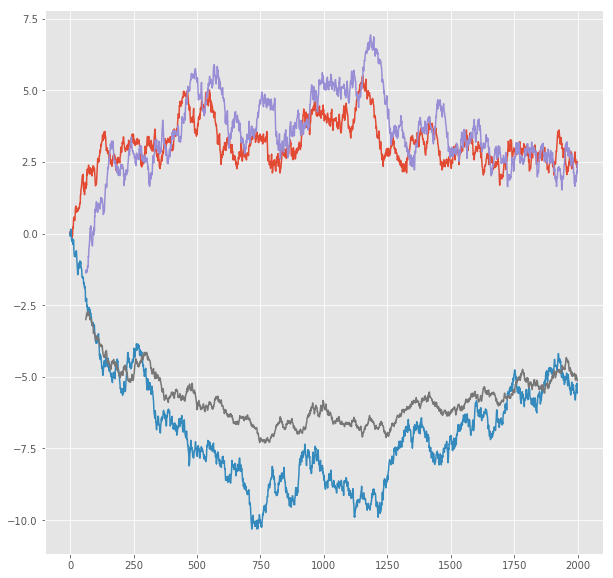

R^2 score for regression on Error: 0.3397
k = 1.0078


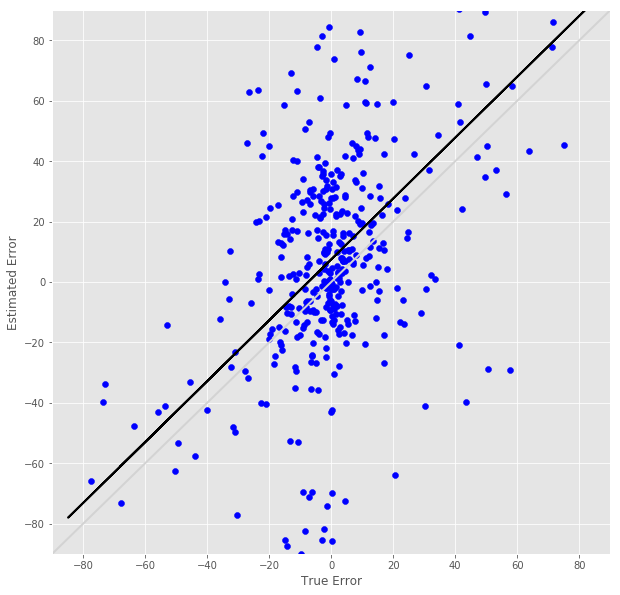

R^2 score for regression on RT: 0.0541
k = 0.2602


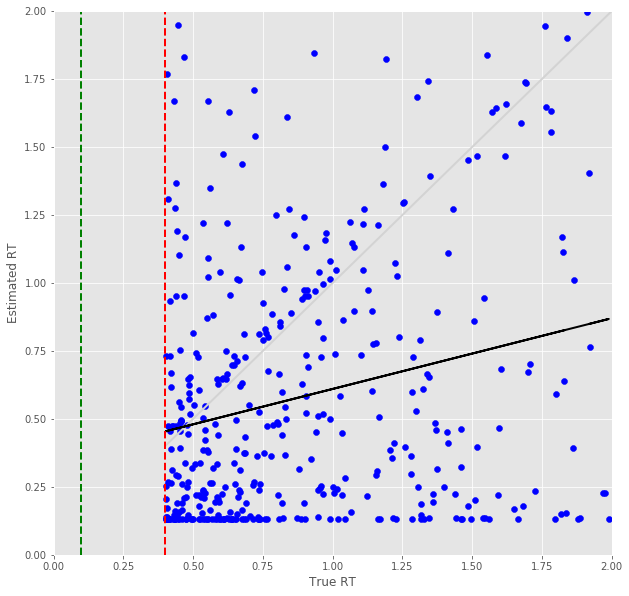

Error Prediction Score: 0.6503 RMSE
RT Prediction Score: 0.6984 RMSE
Error Prediction Corr: 0.3896
RT Prediction Corr: 0.0685
R^2 score for regression on Error: 0.1518
k = 0.6954


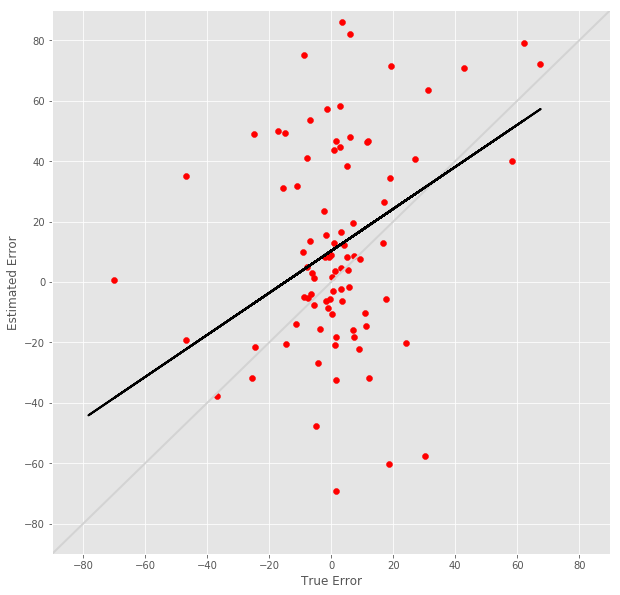

R^2 score for regression on RT: 0.0047
k = 0.0839


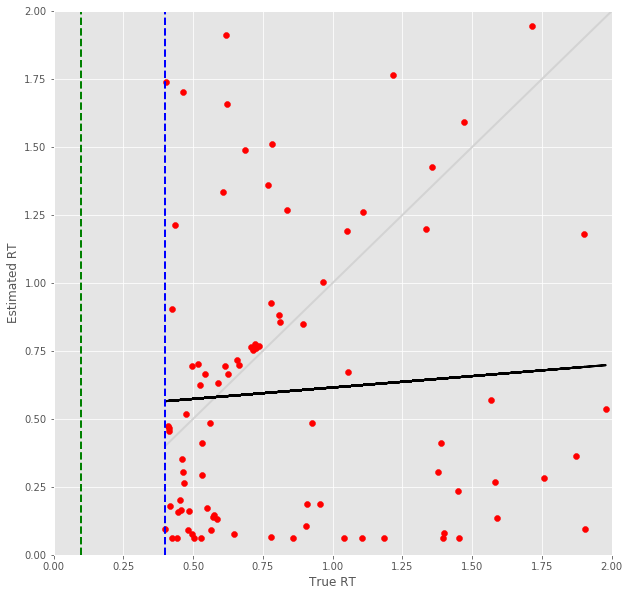

32 -step(s) forecast:
Test Score for 32 -steps forecast: 3.2785 RMSE
Predict Score for 32 -steps forecast: 3.0518 RMSE
Error Test Score for 32 -steps forecast: 0.6011 RMSE
RT Test Score for 32 -steps forecast: 0.6363 RMSE
Error Test Corr for 32 -steps forecast: 0.5840
RT Test Corr for 32 -steps forecast: 0.2198


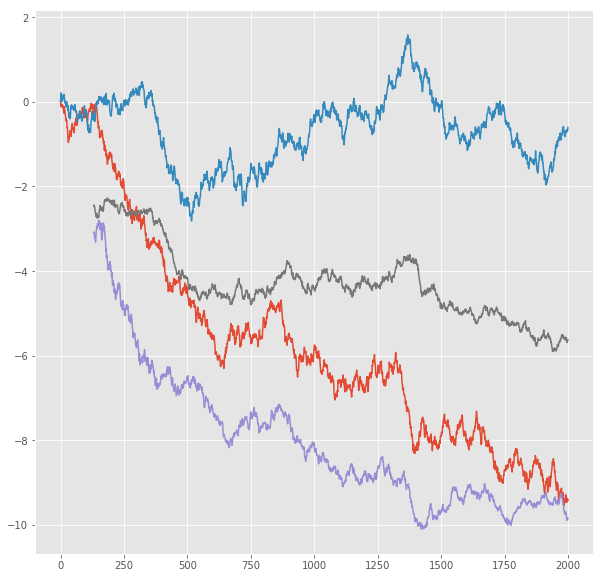

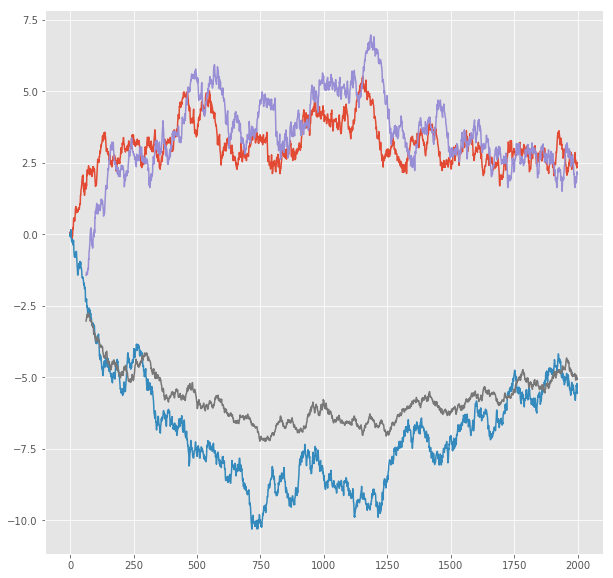

R^2 score for regression on Error: 0.3410
k = 1.0217


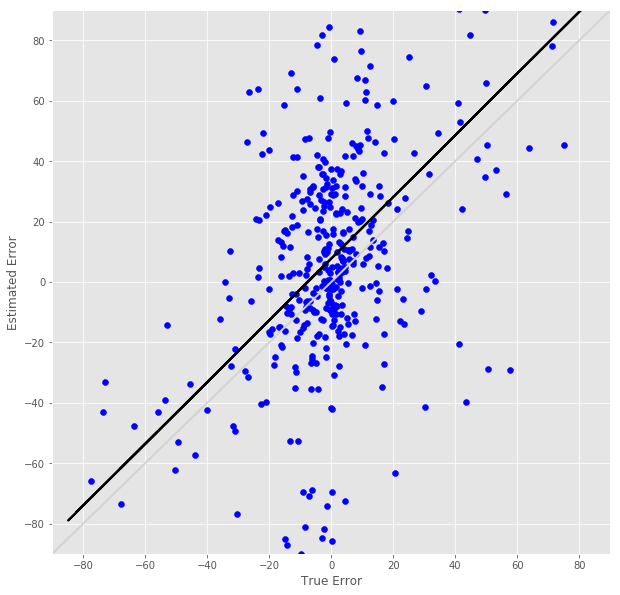

R^2 score for regression on RT: 0.0483
k = 0.2467


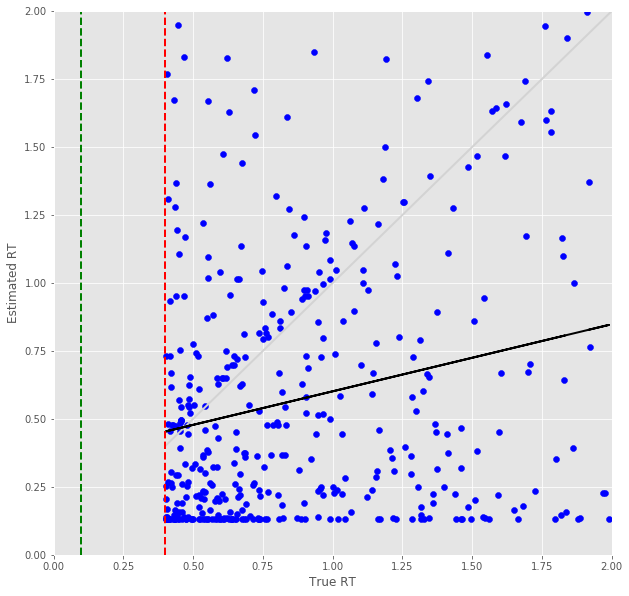

Error Prediction Score: 0.6564 RMSE
RT Prediction Score: 0.6945 RMSE
Error Prediction Corr: 0.3907
RT Prediction Corr: 0.0873
R^2 score for regression on Error: 0.1527
k = 0.6994


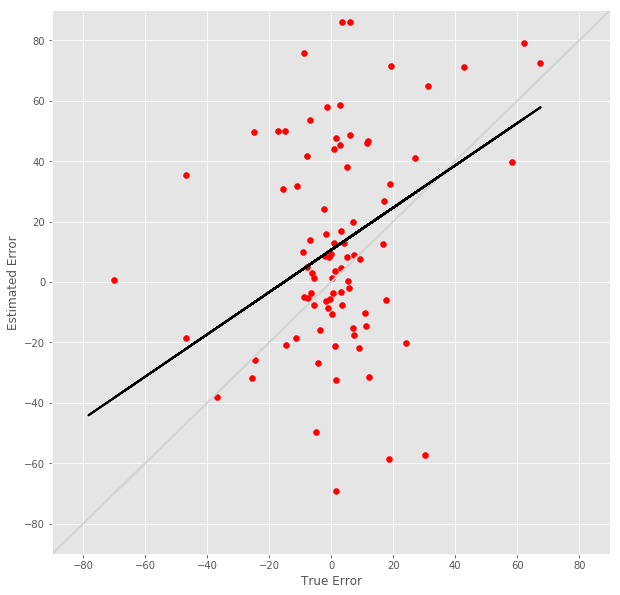

R^2 score for regression on RT: 0.0076
k = 0.1032


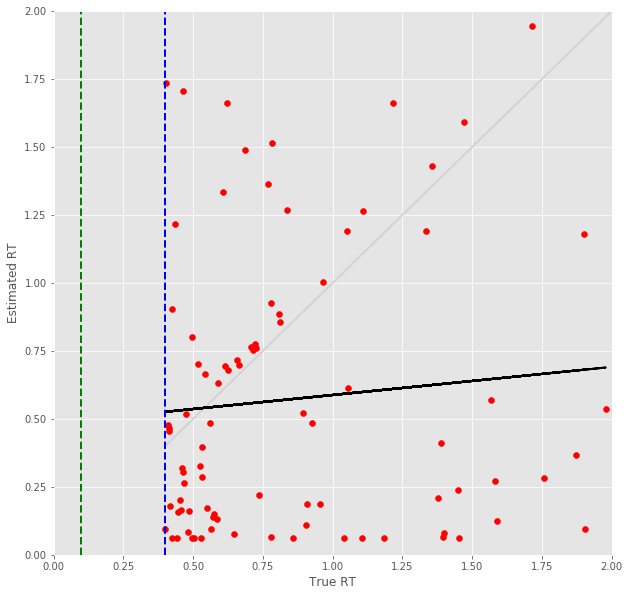

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

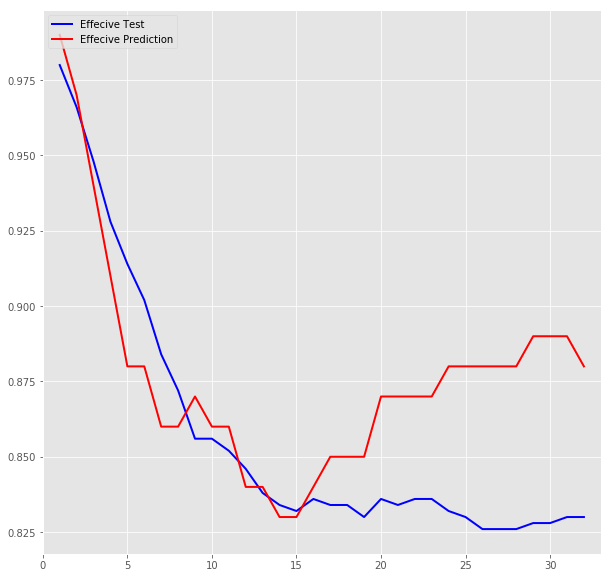

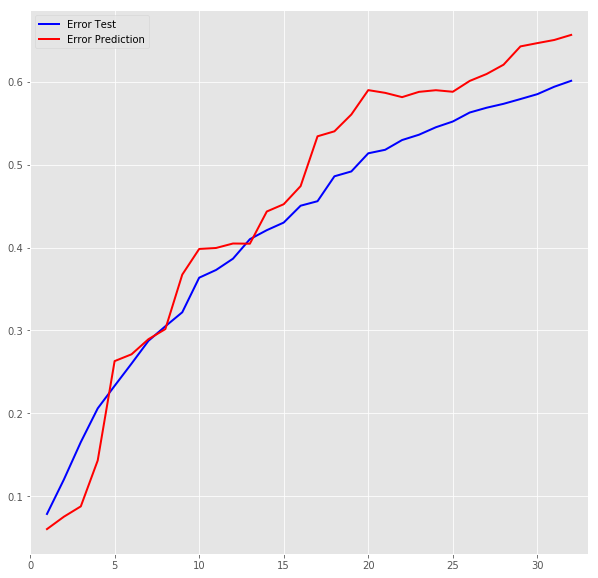

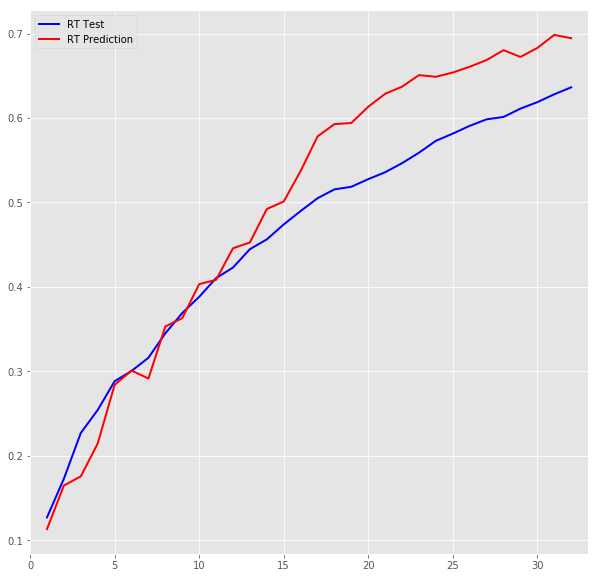

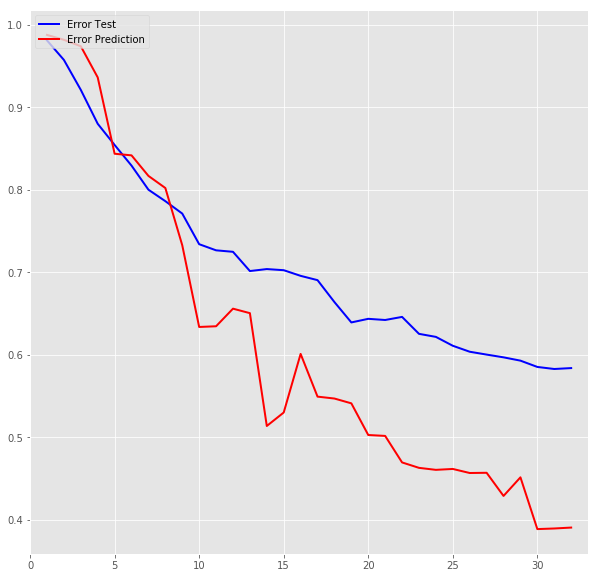

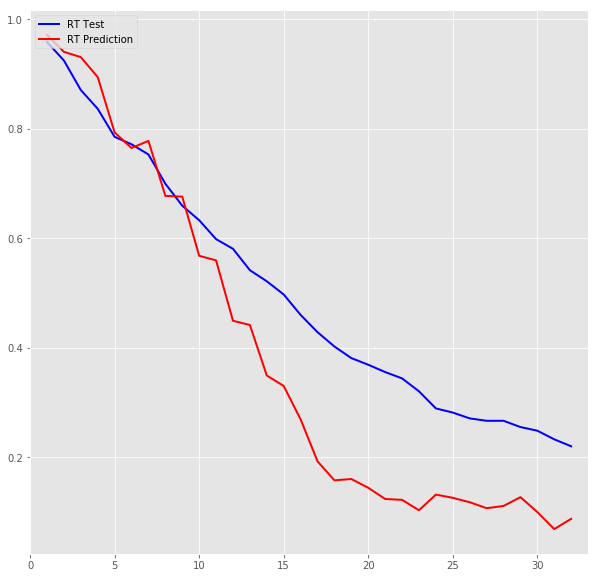

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
